#Finding an Edge in Sports Betting

##Pre-Model Work

link to main data set - https://github.com/nflverse/nfl_data_py

###Set Up

In [1]:
!pip install nfl_data_py

In [2]:
import nfl_data_py as nfl
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import sklearn
from collections import defaultdict

In [3]:
#all data entries have a spread_line value and game margin (target variable)
#game margin is defined as home team points minus away team points, so it can be negative
match_df = nfl.import_schedules([year for year in range(2009, 2025)])

#check for nan values
print(match_df.shape)
pd.set_option("display.max_columns", None)
matches_df = match_df.dropna(subset=['spread_line', 'result'])
print(match_df.shape)

#move the result and the spread line towards the front of the df for visibility
spread_line = match_df.pop('spread_line')
match_df.insert(1, spread_line.name, spread_line)

game_margin = match_df.pop('result')
match_df.insert(1, 'game_margin', game_margin)

match_df

(4345, 46)
(4345, 46)


,game_id,game_margin,spread_line,season,game_type,week,gameday,weekday,gametime,away_team,away_score,home_team,home_score,location,total,overtime,old_game_id,gsis,nfl_detail_id,pfr,pff,espn,ftn,away_rest,home_rest,away_moneyline,home_moneyline,away_spread_odds,home_spread_odds,total_line,under_odds,over_odds,div_game,roof,surface,temp,wind,away_qb_id,home_qb_id,away_qb_name,home_qb_name,away_coach,home_coach,referee,stadium_id,stadium
2646,2009_01_TEN_PIT,3.0,6.5,2009,REG,1,2009-09-10,Thursday,20:30,TEN,10.0,PIT,13.0,Home,23.0,1.0,2009091000,54467.0,NaN,200909100pit,1395.0,290910023.0,NaN,7,7,228.0,-260.0,-116.0,107.0,35.5,-106.0,-104.0,0,outdoors,dessograss,67.0,9.0,00-0003292,00-0022924,Kerry Collins,Ben Roethlisberger,Jeff Fisher,Mike Tomlin,Bill Leavy,PIT00,Heinz Field
2647,2009_01_MIA_ATL,12.0,4.0,2009,REG,1,2009-09-13,Sunday,13:00,MIA,7.0,ATL,19.0,Home,26.0,0.0,2009091300,54468.0,NaN,200909130atl,1396.0,290913001.0,NaN,7,7,190.0,-210.0,-104.0,-104.0,44.0,-103.0,-107.0,0,dome,fieldturf,NaN,NaN,00-0019559,00-0026143,Chad Pennington,Matt Ryan,Tony Sparano,Mike Smith,Walt Coleman,ATL00,Georgia Dome
2648,2009_01_KC_BAL,14.0,13.0,2009,REG,1,2009-09-13,Sunday,13:00,KC,24.0,BAL,38.0,Home,62.0,0.0,2009091301,54469.0,NaN,200909130rav,1398.0,290913033.0,NaN,7,7,570.0,-700.0,-112.0,104.0,36.5,-103.0,-107.0,0,outdoors,sportturf,76.0,5.0,00-0024300,00-0026158,Brodie Croyle,Joe Flacco,Todd Haley,John Harbaugh,Gene Steratore,BAL00,M&T Bank Stadium
2649,2009_01_PHI_CAR,-28.0,-1.0,2009,REG,1,2009-09-13,Sunday,13:00,PHI,38.0,CAR,10.0,Home,48.0,0.0,2009091302,54470.0,NaN,200909130car,1404.0,290913029.0,NaN,7,7,-125.0,115.0,-120.0,111.0,43.5,-103.0,-107.0,0,outdoors,grass,82.0,5.0,00-0011022,00-0004161,Donovan McNabb,Jake Delhomme,Andy Reid,John Fox,Jeff Triplette,CAR00,Bank of America Stadium
2650,2009_01_DEN_CIN,-5.0,4.5,2009,REG,1,2009-09-13,Sunday,13:00,DEN,12.0,CIN,7.0,Home,19.0,0.0,2009091303,54471.0,NaN,200909130cin,1403.0,290913004.0,NaN,7,7,196.0,-222.0,-104.0,-104.0,41.0,-112.0,102.0,0,outdoors,fieldturf,73.0,7.0,00-0023541,00-0021429,Kyle Orton,Carson Palmer,Josh McDaniels,Marvin Lewis,Jerome Boger,CIN00,Paul Brown Stadium
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6986,2024_20_LA_PHI,6.0,7.0,2024,DIV,20,2025-01-19,Sunday,15:00,LA,22.0,PHI,28.0,Home,50.0,0.0,2025011900,59837.0,NaN,202501190phi,NaN,401671937.0,NaN,6,7,260.0,-325.0,-112.0,-108.0,43.5,-110.0,-110.0,0,outdoors,grass,34.0,8.0,00-0026498,00-0036389,Matthew Stafford,Jalen Hurts,Sean McVay,Nick Sirianni,Shawn Smith,PHI00,Lincoln Financial Field
6987,2024_20_BAL_BUF,2.0,-1.5,2024,DIV,20,2025-01-19,Sunday,18:30,BAL,25.0,BUF,27.0,Home,52.0,0.0,2025011901,59838.0,NaN,202501190buf,NaN,401671886.0,NaN,8,7,-118.0,-102.0,-102.0,-118.0,51.5,-105.0,-115.0,0,outdoors,a_turf,19.0,4.0,00-0034796,00-0034857,Lamar Jackson,Josh Allen,John Harbaugh,Sean McDermott,Carl Cheffers,BUF00,New Era Field
6988,2024_21_WAS_PHI,32.0,6.0,2024,CON,21,2025-01-26,Sunday,15:00,WAS,23.0,PHI,55.0,Home,78.0,0.0,2025012600,59839.0,NaN,202501260phi,NaN,401671888.0,NaN,8,7,205.0,-250.0,-110.0,-110.0,46.5,-105.0,-115.0,1,outdoors,grass,40.0,11.0,00-0039910,00-0036389,Jayden Daniels,Jalen Hurts,Dan Quinn,Nick Sirianni,Shawn Hochuli,PHI00,Lincoln Financial Field
6989,2024_21_BUF_KC,3.0,1.5,2024,CON,21,2025-01-26,Sunday,18:30,BUF,29.0,KC,32.0,Home,61.0,0.0,2025012601,59840.0,NaN,202501260kan,NaN,401671887.0,NaN,7,8,-102.0,-118.0,-115.0,-105.0,49.5,-115.0,-105.0,0,outdoors,grass,31.0,8.0,00-0034857,00-0033873,Josh Allen,Patrick Mahomes,Sean McDermott,Andy Reid,Clete Blakeman,KAN00,GEHA Field at Arrowhead Stadium


##Data Cleaning / Data Manipulation

###Adding is_playoff and is_final_week features, shows if a match is a playoff game, final game of regular season or neither.

In [4]:
#add a feature to include if a match is a playoff or regular season event -> regular season games tend to have more noise, if teams get super far behind in the regular season they may pull their starters, but in the playoffs all teams try the hardest they possibly can
match_df['is_playoff'] = match_df['game_type'] != 'REG'
match_df

,game_id,game_margin,spread_line,season,game_type,week,gameday,weekday,gametime,away_team,away_score,home_team,home_score,location,total,overtime,old_game_id,gsis,nfl_detail_id,pfr,pff,espn,ftn,away_rest,home_rest,away_moneyline,home_moneyline,away_spread_odds,home_spread_odds,total_line,under_odds,over_odds,div_game,roof,surface,temp,wind,away_qb_id,home_qb_id,away_qb_name,home_qb_name,away_coach,home_coach,referee,stadium_id,stadium,is_playoff
2646,2009_01_TEN_PIT,3.0,6.5,2009,REG,1,2009-09-10,Thursday,20:30,TEN,10.0,PIT,13.0,Home,23.0,1.0,2009091000,54467.0,NaN,200909100pit,1395.0,290910023.0,NaN,7,7,228.0,-260.0,-116.0,107.0,35.5,-106.0,-104.0,0,outdoors,dessograss,67.0,9.0,00-0003292,00-0022924,Kerry Collins,Ben Roethlisberger,Jeff Fisher,Mike Tomlin,Bill Leavy,PIT00,Heinz Field,False
2647,2009_01_MIA_ATL,12.0,4.0,2009,REG,1,2009-09-13,Sunday,13:00,MIA,7.0,ATL,19.0,Home,26.0,0.0,2009091300,54468.0,NaN,200909130atl,1396.0,290913001.0,NaN,7,7,190.0,-210.0,-104.0,-104.0,44.0,-103.0,-107.0,0,dome,fieldturf,NaN,NaN,00-0019559,00-0026143,Chad Pennington,Matt Ryan,Tony Sparano,Mike Smith,Walt Coleman,ATL00,Georgia Dome,False
2648,2009_01_KC_BAL,14.0,13.0,2009,REG,1,2009-09-13,Sunday,13:00,KC,24.0,BAL,38.0,Home,62.0,0.0,2009091301,54469.0,NaN,200909130rav,1398.0,290913033.0,NaN,7,7,570.0,-700.0,-112.0,104.0,36.5,-103.0,-107.0,0,outdoors,sportturf,76.0,5.0,00-0024300,00-0026158,Brodie Croyle,Joe Flacco,Todd Haley,John Harbaugh,Gene Steratore,BAL00,M&T Bank Stadium,False
2649,2009_01_PHI_CAR,-28.0,-1.0,2009,REG,1,2009-09-13,Sunday,13:00,PHI,38.0,CAR,10.0,Home,48.0,0.0,2009091302,54470.0,NaN,200909130car,1404.0,290913029.0,NaN,7,7,-125.0,115.0,-120.0,111.0,43.5,-103.0,-107.0,0,outdoors,grass,82.0,5.0,00-0011022,00-0004161,Donovan McNabb,Jake Delhomme,Andy Reid,John Fox,Jeff Triplette,CAR00,Bank of America Stadium,False
2650,2009_01_DEN_CIN,-5.0,4.5,2009,REG,1,2009-09-13,Sunday,13:00,DEN,12.0,CIN,7.0,Home,19.0,0.0,2009091303,54471.0,NaN,200909130cin,1403.0,290913004.0,NaN,7,7,196.0,-222.0,-104.0,-104.0,41.0,-112.0,102.0,0,outdoors,fieldturf,73.0,7.0,00-0023541,00-0021429,Kyle Orton,Carson Palmer,Josh McDaniels,Marvin Lewis,Jerome Boger,CIN00,Paul Brown Stadium,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6986,2024_20_LA_PHI,6.0,7.0,2024,DIV,20,2025-01-19,Sunday,15:00,LA,22.0,PHI,28.0,Home,50.0,0.0,2025011900,59837.0,NaN,202501190phi,NaN,401671937.0,NaN,6,7,260.0,-325.0,-112.0,-108.0,43.5,-110.0,-110.0,0,outdoors,grass,34.0,8.0,00-0026498,00-0036389,Matthew Stafford,Jalen Hurts,Sean McVay,Nick Sirianni,Shawn Smith,PHI00,Lincoln Financial Field,True
6987,2024_20_BAL_BUF,2.0,-1.5,2024,DIV,20,2025-01-19,Sunday,18:30,BAL,25.0,BUF,27.0,Home,52.0,0.0,2025011901,59838.0,NaN,202501190buf,NaN,401671886.0,NaN,8,7,-118.0,-102.0,-102.0,-118.0,51.5,-105.0,-115.0,0,outdoors,a_turf,19.0,4.0,00-0034796,00-0034857,Lamar Jackson,Josh Allen,John Harbaugh,Sean McDermott,Carl Cheffers,BUF00,New Era Field,True
6988,2024_21_WAS_PHI,32.0,6.0,2024,CON,21,2025-01-26,Sunday,15:00,WAS,23.0,PHI,55.0,Home,78.0,0.0,2025012600,59839.0,NaN,202501260phi,NaN,401671888.0,NaN,8,7,205.0,-250.0,-110.0,-110.0,46.5,-105.0,-115.0,1,outdoors,grass,40.0,11.0,00-0039910,00-0036389,Jayden Daniels,Jalen Hurts,Dan Quinn,Nick Sirianni,Shawn Hochuli,PHI00,Lincoln Financial Field,True
6989,2024_21_BUF_KC,3.0,1.5,2024,CON,21,2025-01-26,Sunday,18:30,BUF,29.0,KC,32.0,Home,61.0,0.0,2025012601,59840.0,NaN,202501260kan,NaN,401671887.0,NaN,7,8,-102.0,-118.0,-115.0,-105.0,49.5,-115.0,-105.0,0,outdoors,grass,31.0,8.0,00-0034857,00-0033873,Josh Allen,Patrick Mahomes,Sean McDermott,Andy Reid,Clete Blakeman,KAN00,GEHA Field at Arrowhead Stadium,True


In [5]:
#add a feature to include if a match is the last week of the regular season - teams tend to rest starters either to prepare for the playoffs or because they are already out of playoff contention

#gather up the final week of the regular season from 2000 to 2024...keeps code flexible but from knowledge 2000 through 2020 is 17 weeks and the last 4 years are 18 weeks. In the future they may extend the season further
final_week = (match_df[match_df['is_playoff'] == False].groupby('season')['week'].max().reset_index().rename(columns={'week': 'final_week_of_reg_szn'}))
final_week.head()

,season,final_week_of_reg_szn
0,2009,17
1,2010,17
2,2011,17
3,2012,17
4,2013,17


In [6]:
#merge on the season, then create feature to flag for the final week of the regular season
match_df = match_df.merge(final_week, on='season', how='left')
match_df['is_final_week'] = (match_df['is_playoff'] == False) & (match_df['week'] == match_df['final_week_of_reg_szn'])

match_df

,game_id,game_margin,spread_line,season,game_type,week,gameday,weekday,gametime,away_team,away_score,home_team,home_score,location,total,overtime,old_game_id,gsis,nfl_detail_id,pfr,pff,espn,ftn,away_rest,home_rest,away_moneyline,home_moneyline,away_spread_odds,home_spread_odds,total_line,under_odds,over_odds,div_game,roof,surface,temp,wind,away_qb_id,home_qb_id,away_qb_name,home_qb_name,away_coach,home_coach,referee,stadium_id,stadium,is_playoff,final_week_of_reg_szn,is_final_week
0,2009_01_TEN_PIT,3.0,6.5,2009,REG,1,2009-09-10,Thursday,20:30,TEN,10.0,PIT,13.0,Home,23.0,1.0,2009091000,54467.0,NaN,200909100pit,1395.0,290910023.0,NaN,7,7,228.0,-260.0,-116.0,107.0,35.5,-106.0,-104.0,0,outdoors,dessograss,67.0,9.0,00-0003292,00-0022924,Kerry Collins,Ben Roethlisberger,Jeff Fisher,Mike Tomlin,Bill Leavy,PIT00,Heinz Field,False,17,False
1,2009_01_MIA_ATL,12.0,4.0,2009,REG,1,2009-09-13,Sunday,13:00,MIA,7.0,ATL,19.0,Home,26.0,0.0,2009091300,54468.0,NaN,200909130atl,1396.0,290913001.0,NaN,7,7,190.0,-210.0,-104.0,-104.0,44.0,-103.0,-107.0,0,dome,fieldturf,NaN,NaN,00-0019559,00-0026143,Chad Pennington,Matt Ryan,Tony Sparano,Mike Smith,Walt Coleman,ATL00,Georgia Dome,False,17,False
2,2009_01_KC_BAL,14.0,13.0,2009,REG,1,2009-09-13,Sunday,13:00,KC,24.0,BAL,38.0,Home,62.0,0.0,2009091301,54469.0,NaN,200909130rav,1398.0,290913033.0,NaN,7,7,570.0,-700.0,-112.0,104.0,36.5,-103.0,-107.0,0,outdoors,sportturf,76.0,5.0,00-0024300,00-0026158,Brodie Croyle,Joe Flacco,Todd Haley,John Harbaugh,Gene Steratore,BAL00,M&T Bank Stadium,False,17,False
3,2009_01_PHI_CAR,-28.0,-1.0,2009,REG,1,2009-09-13,Sunday,13:00,PHI,38.0,CAR,10.0,Home,48.0,0.0,2009091302,54470.0,NaN,200909130car,1404.0,290913029.0,NaN,7,7,-125.0,115.0,-120.0,111.0,43.5,-103.0,-107.0,0,outdoors,grass,82.0,5.0,00-0011022,00-0004161,Donovan McNabb,Jake Delhomme,Andy Reid,John Fox,Jeff Triplette,CAR00,Bank of America Stadium,False,17,False
4,2009_01_DEN_CIN,-5.0,4.5,2009,REG,1,2009-09-13,Sunday,13:00,DEN,12.0,CIN,7.0,Home,19.0,0.0,2009091303,54471.0,NaN,200909130cin,1403.0,290913004.0,NaN,7,7,196.0,-222.0,-104.0,-104.0,41.0,-112.0,102.0,0,outdoors,fieldturf,73.0,7.0,00-0023541,00-0021429,Kyle Orton,Carson Palmer,Josh McDaniels,Marvin Lewis,Jerome Boger,CIN00,Paul Brown Stadium,False,17,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4340,2024_20_LA_PHI,6.0,7.0,2024,DIV,20,2025-01-19,Sunday,15:00,LA,22.0,PHI,28.0,Home,50.0,0.0,2025011900,59837.0,NaN,202501190phi,NaN,401671937.0,NaN,6,7,260.0,-325.0,-112.0,-108.0,43.5,-110.0,-110.0,0,outdoors,grass,34.0,8.0,00-0026498,00-0036389,Matthew Stafford,Jalen Hurts,Sean McVay,Nick Sirianni,Shawn Smith,PHI00,Lincoln Financial Field,True,18,False
4341,2024_20_BAL_BUF,2.0,-1.5,2024,DIV,20,2025-01-19,Sunday,18:30,BAL,25.0,BUF,27.0,Home,52.0,0.0,2025011901,59838.0,NaN,202501190buf,NaN,401671886.0,NaN,8,7,-118.0,-102.0,-102.0,-118.0,51.5,-105.0,-115.0,0,outdoors,a_turf,19.0,4.0,00-0034796,00-0034857,Lamar Jackson,Josh Allen,John Harbaugh,Sean McDermott,Carl Cheffers,BUF00,New Era Field,True,18,False
4342,2024_21_WAS_PHI,32.0,6.0,2024,CON,21,2025-01-26,Sunday,15:00,WAS,23.0,PHI,55.0,Home,78.0,0.0,2025012600,59839.0,NaN,202501260phi,NaN,401671888.0,NaN,8,7,205.0,-250.0,-110.0,-110.0,46.5,-105.0,-115.0,1,outdoors,grass,40.0,11.0,00-0039910,00-0036389,Jayden Daniels,Jalen Hurts,Dan Quinn,Nick Sirianni,Shawn Hochuli,PHI00,Lincoln Financial Field,True,18,False
4343,2024_21_BUF_KC,3.0,1.5,2024,CON,21,2025-01-26,Sunday,18:30,BUF,29.0,KC,32.0,Home,61.0,0.0,2025012601,59840.0,NaN,202501260kan,NaN,401671887.0,NaN,7,8,-102.0,-118.0,-115.0,-105.0,49.5,-115.0,-105.0,0,outdoors,grass,31.0,8.0,00-0034857,00-0033873,Josh Allen,Patrick Mahomes,Sean McDermott,Andy Reid,Clete Blakeman,KAN00,GEHA Field at Arrowhead Stadium,True,18,False


In [7]:
#sanity check
season2023_df = match_df[match_df['season'] == 2023]
season2023_week18_df = season2023_df[season2023_df['week'] == 18]
season2023_week18_df.head()

,game_id,game_margin,spread_line,season,game_type,week,gameday,weekday,gametime,away_team,away_score,home_team,home_score,location,total,overtime,old_game_id,gsis,nfl_detail_id,pfr,pff,espn,ftn,away_rest,home_rest,away_moneyline,home_moneyline,away_spread_odds,home_spread_odds,total_line,under_odds,over_odds,div_game,roof,surface,temp,wind,away_qb_id,home_qb_id,away_qb_name,home_qb_name,away_coach,home_coach,referee,stadium_id,stadium,is_playoff,final_week_of_reg_szn,is_final_week
4031,2023_18_PIT_BAL,-7.0,-3.0,2023,REG,18,2024-01-06,Saturday,16:30,PIT,17.0,BAL,10.0,Home,27.0,0.0,2024010600,59430.0,NaN,202401060rav,NaN,401547639.0,NaN,6,6,-155.0,130.0,-105.0,-115.0,34.0,-110.0,-110.0,1,outdoors,grass,38.0,15.0,00-0034771,00-0035993,Mason Rudolph,Tyler Huntley,Mike Tomlin,John Harbaugh,Brad Allen,BAL00,M&T Bank Stadium,False,18,True
4032,2023_18_HOU_IND,-4.0,-1.5,2023,REG,18,2024-01-06,Saturday,20:15,HOU,23.0,IND,19.0,Home,42.0,0.0,2024010601,59435.0,NaN,202401060clt,NaN,401547644.0,NaN,6,6,-125.0,105.0,-110.0,-110.0,47.5,-108.0,-112.0,1,closed,fieldturf,NaN,NaN,00-0039163,00-0035289,C.J. Stroud,Gardner Minshew,DeMeco Ryans,Shane Steichen,Bill Vinovich,IND00,Lucas Oil Stadium,False,18,True
4033,2023_18_TB_CAR,-9.0,-5.0,2023,REG,18,2024-01-07,Sunday,13:00,TB,9.0,CAR,0.0,Home,9.0,0.0,2024010705,59431.0,NaN,202401070car,NaN,401547640.0,NaN,7,7,-245.0,200.0,-105.0,-115.0,36.5,-110.0,-110.0,1,outdoors,grass,54.0,19.0,00-0034855,00-0039150,Baker Mayfield,Bryce Young,Todd Bowles,Chris Tabor,Clete Blakeman,CAR00,Bank of America Stadium,False,18,True
4034,2023_18_CLE_CIN,17.0,7.5,2023,REG,18,2024-01-07,Sunday,13:00,CLE,14.0,CIN,31.0,Home,45.0,0.0,2024010701,59432.0,NaN,202401070cin,NaN,401547641.0,NaN,10,7,285.0,-360.0,-115.0,-105.0,37.0,-112.0,-108.0,1,outdoors,fieldturf,38.0,12.0,00-0032436,00-0035100,Jeff Driskel,Jake Browning,Kevin Stefanski,Zac Taylor,Alan Eck,CIN00,Paycor Stadium,False,18,True
4035,2023_18_MIN_DET,10.0,3.5,2023,REG,18,2024-01-07,Sunday,13:00,MIN,20.0,DET,30.0,Home,50.0,0.0,2024010703,59433.0,NaN,202401070det,NaN,401547642.0,NaN,7,8,170.0,-205.0,-102.0,-118.0,47.5,-110.0,-110.0,1,dome,fieldturf,NaN,NaN,00-0033319,00-0033106,Nick Mullens,Jared Goff,Kevin O'Connell,Dan Campbell,Brad Rogers,DET00,Ford Field,False,18,True


###Adding feature for qb change from one game to the next to approximate injury and adding features for recent team performance

some of the features we have are great, but from general understanding of sports betting, team performance is a factor that is missing from our current dataset

in addition, football is a violent sport, injuries are a key factor that can impact the result and spread of a game

important to remember there are definetly edge cases where a key player gets
hurt in the middle of the game that we can not account for in our predictions - this adds to the noise of the data

hard to find true injury values, there are just so many players to account for

to simlify this process we will look at if there was a QB switch from the preivous week to the current match. This could indicate the QB was injured in the previous game or is being benched.


In [8]:
#gather up home qbs and away qbs
home_qbs = match_df[['game_id', 'season', 'week', 'home_team', 'home_qb_name']].rename(
    columns={'home_team': 'team', 'home_qb_name': 'qb_name'}
)
away_qbs = match_df[['game_id', 'season', 'week', 'away_team', 'away_qb_name']].rename(
    columns={'away_team': 'team', 'away_qb_name': 'qb_name'}
)

#concat them into a dataset that is just team and qbs of those teams each match
team_matches = pd.concat([home_qbs, away_qbs])
team_matches = team_matches.sort_values(['team', 'season', 'week'])

#check if the qb from last week is the same as the week before, if yes then qb_switch is true else false
team_matches['qb_switch'] = (team_matches.groupby('team')['qb_name'].transform(lambda x: x != x.shift(1)).fillna(False))
#check to make sure week 1 is always false since it is the first week
team_matches.loc[team_matches['week'] == True, 'qb_switch'] = False

#merge the dataset back to main dataset and make it based on home or away team for the event
match_df = match_df.merge(team_matches[['game_id', 'team', 'qb_switch']], left_on=['game_id', 'home_team'], right_on=['game_id', 'team'], how='left').rename(columns={'qb_switch': 'home_qb_switch'}).drop(columns='team')
match_df = match_df.merge(team_matches[['game_id', 'team', 'qb_switch']], left_on=['game_id', 'away_team'], right_on=['game_id', 'team'], how='left').rename(columns={'qb_switch': 'away_qb_switch'}).drop(columns='team')

match_df.head()

,game_id,game_margin,spread_line,season,game_type,week,gameday,weekday,gametime,away_team,away_score,home_team,home_score,location,total,overtime,old_game_id,gsis,nfl_detail_id,pfr,pff,espn,ftn,away_rest,home_rest,away_moneyline,home_moneyline,away_spread_odds,home_spread_odds,total_line,under_odds,over_odds,div_game,roof,surface,temp,wind,away_qb_id,home_qb_id,away_qb_name,home_qb_name,away_coach,home_coach,referee,stadium_id,stadium,is_playoff,final_week_of_reg_szn,is_final_week,home_qb_switch,away_qb_switch
0,2009_01_TEN_PIT,3.0,6.5,2009,REG,1,2009-09-10,Thursday,20:30,TEN,10.0,PIT,13.0,Home,23.0,1.0,2009091000,54467.0,NaN,200909100pit,1395.0,290910023.0,NaN,7,7,228.0,-260.0,-116.0,107.0,35.5,-106.0,-104.0,0,outdoors,dessograss,67.0,9.0,00-0003292,00-0022924,Kerry Collins,Ben Roethlisberger,Jeff Fisher,Mike Tomlin,Bill Leavy,PIT00,Heinz Field,False,17,False,False,False
1,2009_01_MIA_ATL,12.0,4.0,2009,REG,1,2009-09-13,Sunday,13:00,MIA,7.0,ATL,19.0,Home,26.0,0.0,2009091300,54468.0,NaN,200909130atl,1396.0,290913001.0,NaN,7,7,190.0,-210.0,-104.0,-104.0,44.0,-103.0,-107.0,0,dome,fieldturf,NaN,NaN,00-0019559,00-0026143,Chad Pennington,Matt Ryan,Tony Sparano,Mike Smith,Walt Coleman,ATL00,Georgia Dome,False,17,False,False,False
2,2009_01_KC_BAL,14.0,13.0,2009,REG,1,2009-09-13,Sunday,13:00,KC,24.0,BAL,38.0,Home,62.0,0.0,2009091301,54469.0,NaN,200909130rav,1398.0,290913033.0,NaN,7,7,570.0,-700.0,-112.0,104.0,36.5,-103.0,-107.0,0,outdoors,sportturf,76.0,5.0,00-0024300,00-0026158,Brodie Croyle,Joe Flacco,Todd Haley,John Harbaugh,Gene Steratore,BAL00,M&T Bank Stadium,False,17,False,False,False
3,2009_01_PHI_CAR,-28.0,-1.0,2009,REG,1,2009-09-13,Sunday,13:00,PHI,38.0,CAR,10.0,Home,48.0,0.0,2009091302,54470.0,NaN,200909130car,1404.0,290913029.0,NaN,7,7,-125.0,115.0,-120.0,111.0,43.5,-103.0,-107.0,0,outdoors,grass,82.0,5.0,00-0011022,00-0004161,Donovan McNabb,Jake Delhomme,Andy Reid,John Fox,Jeff Triplette,CAR00,Bank of America Stadium,False,17,False,False,False
4,2009_01_DEN_CIN,-5.0,4.5,2009,REG,1,2009-09-13,Sunday,13:00,DEN,12.0,CIN,7.0,Home,19.0,0.0,2009091303,54471.0,NaN,200909130cin,1403.0,290913004.0,NaN,7,7,196.0,-222.0,-104.0,-104.0,41.0,-112.0,102.0,0,outdoors,fieldturf,73.0,7.0,00-0023541,00-0021429,Kyle Orton,Carson Palmer,Josh McDaniels,Marvin Lewis,Jerome Boger,CIN00,Paul Brown Stadium,False,17,False,False,False


In [9]:
#rolling recent team performance
#pull in pbp data to acculate team statistics coming into a match
#pull data in 1 season at a time due to storage

years = list(range(2009, 2025))
nfl.cache_pbp(years, downcast=True)

pbp_df = []
for year in years:
    pbp_szn = nfl.import_pbp_data([year])
    pbp_szn_run_pass = pbp_szn[pbp_szn['play_type'].isin(['run', 'pass']) & pbp_szn['posteam'].notna() & pbp_szn['defteam'].notna()]
    pbp_df.append(pbp_szn_run_pass)

pbp_run_pass = pd.concat(pbp_df, ignore_index=True)

2009 done.
2010 done.
2011 done.
2012 done.
2013 done.
2014 done.
2015 done.
2016 done.
2017 done.
2018 done.
2019 done.
2020 done.
2021 done.
2022 done.
2023 done.


/tmp/ipython-input-59156067.py:6: DeprecationWarning: Caching failed for 2024, skipping.
In nfl_data_py 1.0, this will raise an exception.
Failure: HTTP Error 404: Not Found
  nfl.cache_pbp(years, downcast=True)


2009 done.
Downcasting floats.
2010 done.
Downcasting floats.
2011 done.
Downcasting floats.
2012 done.
Downcasting floats.
2013 done.
Downcasting floats.
2014 done.
Downcasting floats.
2015 done.
Downcasting floats.
2016 done.
Downcasting floats.
2017 done.
Downcasting floats.
2018 done.
Downcasting floats.
2019 done.
Downcasting floats.
2020 done.
Downcasting floats.
2021 done.
Downcasting floats.
2022 done.
Downcasting floats.
2023 done.
Downcasting floats.
2024 done.
Downcasting floats.


In [10]:
#aggregate epa, yards, plays per team (offense)
off_stats = (pbp_run_pass.groupby(['game_id', 'posteam']).agg(avg_epa=('epa', 'mean'), avg_yards=('yards_gained', 'mean'), play_count=('play_id', 'count')).reset_index())
off_stats = off_stats.merge(match_df[['game_id', 'season', 'week']], on='game_id', how='left')

#make it a rolling window of previous 5 games (shows recent offense team performanace)
for feature in ['avg_epa', 'avg_yards', 'play_count']:
    off_stats[f'rolling_{feature}'] = (off_stats.sort_values(['posteam', 'season', 'week']).groupby('posteam')[feature].transform(lambda x: x.shift(1).rolling(5, min_periods=1).mean()))
off_stats = off_stats.rename(columns={'posteam': 'team'})
off_stats

,game_id,team,avg_epa,avg_yards,play_count,season,week,rolling_avg_epa,rolling_avg_yards,rolling_play_count
0,2009_01_BUF_NE,BUF,0.194815,5.750000,48,2009,1,NaN,NaN,NaN
1,2009_01_BUF_NE,NE,0.036275,5.582278,79,2009,1,NaN,NaN,NaN
2,2009_01_CHI_GB,CHI,-0.281624,5.176471,68,2009,1,NaN,NaN,NaN
3,2009_01_CHI_GB,GB,-0.073273,4.339622,53,2009,1,NaN,NaN,NaN
4,2009_01_DAL_TB,DAL,0.342538,8.884615,52,2009,1,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
8685,2024_21_BUF_KC,KC,0.269068,6.114754,61,2024,21,-0.004269,4.823622,56.0
8686,2024_21_WAS_PHI,PHI,0.398572,7.107692,65,2024,21,0.077039,5.350217,62.6
8687,2024_21_WAS_PHI,WAS,-0.088838,4.455696,79,2024,21,0.128645,5.663357,66.4
8688,2024_22_KC_PHI,KC,-0.341451,5.431373,51,2024,22,0.065030,5.189039,53.6


In [11]:
#aggregate allowed epa, yards, plays
def_stats = (pbp_run_pass.groupby(['game_id', 'defteam']).agg(allowed_avg_epa=('epa', 'mean'), allowed_avg_yards=('yards_gained', 'mean'), allowed_play_count=('play_id', 'count')).reset_index())
def_stats = def_stats.merge(match_df[['game_id', 'season', 'week']], on='game_id', how='left')

#make it a rolling window of previous 5 games (shows recent defense team performance)
for feature in ['allowed_avg_epa', 'allowed_avg_yards', 'allowed_play_count']:
    def_stats[f'rolling_{feature}'] = (def_stats.sort_values(['defteam', 'season', 'week']).groupby('defteam')[feature].transform(lambda x: x.shift(1).rolling(5, min_periods=1).mean()))
def_stats = def_stats.rename(columns={'defteam': 'team'})
def_stats

,game_id,team,allowed_avg_epa,allowed_avg_yards,allowed_play_count,season,week,rolling_allowed_avg_epa,rolling_allowed_avg_yards,rolling_allowed_play_count
0,2009_01_BUF_NE,BUF,0.036275,5.582278,79,2009,1,NaN,NaN,NaN
1,2009_01_BUF_NE,NE,0.194815,5.750000,48,2009,1,NaN,NaN,NaN
2,2009_01_CHI_GB,CHI,-0.073273,4.339622,53,2009,1,NaN,NaN,NaN
3,2009_01_CHI_GB,GB,-0.281624,5.176471,68,2009,1,NaN,NaN,NaN
4,2009_01_DAL_TB,DAL,0.171110,6.164383,73,2009,1,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
8685,2024_21_BUF_KC,KC,0.156959,5.342857,70,2024,21,-0.005404,5.379996,65.0
8686,2024_21_WAS_PHI,PHI,-0.088838,4.455696,79,2024,21,-0.126247,5.106755,61.4
8687,2024_21_WAS_PHI,WAS,0.398572,7.107692,65,2024,21,0.046070,5.977432,63.0
8688,2024_22_KC_PHI,KC,0.018603,5.208955,67,2024,22,0.130435,5.543483,67.2


In [12]:
#merge data back into dataset
home_off = off_stats.rename(columns=lambda x: f'home_{x}' if x not in ['game_id', 'team'] else x)
away_off = off_stats.rename(columns=lambda x: f'away_{x}' if x not in ['game_id', 'team'] else x)

home_def = def_stats.rename(columns=lambda x: f'home_{x}' if x not in ['game_id', 'team'] else x)
away_def = def_stats.rename(columns=lambda x: f'away_{x}' if x not in ['game_id', 'team'] else x)

match_df = match_df.merge(home_off.drop(columns=['home_season', 'home_week']), left_on=['game_id', 'home_team'], right_on=['game_id', 'team'], how='left', suffixes=('', '_home_off')).drop(columns='team')
match_df = match_df.merge(away_off.drop(columns=['away_season', 'away_week']), left_on=['game_id', 'away_team'], right_on=['game_id', 'team'], how='left', suffixes=('', '_away_off')).drop(columns='team')

match_df = match_df.merge(home_def.drop(columns=['home_season', 'home_week']), left_on=['game_id', 'home_team'], right_on=['game_id', 'team'], how='left', suffixes=('', '_home_def')).drop(columns='team')
match_df = match_df.merge(away_def.drop(columns=['away_season', 'away_week']), left_on=['game_id', 'away_team'], right_on=['game_id', 'team'], how='left', suffixes=('', '_away_def')).drop(columns='team')

match_df.head()

,game_id,game_margin,spread_line,season,game_type,week,gameday,weekday,gametime,away_team,away_score,home_team,home_score,location,total,overtime,old_game_id,gsis,nfl_detail_id,pfr,pff,espn,ftn,away_rest,home_rest,away_moneyline,home_moneyline,away_spread_odds,home_spread_odds,total_line,under_odds,over_odds,div_game,roof,surface,temp,wind,away_qb_id,home_qb_id,away_qb_name,home_qb_name,away_coach,home_coach,referee,stadium_id,stadium,is_playoff,final_week_of_reg_szn,is_final_week,home_qb_switch,away_qb_switch,home_avg_epa,home_avg_yards,home_play_count,home_rolling_avg_epa,home_rolling_avg_yards,home_rolling_play_count,away_avg_epa,away_avg_yards,away_play_count,away_rolling_avg_epa,away_rolling_avg_yards,away_rolling_play_count,home_allowed_avg_epa,home_allowed_avg_yards,home_allowed_play_count,home_rolling_allowed_avg_epa,home_rolling_allowed_avg_yards,home_rolling_allowed_play_count,away_allowed_avg_epa,away_allowed_avg_yards,away_allowed_play_count,away_rolling_allowed_avg_epa,away_rolling_allowed_avg_yards,away_rolling_allowed_play_count
0,2009_01_TEN_PIT,3.0,6.5,2009,REG,1,2009-09-10,Thursday,20:30,TEN,10.0,PIT,13.0,Home,23.0,1.0,2009091000,54467.0,NaN,200909100pit,1395.0,290910023.0,NaN,7,7,228.0,-260.0,-116.0,107.0,35.5,-106.0,-104.0,0,outdoors,dessograss,67.0,9.0,00-0003292,00-0022924,Kerry Collins,Ben Roethlisberger,Jeff Fisher,Mike Tomlin,Bill Leavy,PIT00,Heinz Field,False,17,False,False,False,-0.126919,5.100000,70.0,NaN,NaN,NaN,-0.016805,5.245902,61.0,NaN,NaN,NaN,-0.016805,5.245902,61.0,NaN,NaN,NaN,-0.126919,5.100000,70.0,NaN,NaN,NaN
1,2009_01_MIA_ATL,12.0,4.0,2009,REG,1,2009-09-13,Sunday,13:00,MIA,7.0,ATL,19.0,Home,26.0,0.0,2009091300,54468.0,NaN,200909130atl,1396.0,290913001.0,NaN,7,7,190.0,-210.0,-104.0,-104.0,44.0,-103.0,-107.0,0,dome,fieldturf,NaN,NaN,00-0019559,00-0026143,Chad Pennington,Matt Ryan,Tony Sparano,Mike Smith,Walt Coleman,ATL00,Georgia Dome,False,17,False,False,False,-0.043537,4.596774,62.0,NaN,NaN,NaN,-0.354940,4.625000,56.0,NaN,NaN,NaN,-0.354940,4.625000,56.0,NaN,NaN,NaN,-0.043537,4.596774,62.0,NaN,NaN,NaN
2,2009_01_KC_BAL,14.0,13.0,2009,REG,1,2009-09-13,Sunday,13:00,KC,24.0,BAL,38.0,Home,62.0,0.0,2009091301,54469.0,NaN,200909130rav,1398.0,290913033.0,NaN,7,7,570.0,-700.0,-112.0,104.0,36.5,-103.0,-107.0,0,outdoors,sportturf,76.0,5.0,00-0024300,00-0026158,Brodie Croyle,Joe Flacco,Todd Haley,John Harbaugh,Gene Steratore,BAL00,M&T Bank Stadium,False,17,False,False,False,0.200182,5.894118,85.0,NaN,NaN,NaN,-0.191237,4.272727,44.0,NaN,NaN,NaN,-0.191237,4.272727,44.0,NaN,NaN,NaN,0.200182,5.894118,85.0,NaN,NaN,NaN
3,2009_01_PHI_CAR,-28.0,-1.0,2009,REG,1,2009-09-13,Sunday,13:00,PHI,38.0,CAR,10.0,Home,48.0,0.0,2009091302,54470.0,NaN,200909130car,1404.0,290913029.0,NaN,7,7,-125.0,115.0,-120.0,111.0,43.5,-103.0,-107.0,0,outdoors,grass,82.0,5.0,00-0011022,00-0004161,Donovan McNabb,Jake Delhomme,Andy Reid,John Fox,Jeff Triplette,CAR00,Bank of America Stadium,False,17,False,False,False,-0.638586,2.500000,68.0,NaN,NaN,NaN,-0.094384,4.322581,62.0,NaN,NaN,NaN,-0.094384,4.322581,62.0,NaN,NaN,NaN,-0.638586,2.500000,68.0,NaN,NaN,NaN
4,2009_01_DEN_CIN,-5.0,4.5,2009,REG,1,2009-09-13,Sunday,13:00,DEN,12.0,CIN,7.0,Home,19.0,0.0,2009091303,54471.0,NaN,200909130cin,1403.0,290913004.0,NaN,7,7,196.0,-222.0,-104.0,-104.0,41.0,-112.0,102.0,0,outdoors,fieldturf,73.0,7.0,00-0023541,00-0021429,Kyle Orton,Carson Palmer,Josh McDaniels,Marvin Lewis,Jerome Boger,CIN00,Paul Brown Stadium,False,17,False,False,False,-0.137415,4.873016,63.0,NaN,NaN,NaN,-0.064027,5.807693,52.0,NaN,NaN,NaN,-0.064027,5.807693,52.0,NaN,NaN,NaN,-0.137415,4.873016,63.0,NaN,NaN,NaN


In [13]:
#adding combination of the rolling stats (based off RF Regressor analysis), to reduce feature redundancy

#epa
#shows difference in home offense vs away defense
match_df['epa_home_off_away_def_rolling_diff'] = (match_df['home_rolling_avg_epa'] - match_df['away_rolling_allowed_avg_epa'])

#shows difference in away offense vs home defense
match_df['epa_home_def_away_off_rolling_diff'] = ( match_df['home_rolling_allowed_avg_epa'] - match_df['away_rolling_avg_epa'])


#avg yards
#shows difference in home offense vs away defense
match_df['avg_yards_home_off_away_def_rolling_diff'] = (match_df['home_rolling_avg_yards'] - match_df['away_rolling_allowed_avg_yards'])

#shows difference in away offense vs home defense
match_df['avg_yards_home_def_away_off_rolling_diff'] = (match_df['home_rolling_allowed_avg_yards'] - match_df['away_rolling_avg_yards'])


#play count
#shows difference in home offense vs away defense
match_df['play_count_home_off_away_def_rolling_diff'] = (match_df['home_rolling_play_count'] - match_df['away_rolling_allowed_play_count'])

#shows difference in away offense vs home defense
match_df['play_count_home_def_away_off_rolling_diff'] = (match_df['home_rolling_allowed_play_count'] - match_df['away_rolling_play_count'])


###Adding features for strengh of schedule (sos) before match

SOS shows if a teams recent performance is legit or just because they were playing bad opponents.

In [14]:
# Preprocessing: Long Format and Win Calculation
home_games = match_df[['season', 'week', 'home_team', 'away_team', 'home_score', 'away_score']].copy()
home_games.columns = ['season', 'week', 'team', 'opponent', 'team_score', 'opp_score']

away_games = match_df[['season', 'week', 'away_team', 'home_team', 'away_score', 'home_score']].copy()
away_games.columns = ['season', 'week', 'team', 'opponent', 'team_score', 'opp_score']

long_df = pd.concat([home_games, away_games], ignore_index=True)
long_df.sort_values(by=['team', 'season', 'week'], inplace=True)

# Mark win/loss
long_df['team_win'] = (long_df['team_score'] > long_df['opp_score']).astype(int)

# Calculate win %
team_win_pct = long_df.copy()
team_win_pct['win_pct'] = team_win_pct.groupby('team')['team_win'].transform(
    lambda x: x.shift().expanding().mean()
)

# Merge opponent win % back into main df
opponent_win_pct = team_win_pct[['season', 'week', 'team', 'win_pct']].copy()
opponent_win_pct.columns = ['season', 'week', 'opponent', 'opponent_win_pct']

long_df = long_df.merge(opponent_win_pct, on=['season', 'week', 'opponent'], how='left')

# Recent SoS: Average of Last 3 Opponents' win %
long_df['recent_sos'] = long_df.groupby('team')['opponent_win_pct'].transform(
    lambda x: x.shift().rolling(3, min_periods=1).mean().fillna(0)
)

# Season SoS: Average of All Opponents' win % So Far
long_df['season_sos'] = long_df.groupby('team')['opponent_win_pct'].transform(
    lambda x: x.shift().expanding().mean().fillna(0)
)

# Merge SoS into match_df
sos_df = long_df[['season', 'week', 'team', 'recent_sos', 'season_sos']].copy()

# Merge for home team
match_df = match_df.merge(
    sos_df,
    left_on=['season', 'week', 'home_team'],
    right_on=['season', 'week', 'team'],
    how='left'
)
match_df.rename(columns={
    'recent_sos': 'home_recent_sos_opponent_avg',
    'season_sos': 'home_season_sos_opponent_avg'
}, inplace=True)
match_df.drop(columns=['team'], inplace=True, errors='ignore')

# Merge for away team
match_df = match_df.merge(
    sos_df,
    left_on=['season', 'week', 'away_team'],
    right_on=['season', 'week', 'team'],
    how='left'
)
match_df.rename(columns={
    'recent_sos': 'away_recent_sos_opponent_avg',
    'season_sos': 'away_season_sos_opponent_avg'
}, inplace=True)
match_df.drop(columns=['team'], inplace=True, errors='ignore')

# Fill missing values
match_df['home_recent_sos_opponent_avg'].fillna(0, inplace=True)
match_df['away_recent_sos_opponent_avg'].fillna(0, inplace=True)
match_df['home_season_sos_opponent_avg'].fillna(0, inplace=True)
match_df['away_season_sos_opponent_avg'].fillna(0, inplace=True)

# SoS Differentials: calculate difference between home and away -- positive means home is favored
match_df['sos_diff'] = match_df['home_recent_sos_opponent_avg'] - match_df['away_recent_sos_opponent_avg']
match_df['season_sos_diff'] = match_df['home_season_sos_opponent_avg'] - match_df['away_season_sos_opponent_avg']


###Adding features for allpro data

All pro data is an attempt to represent which team has the best roster. We can only use previous allpro data (not current match season's all pro data) so it is not perfect. We also do not account for injury. This is imperfect, but it will show us which team has the 'better' roster in a given match.

In [15]:
# All pro feature csv
# GitHub raw CSV link
url = 'https://raw.githubusercontent.com/joscho11/BettingEdge/refs/heads/main/nfl_allpro_1997_2024.csv'
allpro_df = pd.read_csv(url)


In [16]:
# parquet to call on quicker/easier for the features
for year in range(2006, 2025):
    pbp_szn = pbp_run_pass[pbp_run_pass['season'] == year]
    pbp_szn.to_parquet(f"pbp_run_pass_{year}.parquet")


In [17]:
allpro_df.head()

,Pos,Player,Team,Year,Side
0,QB,Steve Young,SFO,1997,offense
1,FB,Mike Alstott,TAM,1997,offense
2,FB,Charles Way,NYG,1997,offense
3,T,James Hasty,KAN,1997,offense
4,T,Chuck Smith,ATL,1997,offense


In [18]:
# Format All-Pro dataset
allpro_df.rename(columns={'Year': 'Season'}, inplace=True)

# Apply team mapping to All-Pro data
team_map = {
    'STL': 'LAR',
    #'LAR': 'LA',
    'OAK': 'LV',
    'SD': 'LAC'
}
allpro_df['Team'] = allpro_df['Team'].replace(team_map)

In [19]:
# sanity check - missing S for position
allpro_counts = allpro_df.groupby(['Season', 'Team']).size().reset_index(name='allpro_count')
print(allpro_counts)

det_2023_allpros = allpro_df[(allpro_df['Team'] == 'DET') & (allpro_df['Season'] == 2023)]
print("\nAll-Pro Players for DET in 2023:")
print(det_2023_allpros['Player'].tolist())

     Season Team  allpro_count
0      1997  ARI             2
1      1997  ATL             1
2      1997  BAL             2
3      1997  BUF             2
4      1997  CAR             2
..      ...  ...           ...
736    2024  PIT             2
737    2024  SEA             1
738    2024  SFO             4
739    2024  TAM             1
740    2024  WAS             3

[741 rows x 3 columns]

All-Pro Players for DET in 2023:
['Amon-Ra St. Brown', 'Sam LaPorta', 'Penei Sewell', 'Frank Ragnow', 'Aidan Hutchinson']


In [20]:
#creating feature for all pro count on a team based on the previous 3 seasons weighted by recency

#collect results per season
all_games = []

#create a dict with the player, season, and team
player_team_season = allpro_df.set_index(['Player', 'Season'])['Team'].to_dict()

#for year in range(2000, 2025):
for year in range(2006, 2025):
    curr_year_data = []

    #look for players who were all pro in the last 3 season and add a weight based on how recent
    for yrs_back, weight in zip([1, 2, 3], [4, 2, 1]):
        prev_year = year - yrs_back
        df_prev = allpro_df[allpro_df['Season'] == prev_year].copy()
        df_prev['Weight'] = weight
        df_prev['Year'] = year
        curr_year_data.append(df_prev)

    comb = pd.concat(curr_year_data)

    #drop duplicates for players who were all pro in more than 1 of the last 3 seasons
    final_team_for_player = comb.sort_values('Weight', ascending=False).drop_duplicates(['Player', 'Year'])

    #group by year and team
    weighted_counts = (final_team_for_player.groupby(['Year', 'Team'])['Weight'].sum().reset_index(name='Weighted_AllPro_Last_3_Years'))

    all_games.append(weighted_counts)

weighted_allpro_df = pd.concat(all_games, ignore_index=True)

#merge with other features
match_df['season'] = match_df['season'].astype(int)

match_df = match_df.merge(weighted_allpro_df.rename(columns={'Team': 'home_team', 'Year': 'season'}), on=['season', 'home_team'], how='left').rename(columns={'Weighted_AllPro_Last_3_Years': 'home_allpro_last_3_years_weighted'})
match_df = match_df.merge(weighted_allpro_df.rename(columns={'Team': 'away_team', 'Year': 'season'}), on=['season', 'away_team'], how='left').rename(columns={'Weighted_AllPro_Last_3_Years': 'away_allpro_last_3_years_weighted'})
match_df = match_df.loc[:, ~match_df.columns.duplicated()]

#make na values 0
match_df['home_allpro_last_3_years_weighted'] = match_df['home_allpro_last_3_years_weighted'].fillna(0)
match_df['away_allpro_last_3_years_weighted'] = match_df['away_allpro_last_3_years_weighted'].fillna(0)

#add diff feature -> diff feature = (home all pro - away all pro)
match_df['diff_allpro_last_3_years_weighted'] = (match_df['home_allpro_last_3_years_weighted'] - match_df['away_allpro_last_3_years_weighted'])

In [21]:
##sanity check for all pro - w/ bad csv, can see if code works at least -> DET 2024 all pro value currently is 20, LAR all pro value is currently 19 (I think? Ramsey was traded to MIA in 2023) = diff should be 1
lions_2024 = match_df[(match_df['season'] == 2024) & ((match_df['home_team'] == 'DET') | (match_df['away_team'] == 'DET'))]
lions_2024[['game_id', 'home_team', 'away_team', 'home_allpro_last_3_years_weighted', 'away_allpro_last_3_years_weighted', 'diff_allpro_last_3_years_weighted']].head()


,game_id,home_team,away_team,home_allpro_last_3_years_weighted,away_allpro_last_3_years_weighted,diff_allpro_last_3_years_weighted
4074,2024_01_LA_DET,DET,LA,20.0,0.0,20.0
4080,2024_02_TB_DET,DET,TB,20.0,0.0,20.0
4102,2024_03_DET_ARI,ARI,DET,1.0,20.0,-19.0
4123,2024_04_SEA_DET,DET,SEA,20.0,11.0,9.0
4149,2024_06_DET_DAL,DAL,DET,33.0,20.0,13.0


In [22]:
#create feature that shows the all pro count from the last season on the team currently
prev_year_allpro = allpro_df.copy()

#move all pro count from previous season to match with current season
prev_year_allpro['season'] = prev_year_allpro['Season'] + 1
prev_year_counts = (prev_year_allpro.groupby(['season', 'Team'])['Player'].nunique().reset_index(name='allpro_prev_year'))

#merge
match_df = match_df.merge(prev_year_counts.rename(columns={'Team': 'home_team'}),on=['season', 'home_team'],how='left').rename(columns={'allpro_prev_year': 'home_allpro_prev_year'})
match_df = match_df.merge(prev_year_counts.rename(columns={'Team': 'away_team'}),on=['season', 'away_team'],how='left').rename(columns={'allpro_prev_year': 'away_allpro_prev_year'})

#na = 0
match_df['home_allpro_prev_year'] = match_df['home_allpro_prev_year'].fillna(0).astype(int)
match_df['away_allpro_prev_year'] = match_df['away_allpro_prev_year'].fillna(0).astype(int)

#add diff feature -> diff feature = (home all pro - away all pro)
match_df['diff_allpro_prev_year'] = (match_df['home_allpro_prev_year'] - match_df['away_allpro_prev_year'])

In [23]:
##sanity check for all pro - w/ bad csv, can see if code works at least -> DET 2024 all pro value currently is 5, LAR all pro value is currently 4 = diff should be 1
lions_2024 = match_df[(match_df['season'] == 2024) & ((match_df['home_team'] == 'DET') | (match_df['away_team'] == 'DET'))]
lions_2024[['game_id', 'home_team', 'away_team', 'home_allpro_prev_year', 'away_allpro_prev_year', 'diff_allpro_prev_year']].head()

,game_id,home_team,away_team,home_allpro_prev_year,away_allpro_prev_year,diff_allpro_prev_year
4074,2024_01_LA_DET,DET,LA,5,0,5
4080,2024_02_TB_DET,DET,TB,5,0,5
4102,2024_03_DET_ARI,ARI,DET,0,5,-5
4123,2024_04_SEA_DET,DET,SEA,5,2,3
4149,2024_06_DET_DAL,DAL,DET,8,5,3


In [24]:
offense_df = allpro_df[allpro_df['Side'] == 'offense'].copy()
defense_df = allpro_df[allpro_df['Side'] == 'defense'].copy()


In [25]:
def create_weighted_allpro_features(allpro_df):
    all_games = []
    for year in range(2006, 2025):
        curr_year_data = []
        # Look at previous 3 years with weights
        for yrs_back, weight in zip([1, 2, 3], [4, 2, 1]):
            prev_year = year - yrs_back
            df_prev = allpro_df[allpro_df['Season'] == prev_year].copy()
            df_prev['Weight'] = weight
            df_prev['Year'] = year
            curr_year_data.append(df_prev)
        # Combine data from previous years
        comb = pd.concat(curr_year_data)
        # Drop duplicates, keeping highest weight per player per year
        final_team_for_player = comb.sort_values('Weight', ascending=False).drop_duplicates(['Player', 'Year'])
        # Group by year & team and sum weights
        weighted_counts = (
            final_team_for_player.groupby(['Year', 'Team'])['Weight']
            .sum().reset_index(name='Weighted_AllPro_Last_3_Years')
        )
        all_games.append(weighted_counts)
    return pd.concat(all_games, ignore_index=True)


In [26]:
offense_features = create_weighted_allpro_features(offense_df)
defense_features = create_weighted_allpro_features(defense_df)


In [27]:
print("Offense All-Pro Count:", len(offense_df))
print("Defense All-Pro Count:", len(defense_df))
print("All-Pro Total"), len(allpro_df)


Offense All-Pro Count: 976
Defense All-Pro Count: 998
All-Pro Total


(None, 1974)

In [28]:
# Home & Away Offensive Features
match_df = match_df.merge(
    offense_features.rename(columns={'Team': 'home_team', 'Year': 'season'}),
    on=['season', 'home_team'],
    how='left'
).rename(columns={'Weighted_AllPro_Last_3_Years': 'home_offense_allpro_3_years'})

match_df = match_df.merge(
    offense_features.rename(columns={'Team': 'away_team', 'Year': 'season'}),
    on=['season', 'away_team'],
    how='left'
).rename(columns={'Weighted_AllPro_Last_3_Years': 'away_offense_allpro_3_years'})

# Home & Away Defensive Features
match_df = match_df.merge(
    defense_features.rename(columns={'Team': 'home_team', 'Year': 'season'}),
    on=['season', 'home_team'],
    how='left'
).rename(columns={'Weighted_AllPro_Last_3_Years': 'home_defense_allpro_3_years'})

match_df = match_df.merge(
    defense_features.rename(columns={'Team': 'away_team', 'Year': 'season'}),
    on=['season', 'away_team'],
    how='left'
).rename(columns={'Weighted_AllPro_Last_3_Years': 'away_defense_allpro_3_years'})

# Fill NaNs
match_df.fillna(0, inplace=True)


In [29]:
print("Offense weighted feature sample:")
print(offense_features.head())

print("Defense weighted feature sample:")
print(defense_features.head())


Offense weighted feature sample:
   Year Team  Weighted_AllPro_Last_3_Years
0  2006  ATL                             1
1  2006  BAL                             8
2  2006  CAR                            10
3  2006  CHI                             4
4  2006  CIN                             8
Defense weighted feature sample:
   Year Team  Weighted_AllPro_Last_3_Years
0  2006  ARI                             2
1  2006  ATL                             8
2  2006  BAL                             7
3  2006  BUF                             4
4  2006  CAR                             5


In [30]:
print("Match DF sample seasons & teams before merge:")
print(match_df[['season', 'home_team', 'away_team']].drop_duplicates().head())

print("Unique seasons in offense_features:", offense_features['Year'].unique())
print("Unique seasons in defense_features:", defense_features['Year'].unique())


Match DF sample seasons & teams before merge:
   season home_team away_team
0    2009       PIT       TEN
1    2009       ATL       MIA
2    2009       BAL        KC
3    2009       CAR       PHI
4    2009       CIN       DEN
Unique seasons in offense_features: [2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019
 2020 2021 2022 2023 2024]
Unique seasons in defense_features: [2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019
 2020 2021 2022 2023 2024]


In [31]:
# Difference between home and away for each unit
#match_df['diff_offense_allpro_3_years'] = match_df['home_offense_allpro_3_years'] - match_df['away_offense_allpro_3_years']
#match_df['diff_defense_allpro_3_years'] = match_df['home_defense_allpro_3_years'] - match_df['away_defense_allpro_3_years']

# Cross-match features (offense vs defense)
match_df['allpro_diff_home_off_away_def_3_years'] = match_df['home_offense_allpro_3_years'] - match_df['away_defense_allpro_3_years']
match_df['allpro_diff_home_def_away_off_3_years '] = match_df['home_defense_allpro_3_years'] - match_df['away_offense_allpro_3_years']


In [32]:
def create_prev_year_allpro_features(allpro_df):
    prev_year_allpro = allpro_df.copy()
    prev_year_allpro['season'] = allpro_df['Season'] + 1  # Shift to match upcoming season
    counts = (
        prev_year_allpro.groupby(['season', 'Team'])['Player']
        .nunique()
        .reset_index(name='AllPro_Prev_Year')
    )
    return counts



In [33]:
offense_prev_year = create_prev_year_allpro_features(offense_df)
defense_prev_year = create_prev_year_allpro_features(defense_df)


In [34]:
# Offense
match_df = match_df.merge(
    offense_prev_year.rename(columns={'Team': 'home_team'}),
    on=['season', 'home_team'],
    how='left'
).rename(columns={'AllPro_Prev_Year': 'home_offense_allpro_prev_year'})

match_df = match_df.merge(
    offense_prev_year.rename(columns={'Team': 'away_team'}),
    on=['season', 'away_team'],
    how='left'
).rename(columns={'AllPro_Prev_Year': 'away_offense_allpro_prev_year'})

# Defense
match_df = match_df.merge(
    defense_prev_year.rename(columns={'Team': 'home_team'}),
    on=['season', 'home_team'],
    how='left'
).rename(columns={'AllPro_Prev_Year': 'home_defense_allpro_prev_year'})

match_df = match_df.merge(
    defense_prev_year.rename(columns={'Team': 'away_team'}),
    on=['season', 'away_team'],
    how='left'
).rename(columns={'AllPro_Prev_Year': 'away_defense_allpro_prev_year'})

# Fill NaNs
match_df.fillna(0, inplace=True)


In [35]:
# Difference between home and away for each unit
#match_df['diff_offense_allpro_prev_year'] = match_df['home_offense_allpro_prev_year'] - match_df['away_offense_allpro_prev_year']
#match_df['diff_defense_allpro_prev_year'] = match_df['home_defense_allpro_prev_year'] - match_df['away_defense_allpro_prev_year']

# Cross-match features
match_df['allpro_diff_home_off_away_def_prev_year'] = match_df['home_offense_allpro_prev_year'] - match_df['away_defense_allpro_prev_year']
match_df['allpro_diff_home_def_away_off_prev_year'] = match_df['home_defense_allpro_prev_year'] - match_df['away_offense_allpro_prev_year']


###Adding feature for average scoring margin by week for NFL as a whole

This feature can help us understand trends from season to season on how close NFL games are. Are teams scoring more points? Less? This can impact differential between score per week through a season.

In [36]:
# feature to have average margin of victory for a season rolling by week
# Step 1: Compute weekly average absolute game margin
weekly_margin = (
    match_df.groupby(['season', 'week'])['game_margin']
    .apply(lambda x: x.abs().mean())  # average of abs game margins per week
    .reset_index(name='weekly_avg_abs_margin')
)

# Step 2: Compute rolling league-wide average of weekly margins (excluding current week)
weekly_margin['league_rolling_avg_abs_margin_by_week'] = (
    weekly_margin
    .groupby('season')['weekly_avg_abs_margin']
    .apply(lambda x: x.shift(1).expanding().mean())
)

# Step 3: Merge rolling feature into match_df
match_df = match_df.merge(
    weekly_margin[['season', 'week', 'league_rolling_avg_abs_margin_by_week']],
    on=['season', 'week'],
    how='left'
)


/tmp/ipython-input-1157054810.py:13: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  .apply(lambda x: x.shift(1).expanding().mean())


###Adding features for recent QB performance - EX: Quarterback Rating (QBR)

QB name is great but it is way too specific of a category for this project. Using QB statistics gives a much better feature to generalize to various situations in our model. Let's create features that show QB performance prior to the event.

nfl_data_py only goes to 2023, that is fine since 2023 qbr data is used in 2024 matches

source - https://www.pro-football-reference.com/years/2024/passing.htm

In [37]:
#attempt to remove non-QB players based on how many plays at QB - must be above 34 plays in a season (2 per game)
qbr_df = nfl.import_qbr(years=range(2006, 2024), frequency="season")
qbr_df = qbr_df[qbr_df['qb_plays'] > 34]
qbr_df = qbr_df[qbr_df['season_type'] == 'Regular'].copy()
qbr_df

,season,season_type,game_week,team_abb,player_id,name_short,rank,qbr_total,pts_added,qb_plays,epa_total,pass,run,exp_sack,penalty,qbr_raw,sack,name_first,name_last,name_display,headshot_href,team,qualified
0,2006,Regular,Season Total,IND,1428,P. Manning,1.0,86.4,85.5,624,108.8,96.0,6.8,0,1.1,87.4,-5.0,Peyton,Manning,Peyton Manning,https://a.espncdn.com/i/headshots/nfl/players/...,Colts,True
1,2006,Regular,Season Total,NE,2330,T. Brady,2.0,68.6,30.9,610,57.9,38.8,4.3,0,2.8,67.2,-12.0,Tom,Brady,Tom Brady,https://a.espncdn.com/i/headshots/nfl/players/...,Patriots,True
2,2006,Regular,Season Total,SD,5529,P. Rivers,3.0,67.4,28.2,542,53.0,43.1,-0.9,0,0.3,67.6,-10.4,Philip,Rivers,Philip Rivers,https://a.espncdn.com/i/headshots/nfl/players/...,Chargers,True
3,2006,Regular,Season Total,CIN,4459,C. Palmer,4.0,67.1,29.9,623,58.3,43.2,-0.3,0,2.5,66.4,-12.9,Carson,Palmer,Carson Palmer,https://a.espncdn.com/i/headshots/nfl/players/...,Bengals,True
4,2006,Regular,Season Total,NO,2580,D. Brees,5.0,66.7,36.7,631,64.2,61.0,-5.2,0,0.6,69.5,-7.7,Drew,Brees,Drew Brees,https://a.espncdn.com/i/headshots/nfl/players/...,Saints,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1333,2023,Regular,Season Total,LAR,2573079,C. Wentz,NaN,89.9,6.3,46,10.3,6.1,3.3,0,1.0,87.3,-1.7,Carson,Wentz,Carson Wentz,https://a.espncdn.com/i/headshots/nfl/players/...,Rams,False
1336,2023,Regular,Season Total,PIT,3116407,M. Rudolph,NaN,70.6,5.0,91,11.1,10.1,1.4,0,-0.4,68.7,-2.0,Mason,Rudolph,Mason Rudolph,https://a.espncdn.com/i/headshots/nfl/players/...,Steelers,False
1338,2023,Regular,Season Total,LV,12477,B. Hoyer,NaN,69.0,1.8,47,5.5,3.9,0.0,0,1.6,63.6,-0.3,Brian,Hoyer,Brian Hoyer,https://a.espncdn.com/i/headshots/nfl/players/...,Raiders,False
1340,2023,Regular,Season Total,CIN,3886812,J. Browning,NaN,60.1,4.5,314,28.8,21.0,5.4,0,2.4,55.1,-8.4,Jake,Browning,Jake Browning,https://a.espncdn.com/i/headshots/nfl/players/...,Bengals,False


In [38]:
#scape data from pro football reference
#data not necessary since it would be used for 2025 season
'''url = "https://www.pro-football-reference.com/years/2024/passing.htm"
tables = pd.read_html(url)
qbr_2024 = tables[0]

#cleaning and remove any players whose position is not QB
qbr_2024 = qbr_2024[qbr_2024['Player'] != 'Player']
qbr_2024 = qbr_2024[qbr_2024['Pos'] == 'QB']

#only keep the values we need to merge
qbr_col = [col for col in qbr_2024.columns if 'QBR' in col][0]
qbr_2024_copy = qbr_2024[['Player', 'Team', qbr_col]].copy()
qbr_2024_copy = qbr_2024_copy.rename(columns={'Player': 'qb_name', 'Team': 'team', qbr_col: 'qbr'})

qbr_2024_copy['qbr'] = pd.to_numeric(qbr_2024_copy['qbr'], errors='coerce')
qbr_2024_copy['season_qbr'] = 2024

qbr_2024_copy = qbr_2024_copy[['qb_name', 'team', 'season_qbr', 'qbr']]
qbr_2024_copy'''

'url = "https://www.pro-football-reference.com/years/2024/passing.htm"\ntables = pd.read_html(url)\nqbr_2024 = tables[0]\n\n#cleaning and remove any players whose position is not QB\nqbr_2024 = qbr_2024[qbr_2024[\'Player\'] != \'Player\']\nqbr_2024 = qbr_2024[qbr_2024[\'Pos\'] == \'QB\']\n\n#only keep the values we need to merge\nqbr_col = [col for col in qbr_2024.columns if \'QBR\' in col][0]\nqbr_2024_copy = qbr_2024[[\'Player\', \'Team\', qbr_col]].copy()\nqbr_2024_copy = qbr_2024_copy.rename(columns={\'Player\': \'qb_name\', \'Team\': \'team\', qbr_col: \'qbr\'})\n\nqbr_2024_copy[\'qbr\'] = pd.to_numeric(qbr_2024_copy[\'qbr\'], errors=\'coerce\')\nqbr_2024_copy[\'season_qbr\'] = 2024\n\nqbr_2024_copy = qbr_2024_copy[[\'qb_name\', \'team\', \'season_qbr\', \'qbr\']]\nqbr_2024_copy'

In [39]:
qbr_df = qbr_df.rename(columns={'name_display': 'qb_name', 'season': 'season_qbr', 'qbr_total': 'qbr'})
qbr_df = qbr_df[['qb_name', 'season_qbr', 'qbr']]

#not using 2024 data
#combine 2024 data with rest of years
#qbr_all_years = pd.concat([qbr_df, qbr_2024_copy], ignore_index=True)

#use previous season qbr value for current season matches
qbr_df['season'] = qbr_df['season_qbr'].astype(int) + 1
qbr_df = qbr_df.drop(columns='season_qbr')

#need to standardize names
'''match_df['home_qb_name'] = match_df['home_qb_name'].str.strip().str.lower()
match_df['away_qb_name'] = match_df['away_qb_name'].str.strip().str.lower()
qbr_df['qb_name'] = qbr_df['qb_name'].str.strip().str.lower()'''

#merge into main dataset
qbr_home = qbr_df.rename(columns={'qb_name': 'home_qb_name', 'qbr': 'home_qbr_prev_year'})
qbr_away = qbr_df.rename(columns={'qb_name': 'away_qb_name', 'qbr': 'away_qbr_prev_year'})

match_df = match_df.merge(qbr_home, on=['season', 'home_qb_name'], how='left')
match_df = match_df.merge(qbr_away, on=['season', 'away_qb_name'], how='left')


#handle edge case for QBs that did not play in the previous year, usually rookies, take qb average qbr for previous season
avg_qbr_per_season = qbr_df.groupby('season')['qbr'].mean().reset_index().rename(columns={'qbr': 'avg_qbr'})
match_df = match_df.merge(avg_qbr_per_season.rename(columns={'season': 'season'}), on='season', how='left')

#add flag to show if a QB is in his first season as a starter
match_df['is_home_qb_new'] = match_df['home_qbr_prev_year'].isna().astype(int)
match_df['is_away_qb_new'] = match_df['away_qbr_prev_year'].isna().astype(int)

#fill qbr value with average qbr value from previous season
match_df['home_qbr_prev_year'] = match_df['home_qbr_prev_year'].fillna(match_df['avg_qbr'])
match_df['away_qbr_prev_year'] = match_df['away_qbr_prev_year'].fillna(match_df['avg_qbr'])

#drop avg value
match_df.drop(columns=['avg_qbr'], inplace=True)

match_df['home_qbr_prev_year'] = pd.to_numeric(match_df['home_qbr_prev_year'], errors='coerce')
match_df['away_qbr_prev_year'] = pd.to_numeric(match_df['away_qbr_prev_year'], errors='coerce')

#diff feature
match_df['diff_qbr_prev_year'] = match_df['home_qbr_prev_year'] - match_df['away_qbr_prev_year']

match_df.head(10)

,game_id,game_margin,spread_line,season,game_type,week,gameday,weekday,gametime,away_team,away_score,home_team,home_score,location,total,overtime,old_game_id,gsis,nfl_detail_id,pfr,pff,espn,ftn,away_rest,home_rest,away_moneyline,home_moneyline,away_spread_odds,home_spread_odds,total_line,under_odds,over_odds,div_game,roof,surface,temp,wind,away_qb_id,home_qb_id,away_qb_name,home_qb_name,away_coach,home_coach,referee,stadium_id,stadium,is_playoff,final_week_of_reg_szn,is_final_week,home_qb_switch,away_qb_switch,home_avg_epa,home_avg_yards,home_play_count,home_rolling_avg_epa,home_rolling_avg_yards,home_rolling_play_count,away_avg_epa,away_avg_yards,away_play_count,away_rolling_avg_epa,away_rolling_avg_yards,away_rolling_play_count,home_allowed_avg_epa,home_allowed_avg_yards,home_allowed_play_count,home_rolling_allowed_avg_epa,home_rolling_allowed_avg_yards,home_rolling_allowed_play_count,away_allowed_avg_epa,away_allowed_avg_yards,away_allowed_play_count,away_rolling_allowed_avg_epa,away_rolling_allowed_avg_yards,away_rolling_allowed_play_count,epa_home_off_away_def_rolling_diff,epa_home_def_away_off_rolling_diff,avg_yards_home_off_away_def_rolling_diff,avg_yards_home_def_away_off_rolling_diff,play_count_home_off_away_def_rolling_diff,play_count_home_def_away_off_rolling_diff,home_recent_sos_opponent_avg,home_season_sos_opponent_avg,away_recent_sos_opponent_avg,away_season_sos_opponent_avg,sos_diff,season_sos_diff,home_allpro_last_3_years_weighted,away_allpro_last_3_years_weighted,diff_allpro_last_3_years_weighted,home_allpro_prev_year,away_allpro_prev_year,diff_allpro_prev_year,home_offense_allpro_3_years,away_offense_allpro_3_years,home_defense_allpro_3_years,away_defense_allpro_3_years,allpro_diff_home_off_away_def_3_years,allpro_diff_home_def_away_off_3_years,home_offense_allpro_prev_year,away_offense_allpro_prev_year,home_defense_allpro_prev_year,away_defense_allpro_prev_year,allpro_diff_home_off_away_def_prev_year,allpro_diff_home_def_away_off_prev_year,league_rolling_avg_abs_margin_by_week,home_qbr_prev_year,away_qbr_prev_year,is_home_qb_new,is_away_qb_new,diff_qbr_prev_year
0,2009_01_TEN_PIT,3.0,6.5,2009,REG,1,2009-09-10,Thursday,20:30,TEN,10.0,PIT,13.0,Home,23.0,1.0,2009091000,54467.0,0,200909100pit,1395.0,290910023.0,0.0,7,7,228.0,-260.0,-116.0,107.0,35.5,-106.0,-104.0,0,outdoors,dessograss,67.0,9.0,00-0003292,00-0022924,Kerry Collins,Ben Roethlisberger,Jeff Fisher,Mike Tomlin,Bill Leavy,PIT00,Heinz Field,False,17,False,False,False,-0.126919,5.100000,70.0,0.0,0.0,0.0,-0.016805,5.245902,61.0,0.0,0.0,0.0,-0.016805,5.245902,61.0,0.0,0.0,0.0,-0.126919,5.100000,70.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,14.0,28.0,-14.0,3,6,-3,2.0,16.0,12.0,12.0,-10.0,-4.0,0.0,4.0,3.0,2.0,-2.0,-1.0,NaN,47.100000,57.400000,0,0,-10.300000
1,2009_01_MIA_ATL,12.0,4.0,2009,REG,1,2009-09-13,Sunday,13:00,MIA,7.0,ATL,19.0,Home,26.0,0.0,2009091300,54468.0,0,200909130atl,1396.0,290913001.0,0.0,7,7,190.0,-210.0,-104.0,-104.0,44.0,-103.0,-107.0,0,dome,fieldturf,0.0,0.0,00-0019559,00-0026143,Chad Pennington,Matt Ryan,Tony Sparano,Mike Smith,Walt Coleman,ATL00,Georgia Dome,False,17,False,False,False,-0.043537,4.596774,62.0,0.0,0.0,0.0,-0.354940,4.625000,56.0,0.0,0.0,0.0,-0.354940,4.625000,56.0,0.0,0.0,0.0,-0.043537,4.596774,62.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,13.0,6.0,7.0,3,1,2,9.0,0.0,4.0,6.0,3.0,4.0,2.0,0.0,1.0,1.0,1.0,1.0,NaN,68.800000,65.700000,0,0,3.100000
2,2009_01_KC_BAL,14.0,13.0,2009,REG,1,2009-09-13,Sunday,13:00,KC,24.0,BAL,38.0,Home,62.0,0.0,2009091301,54469.0,0,200909130rav,1398.0,290913033.0,0.0,7,7,570.0,-700.0,-112.0,104.0,36.5,-103.0,-107.0,0,outdoors,sportturf,76.0,5.0,00-0024300,00-0026158,Brodie Croyle,Joe Flacco,Todd Haley,John Harbaugh,Gene Steratore,BAL00,M&T Bank Stadium,False,17,False,False,False,0.200182,5.894118,85.0,0.0,0.0,0.0,-0.191237,4.272727,44.0,0.0,0.0,0.0,-0.191237,4.272727,44.0,0.0,0.0,0.0,0.200182,5.894118,85.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0

###Adding Injury Feature

Injury data is important to have. Football is a violent sport so people are hurt all the time. If one of your best players get hurt, it can have a major impact on the game.

IMPORTANT NOTE - This data only includes player's who are not on the Injured Reserve. Players who were on IR were not included on this list and are not counted.

In [40]:
inj_df = nfl.import_injuries(years=range(2009, 2025))
inj_df

,season,game_type,team,week,gsis_id,position,full_name,first_name,last_name,report_primary_injury,report_secondary_injury,report_status,practice_primary_injury,practice_secondary_injury,practice_status,date_modified
0,2009.0,REG,ARI,1.0,00-0022084,WR,Anquan Boldin,Anquan,Boldin,Hamstring,None,Questionable,Hamstring,None,Limited Participation in Practice,NaT
1,2009.0,REG,ARI,1.0,00-0026221,WR,Early Doucet,Early,Doucet,Ribs,None,Questionable,Ribs,None,Limited Participation in Practice,NaT
2,2009.0,REG,ARI,1.0,00-0022101,QB,Brian St. Pierre,Brian,St. Pierre,Back,None,Questionable,Back,None,Limited Participation in Practice,NaT
3,2009.0,REG,ARI,1.0,00-0025529,WR,Steve Breaston,Steve,Breaston,Knee,None,Probable,Knee,None,Full Participation in Practice,NaT
4,2009.0,REG,ARI,1.0,00-0022786,S,Matt Ware,Matt,Ware,Shoulder,None,Probable,Shoulder,None,Full Participation in Practice,NaT
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6210,2024.0,SB,PHI,22.0,00-0036912,WR,DeVonta Smith,DeVonta,Smith,None,None,None,Hamstring,None,Limited Participation in Practice,2025-02-07 20:29:05+00:00
6211,2024.0,SB,PHI,22.0,00-0037132,WR,Britain Covey,Britain,Covey,Neck,None,Out,Neck,None,Full Participation in Practice,2025-02-07 20:32:07+00:00
6212,2024.0,SB,PHI,22.0,00-0027865,DE,Brandon Graham,Brandon,Graham,Elbow,None,Questionable,Elbow,None,Full Participation in Practice,2025-02-07 20:31:06+00:00
6213,2024.0,SB,PHI,22.0,00-0032134,TE,C.J. Uzomah,C.J.,Uzomah,Abdomen,None,Questionable,Abdomen,None,Full Participation in Practice,2025-02-07 20:31:06+00:00


In [41]:
#if a player is listed out for a game count it
inj_status = inj_df[inj_df['report_status'].isin(['Out'])]

#group the injuries by season, team, and week
injuries_by_team = inj_status.groupby(['season', 'week', 'team']).agg(
    injured_player_count = ('full_name', 'count')
).reset_index()

#merge injuries for home and away teams that week
match_df = match_df.merge(
    injuries_by_team.rename(columns={
        'team': 'home_team',
        'injured_player_count': 'home_injured_count',
    }),
    on=['season', 'week', 'home_team'],
    how='left'
)

match_df = match_df.merge(
    injuries_by_team.rename(columns={
        'team': 'away_team',
        'injured_player_count': 'away_injured_count',
    }),
    on=['season', 'week', 'away_team'],
    how='left'
)

#if nan then they had no injuries so fill w/ 0
match_df[['away_injured_count', 'home_injured_count']] = (match_df[['away_injured_count', 'home_injured_count']].fillna(0).astype(int))

#diff feature
match_df['diff_injured_count'] = match_df['home_injured_count'] - match_df['away_injured_count']
match_df.head(5)


,game_id,game_margin,spread_line,season,game_type,week,gameday,weekday,gametime,away_team,away_score,home_team,home_score,location,total,overtime,old_game_id,gsis,nfl_detail_id,pfr,pff,espn,ftn,away_rest,home_rest,away_moneyline,home_moneyline,away_spread_odds,home_spread_odds,total_line,under_odds,over_odds,div_game,roof,surface,temp,wind,away_qb_id,home_qb_id,away_qb_name,home_qb_name,away_coach,home_coach,referee,stadium_id,stadium,is_playoff,final_week_of_reg_szn,is_final_week,home_qb_switch,away_qb_switch,home_avg_epa,home_avg_yards,home_play_count,home_rolling_avg_epa,home_rolling_avg_yards,home_rolling_play_count,away_avg_epa,away_avg_yards,away_play_count,away_rolling_avg_epa,away_rolling_avg_yards,away_rolling_play_count,home_allowed_avg_epa,home_allowed_avg_yards,home_allowed_play_count,home_rolling_allowed_avg_epa,home_rolling_allowed_avg_yards,home_rolling_allowed_play_count,away_allowed_avg_epa,away_allowed_avg_yards,away_allowed_play_count,away_rolling_allowed_avg_epa,away_rolling_allowed_avg_yards,away_rolling_allowed_play_count,epa_home_off_away_def_rolling_diff,epa_home_def_away_off_rolling_diff,avg_yards_home_off_away_def_rolling_diff,avg_yards_home_def_away_off_rolling_diff,play_count_home_off_away_def_rolling_diff,play_count_home_def_away_off_rolling_diff,home_recent_sos_opponent_avg,home_season_sos_opponent_avg,away_recent_sos_opponent_avg,away_season_sos_opponent_avg,sos_diff,season_sos_diff,home_allpro_last_3_years_weighted,away_allpro_last_3_years_weighted,diff_allpro_last_3_years_weighted,home_allpro_prev_year,away_allpro_prev_year,diff_allpro_prev_year,home_offense_allpro_3_years,away_offense_allpro_3_years,home_defense_allpro_3_years,away_defense_allpro_3_years,allpro_diff_home_off_away_def_3_years,allpro_diff_home_def_away_off_3_years,home_offense_allpro_prev_year,away_offense_allpro_prev_year,home_defense_allpro_prev_year,away_defense_allpro_prev_year,allpro_diff_home_off_away_def_prev_year,allpro_diff_home_def_away_off_prev_year,league_rolling_avg_abs_margin_by_week,home_qbr_prev_year,away_qbr_prev_year,is_home_qb_new,is_away_qb_new,diff_qbr_prev_year,home_injured_count,away_injured_count,diff_injured_count
0,2009_01_TEN_PIT,3.0,6.5,2009,REG,1,2009-09-10,Thursday,20:30,TEN,10.0,PIT,13.0,Home,23.0,1.0,2009091000,54467.0,0,200909100pit,1395.0,290910023.0,0.0,7,7,228.0,-260.0,-116.0,107.0,35.5,-106.0,-104.0,0,outdoors,dessograss,67.0,9.0,00-0003292,00-0022924,Kerry Collins,Ben Roethlisberger,Jeff Fisher,Mike Tomlin,Bill Leavy,PIT00,Heinz Field,False,17,False,False,False,-0.126919,5.100000,70.0,0.0,0.0,0.0,-0.016805,5.245902,61.0,0.0,0.0,0.0,-0.016805,5.245902,61.0,0.0,0.0,0.0,-0.126919,5.100000,70.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,14.0,28.0,-14.0,3,6,-3,2.0,16.0,12.0,12.0,-10.0,-4.0,0.0,4.0,3.0,2.0,-2.0,-1.0,NaN,47.1,57.400000,0,0,-10.300000,0,0,0
1,2009_01_MIA_ATL,12.0,4.0,2009,REG,1,2009-09-13,Sunday,13:00,MIA,7.0,ATL,19.0,Home,26.0,0.0,2009091300,54468.0,0,200909130atl,1396.0,290913001.0,0.0,7,7,190.0,-210.0,-104.0,-104.0,44.0,-103.0,-107.0,0,dome,fieldturf,0.0,0.0,00-0019559,00-0026143,Chad Pennington,Matt Ryan,Tony Sparano,Mike Smith,Walt Coleman,ATL00,Georgia Dome,False,17,False,False,False,-0.043537,4.596774,62.0,0.0,0.0,0.0,-0.354940,4.625000,56.0,0.0,0.0,0.0,-0.354940,4.625000,56.0,0.0,0.0,0.0,-0.043537,4.596774,62.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,13.0,6.0,7.0,3,1,2,9.0,0.0,4.0,6.0,3.0,4.0,2.0,0.0,1.0,1.0,1.0,1.0,NaN,68.8,65.700000,0,0,3.100000,1,0,1
2,2009_01_KC_BAL,14.0,13.0,2009,REG,1,2009-09-13,Sunday,13:00,KC,24.0,BAL,38.0,Home,62.0,0.0,2009091301,54469.0,0,200909130rav,1398.0,290913033.0,0.0,7,7,570.0,-700.0,-112.0,104.0,36.5,-103.0,-107.0,0,outdoors,sportturf,76.0,5.0,00-0024300,00-0026158,Brodie Croyle,Joe Flacco,Todd Haley,John Harbaugh,Gene Steratore,BAL00,M&T Bank Stadium,False,17,False,False,False,0.200182,5.894118,85.0,0.0,0.0,0.0,-0.191237,4.272727,44.0,0.0,0.0,0.0,-0.191237,4.272727,44.0,0.0,0.0,0.0,0.200182,5.894118,85.

So injury data may be useful but we don't really care if the second string middle linebacker is out for the game. that would have a small impact on the game. Something such as allpro player injuries is a lot more impactful. Let's try to make our all pro count account for injuries.

###Allpro injury

In [42]:
# Focus on OUT players only
inj_allpro_df = inj_df[inj_df['report_status'] == 'Out'].copy()

# Ensure correct types
inj_allpro_df['season'] = inj_allpro_df['season'].astype(int)
inj_allpro_df['week'] = inj_allpro_df['week'].astype(int)

In [43]:
# Merge All-Pro info onto injury data (match on player and season)
inj_allpro_df = inj_allpro_df.merge(
    allpro_df[['Player', 'Season', 'Team', 'Side']],
    left_on=['full_name', 'season'],
    right_on=['Player', 'Season'],
    how='left'
)

# Mark if player is an All-Pro that season (if 'Team' is not null)
inj_allpro_df['is_allpro'] = inj_allpro_df['Team'].notnull().astype(int)


In [44]:
# Prepare All-Pro history for weighting
allpro_history = []
for yrs_back, weight in zip([0, 1, 2, 3], [4, 2, 1, 0.5]):
    temp_df = allpro_df.copy()
    temp_df['season'] = temp_df['Season'] + yrs_back
    temp_df['weight'] = weight
    allpro_history.append(temp_df)

# Combine
allpro_weighted_df = pd.concat(allpro_history)

# Merge onto injury data (match by name and season)
inj_allpro_df = inj_allpro_df.merge(
    allpro_weighted_df[['Player', 'season', 'Team', 'weight']],
    left_on=['full_name', 'season'],
    right_on=['Player', 'season'],
    how='left'
)

# Only retain injuries where player was an All-Pro in past 3 seasons
inj_allpro_df = inj_allpro_df[inj_allpro_df['weight'].notnull()]

In [45]:
# Sum weights by game
injured_allpro_weighted = inj_allpro_df.groupby(['season', 'week', 'team'])['weight'].sum().reset_index()
injured_allpro_weighted.rename(columns={'weight': 'injured_allpro_weighted_count'}, inplace=True)


In [46]:
# Merge Home Injured All-Pro Count
match_df = match_df.merge(
    injured_allpro_weighted.rename(columns={'team': 'home_team'}),
    on=['season', 'week', 'home_team'],
    how='left'
).rename(columns={'injured_allpro_weighted_count': 'home_injured_allpro_weighted_count'})

# Merge Away Injured All-Pro Count
match_df = match_df.merge(
    injured_allpro_weighted.rename(columns={'team': 'away_team'}),
    on=['season', 'week', 'away_team'],
    how='left'
).rename(columns={'injured_allpro_weighted_count': 'away_injured_allpro_weighted_count'})

# Fill NaNs (no injured All-Pros)
match_df[['home_injured_allpro_weighted_count', 'away_injured_allpro_weighted_count']] = match_df[['home_injured_allpro_weighted_count', 'away_injured_allpro_weighted_count']].fillna(0)


In [47]:
match_df['diff_injured_allpro_weighted_count'] = match_df['home_injured_allpro_weighted_count'] - match_df['away_injured_allpro_weighted_count']


In [48]:
def compute_allpro_injury_impact(match_df):
    # Compute Active All-Pro counts (Weighted All-Pros minus Injured All-Pros)
    match_df['home_active_allpro_weighted'] = match_df['home_allpro_last_3_years_weighted'] - match_df['home_injured_allpro_weighted_count']
    match_df['away_active_allpro_weighted'] = match_df['away_allpro_last_3_years_weighted'] - match_df['away_injured_allpro_weighted_count']

    # Difference Feature
    match_df['diff_active_allpro_weighted'] = match_df['home_active_allpro_weighted'] - match_df['away_active_allpro_weighted']

    # Rows where injury counts changed All-Pro counts
    injury_impact_df = match_df[
        (match_df['home_injured_allpro_weighted_count'] != 0) |
        (match_df['away_injured_allpro_weighted_count'] != 0)
    ].copy()

    # Count of games where injuries had no All-Pro impact
    no_injury_impact_count = match_df[
        (match_df['home_injured_allpro_weighted_count'] == 0) &
        (match_df['away_injured_allpro_weighted_count'] == 0)
    ].shape[0]

    print(f"Number of games where injuries did NOT affect All-Pro counts: {no_injury_impact_count}")
    print(f"Number of games where injuries impacted All-Pro counts: {injury_impact_df.shape[0]}")

    return injury_impact_df[['game_id', 'season', 'week', 'home_team', 'away_team',
                         'home_allpro_last_3_years_weighted', 'home_injured_allpro_weighted_count', 'home_active_allpro_weighted',
                         'away_allpro_last_3_years_weighted', 'away_injured_allpro_weighted_count', 'away_active_allpro_weighted',
                         'diff_active_allpro_weighted']]



In [49]:
injury_impact_games = compute_allpro_injury_impact(match_df)

# View impacted games
print(injury_impact_games.head())


Number of games where injuries did NOT affect All-Pro counts: 3063
Number of games where injuries impacted All-Pro counts: 1282
            game_id  season  week home_team away_team  \
3   2009_01_PHI_CAR    2009     1       CAR       PHI   
7   2009_01_JAX_IND    2009     1       IND       JAX   
8    2009_01_DET_NO    2009     1        NO       DET   
12  2009_01_STL_SEA    2009     1       SEA       STL   
22   2009_02_NO_PHI    2009     2       PHI        NO   

    home_allpro_last_3_years_weighted  home_injured_allpro_weighted_count  \
3                                20.0                                 0.0   
7                                15.0                                 1.0   
8                                 0.0                                 0.5   
12                               12.0                                 3.5   
22                               10.0                                 0.0   

    home_active_allpro_weighted  away_allpro_last_3_years_weighted

In [50]:
# Create DataFrame for Previous Year All-Pros
allpro_prev_year_df = allpro_df.copy()
allpro_prev_year_df['season'] = allpro_prev_year_df['Season'] + 1  # Shift to match next season's games


In [51]:
# Filter for OUT injuries only
inj_prev_year_df = inj_df[inj_df['report_status'] == 'Out'].copy()
inj_prev_year_df['season'] = inj_prev_year_df['season'].astype(int)

# Merge to identify if player was an All-Pro in the previous season
inj_prev_year_df = inj_prev_year_df.merge(
    allpro_prev_year_df[['Player', 'season', 'Team']],
    left_on=['full_name', 'season'],
    right_on=['Player', 'season'],
    how='left'
)

# Mark if player is an All-Pro from previous year
inj_prev_year_df['is_prev_year_allpro'] = inj_prev_year_df['Team'].notnull().astype(int)


In [52]:
# Group by game to count injured All-Pros from previous season
injured_allpro_prev_year = inj_prev_year_df[inj_prev_year_df['is_prev_year_allpro'] == 1].groupby(
    ['season', 'week', 'team']
).agg(injured_allpro_prev_year_count=('full_name', 'count')).reset_index()


In [53]:
# Merge Home Team Injured All-Pros
match_df = match_df.merge(
    injured_allpro_prev_year.rename(columns={'team': 'home_team'}),
    on=['season', 'week', 'home_team'],
    how='left'
).rename(columns={'injured_allpro_prev_year_count': 'home_injured_allpro_prev_year_count'})

# Merge Away Team Injured All-Pros
match_df = match_df.merge(
    injured_allpro_prev_year.rename(columns={'team': 'away_team'}),
    on=['season', 'week', 'away_team'],
    how='left'
).rename(columns={'injured_allpro_prev_year_count': 'away_injured_allpro_prev_year_count'})

# Fill NaNs with 0
match_df[['home_injured_allpro_prev_year_count', 'away_injured_allpro_prev_year_count']] = match_df[['home_injured_allpro_prev_year_count', 'away_injured_allpro_prev_year_count']].fillna(0).astype(int)


In [54]:
# Subtract injured counts from total All-Pro counts from previous year
match_df['home_active_allpro_prev_year'] = match_df['home_allpro_prev_year'] - match_df['home_injured_allpro_prev_year_count']
match_df['away_active_allpro_prev_year'] = match_df['away_allpro_prev_year'] - match_df['away_injured_allpro_prev_year_count']

# Difference feature
match_df['diff_active_allpro_prev_year'] = match_df['home_active_allpro_prev_year'] - match_df['away_active_allpro_prev_year']


In [55]:
# Games where there was an injury impact (either home or away)
injury_impact_prev_year_df = match_df[
    (match_df['home_injured_allpro_prev_year_count'] != 0) |
    (match_df['away_injured_allpro_prev_year_count'] != 0)
]

# Count of games where there was NO injury impact
no_injury_impact_prev_year_count = match_df[
    (match_df['home_injured_allpro_prev_year_count'] == 0) &
    (match_df['away_injured_allpro_prev_year_count'] == 0)
].shape[0]

# Count of games where there WAS injury impact
injury_impact_prev_year_count = injury_impact_prev_year_df.shape[0]

print(f"Games with NO Previous Year All-Pro Injuries: {no_injury_impact_prev_year_count}")
print(f"Games WITH Previous Year All-Pro Injuries: {injury_impact_prev_year_count}")

# View sample of games where injury impacted All-Pro counts
print(injury_impact_prev_year_df[['game_id', 'season', 'week', 'home_team', 'away_team',
                                  'home_allpro_prev_year', 'home_injured_allpro_prev_year_count', 'home_active_allpro_prev_year',
                                  'away_allpro_prev_year', 'away_injured_allpro_prev_year_count', 'away_active_allpro_prev_year',
                                  'diff_active_allpro_prev_year']].head())


Games with NO Previous Year All-Pro Injuries: 3712
Games WITH Previous Year All-Pro Injuries: 633
            game_id  season  week home_team away_team  home_allpro_prev_year  \
12  2009_01_STL_SEA    2009     1       SEA       STL                      1   
27  2009_02_PIT_CHI    2009     2       CHI       PIT                      1   
43  2009_03_PIT_CIN    2009     3       CIN       PIT                      0   
51  2009_04_SEA_IND    2009     4       IND       SEA                      2   
60   2009_04_SD_PIT    2009     4       PIT        SD                      3   

    home_injured_allpro_prev_year_count  home_active_allpro_prev_year  \
12                                    1                             0   
27                                    0                             1   
43                                    0                             0   
51                                    0                             2   
60                                    1                 

###More Rolling Features

####Rolling Win %

In [56]:
# Preprocessing: Long Format for Wins
home_games = match_df[['season', 'week', 'home_team', 'home_score', 'away_score']].copy()
home_games['team_win'] = (home_games['home_score'] > home_games['away_score']).astype(int)
home_games = home_games[['season', 'week', 'home_team', 'team_win']]
home_games.columns = ['season', 'week', 'team', 'team_win']

away_games = match_df[['season', 'week', 'away_team', 'away_score', 'home_score']].copy()
away_games['team_win'] = (away_games['away_score'] > away_games['home_score']).astype(int)
away_games = away_games[['season', 'week', 'away_team', 'team_win']]
away_games.columns = ['season', 'week', 'team', 'team_win']

# Combine Home and Away Games into Long Format
long_df = pd.concat([home_games, away_games], ignore_index=True)
long_df.sort_values(by=['team', 'season', 'week'], inplace=True)

# Compute Rolling (Expanding) Win Percentage (Excludes Current Game)
long_df['rolling_win_pct'] = long_df.groupby(['team', 'season'])['team_win'].transform(
    lambda x: x.shift().expanding().mean()
)

# Merge Back to match_df for Home Team
match_df = match_df.merge(
    long_df[['season', 'week', 'team', 'rolling_win_pct']],
    left_on=['season', 'week', 'home_team'],
    right_on=['season', 'week', 'team'],
    how='left'
).rename(columns={'rolling_win_pct': 'home_rolling_win_pct'}).drop(columns=['team'])

# Merge Back to match_df for Away Team
match_df = match_df.merge(
    long_df[['season', 'week', 'team', 'rolling_win_pct']],
    left_on=['season', 'week', 'away_team'],
    right_on=['season', 'week', 'team'],
    how='left'
).rename(columns={'rolling_win_pct': 'away_rolling_win_pct'}).drop(columns=['team'])


####Bet Coverage %

In [57]:
# Preprocessing: Long Format for Cover Rate
home_games = match_df[['season', 'week', 'home_team', 'home_score', 'away_score', 'spread_line']].copy()
home_games['covered_spread'] = (home_games['home_score'] - home_games['away_score']) > home_games['spread_line']
home_games['covered_spread'] = home_games['covered_spread'].astype(int)
home_games = home_games[['season', 'week', 'home_team', 'covered_spread']]
home_games.columns = ['season', 'week', 'team', 'covered_spread']

away_games = match_df[['season', 'week', 'away_team', 'away_score', 'home_score', 'spread_line']].copy()
away_games['covered_spread'] = (away_games['away_score'] - away_games['home_score']) > (-away_games['spread_line'])
away_games['covered_spread'] = away_games['covered_spread'].astype(int)
away_games = away_games[['season', 'week', 'away_team', 'covered_spread']]
away_games.columns = ['season', 'week', 'team', 'covered_spread']

# Combine Home and Away Games into Long Format
long_df = pd.concat([home_games, away_games], ignore_index=True)
long_df.sort_values(by=['team', 'season', 'week'], inplace=True)

# Compute Rolling (Expanding) Cover Rate (Excludes Current Game)
long_df['rolling_cover_rate'] = long_df.groupby(['team', 'season'])['covered_spread'].transform(
    lambda x: x.shift().expanding().mean()
)

# Merge Back to match_df for Home Team
match_df = match_df.merge(
    long_df[['season', 'week', 'team', 'rolling_cover_rate']],
    left_on=['season', 'week', 'home_team'],
    right_on=['season', 'week', 'team'],
    how='left'
).rename(columns={'rolling_cover_rate': 'home_rolling_cover_rate'}).drop(columns=['team'])

# Merge Back to match_df for Away Team
match_df = match_df.merge(
    long_df[['season', 'week', 'team', 'rolling_cover_rate']],
    left_on=['season', 'week', 'away_team'],
    right_on=['season', 'week', 'team'],
    how='left'
).rename(columns={'rolling_cover_rate': 'away_rolling_cover_rate'}).drop(columns=['team'])


####Rolling Points Scored and Allowed

In [58]:
# Preprocessing: Long Format for Points Scored & Allowed
home_games = match_df[['season', 'week', 'home_team', 'home_score', 'away_score']].copy()
home_games.columns = ['season', 'week', 'team', 'points_scored', 'points_allowed']

away_games = match_df[['season', 'week', 'away_team', 'away_score', 'home_score']].copy()
away_games.columns = ['season', 'week', 'team', 'points_scored', 'points_allowed']

# Combine into Long Format
long_df = pd.concat([home_games, away_games], ignore_index=True)
long_df.sort_values(by=['team', 'season', 'week'], inplace=True)

# Expanding Avg Points Scored (Per Game)
long_df['rolling_avg_points_scored'] = long_df.groupby(['team', 'season'])['points_scored'].transform(
    lambda x: x.shift().expanding().mean()
)

# Expanding Avg Points Allowed (Per Game)
long_df['rolling_avg_points_allowed'] = long_df.groupby(['team', 'season'])['points_allowed'].transform(
    lambda x: x.shift().expanding().mean()
)

# Merge Back for Home Team
match_df = match_df.merge(
    long_df[['season', 'week', 'team', 'rolling_avg_points_scored', 'rolling_avg_points_allowed']],
    left_on=['season', 'week', 'home_team'],
    right_on=['season', 'week', 'team'],
    how='left'
).rename(columns={
    'rolling_avg_points_scored': 'home_rolling_avg_points_scored',
    'rolling_avg_points_allowed': 'home_rolling_avg_points_allowed'
}).drop(columns=['team'])

# Merge Back for Away Team
match_df = match_df.merge(
    long_df[['season', 'week', 'team', 'rolling_avg_points_scored', 'rolling_avg_points_allowed']],
    left_on=['season', 'week', 'away_team'],
    right_on=['season', 'week', 'team'],
    how='left'
).rename(columns={
    'rolling_avg_points_scored': 'away_rolling_avg_points_scored',
    'rolling_avg_points_allowed': 'away_rolling_avg_points_allowed'
}).drop(columns=['team'])


####Rolling Turnovers given and allowed

In [59]:
import pandas as pd

# Example: Load multiple seasons into a single DataFrame
years = list(range(2009, 2024))  # adjust based on your dataset
pbp_df_list = []

for year in years:
    df = pd.read_parquet(f"/content/pbp_run_pass_{year}.parquet")  # update path
    pbp_df_list.append(df)

pbp_df = pd.concat(pbp_df_list, ignore_index=True)


In [60]:
# Assuming pbp_df has 'game_id', 'posteam', 'defteam', 'interception', 'fumble_lost'
pbp_df['interception'] = pbp_df['interception'].fillna(0)
pbp_df['fumble_lost'] = pbp_df['fumble_lost'].fillna(0)

# Compute Turnovers Given (Offensive Events)
pbp_df['turnover_event'] = pbp_df['interception'] + pbp_df['fumble_lost']

# Offensive Turnovers Given (per game)
turnovers_given_df = pbp_df.groupby(['game_id', 'posteam']).agg({'turnover_event': 'sum'}).reset_index()
turnovers_given_df.rename(columns={'posteam': 'team', 'turnover_event': 'turnovers_given'}, inplace=True)

# Defensive Turnovers Forced (per game)
turnovers_forced_df = pbp_df.groupby(['game_id', 'defteam']).agg({'turnover_event': 'sum'}).reset_index()
turnovers_forced_df.rename(columns={'defteam': 'team', 'turnover_event': 'turnovers_forced'}, inplace=True)

# Merge both together (team-game level)
turnover_df = pd.merge(turnovers_given_df, turnovers_forced_df, on=['game_id', 'team'], how='outer')

# Bring in season, week by merging with match_df
match_df_team = pd.concat([
    match_df[['game_id', 'season', 'week', 'home_team']].rename(columns={'home_team': 'team'}),
    match_df[['game_id', 'season', 'week', 'away_team']].rename(columns={'away_team': 'team'})
])
turnover_df = turnover_df.merge(match_df_team, on=['game_id', 'team'], how='left')

# Fill NaNs (for games with 0 turnovers given/forced)
turnover_df['turnovers_given'] = turnover_df['turnovers_given'].fillna(0)
turnover_df['turnovers_forced'] = turnover_df['turnovers_forced'].fillna(0)

# Compute Rolling Expanding Average (Shifted)
turnover_df.sort_values(by=['team', 'season', 'week'], inplace=True)

turnover_df['rolling_avg_turnovers_given'] = turnover_df.groupby(['team', 'season'])['turnovers_given'].transform(
    lambda x: x.shift().expanding().mean()
)
turnover_df['rolling_avg_turnovers_forced'] = turnover_df.groupby(['team', 'season'])['turnovers_forced'].transform(
    lambda x: x.shift().expanding().mean()
)

# Merge back into match_df for Home/Away teams
match_df = match_df.merge(
    turnover_df[['season', 'week', 'team', 'rolling_avg_turnovers_given', 'rolling_avg_turnovers_forced']],
    left_on=['season', 'week', 'home_team'],
    right_on=['season', 'week', 'team'],
    how='left'
).rename(columns={
    'rolling_avg_turnovers_given': 'home_rolling_avg_turnovers_given',
    'rolling_avg_turnovers_forced': 'home_rolling_avg_turnovers_forced'
}).drop(columns=['team'])

match_df = match_df.merge(
    turnover_df[['season', 'week', 'team', 'rolling_avg_turnovers_given', 'rolling_avg_turnovers_forced']],
    left_on=['season', 'week', 'away_team'],
    right_on=['season', 'week', 'team'],
    how='left'
).rename(columns={
    'rolling_avg_turnovers_given': 'away_rolling_avg_turnovers_given',
    'rolling_avg_turnovers_forced': 'away_rolling_avg_turnovers_forced'
}).drop(columns=['team'])


####3rd Down Conversion %

In [61]:
# Filter 3rd Down Plays
third_down_df = pbp_df[pbp_df['down'] == 3].copy()

# Determine if Conversion Occurred (1 if yards_gained >= yards_to_go)
third_down_df['converted'] = (third_down_df['yards_gained'] >= third_down_df['ydstogo']).astype(int)

# Offensive 3rd Down Conversions
offense_third_down = third_down_df.groupby(['game_id', 'posteam']).agg(
    third_down_conversions=('converted', 'sum'),
    third_down_attempts=('converted', 'count')
).reset_index().rename(columns={'posteam': 'team'})

# Defensive 3rd Down Stops/Allows
defense_third_down = third_down_df.groupby(['game_id', 'defteam']).agg(
    third_down_conversions_allowed=('converted', 'sum'),
    third_down_attempts_faced=('converted', 'count')
).reset_index().rename(columns={'defteam': 'team'})

# Merge Offense & Defense Stats
third_down_team_game = pd.merge(offense_third_down, defense_third_down, on=['game_id', 'team'], how='outer')

# Merge with match_df to get season/week
match_df_team = pd.concat([
    match_df[['game_id', 'season', 'week', 'home_team']].rename(columns={'home_team': 'team'}),
    match_df[['game_id', 'season', 'week', 'away_team']].rename(columns={'away_team': 'team'})
])
third_down_team_game = third_down_team_game.merge(match_df_team, on=['game_id', 'team'], how='left')

# Fill NaNs (teams with no 3rd downs in a game)
third_down_team_game[['third_down_conversions', 'third_down_attempts', 'third_down_conversions_allowed', 'third_down_attempts_faced']] = \
    third_down_team_game[['third_down_conversions', 'third_down_attempts', 'third_down_conversions_allowed', 'third_down_attempts_faced']].fillna(0)

# Compute Rolling Expanding 3rd Down Conversion % (Offense)
third_down_team_game.sort_values(by=['team', 'season', 'week'], inplace=True)

# Compute Rolling Expanding 3rd Down Conversion % (Offense)
third_down_team_game['total_third_down_conversions'] = third_down_team_game.groupby(['team', 'season'])['third_down_conversions'].cumsum().shift()
third_down_team_game['total_third_down_attempts'] = third_down_team_game.groupby(['team', 'season'])['third_down_attempts'].cumsum().shift()
third_down_team_game['rolling_offense_3rd_down_pct'] = third_down_team_game['total_third_down_conversions'] / third_down_team_game['total_third_down_attempts']

# Compute Rolling Expanding 3rd Down Conversion Allowed % (Defense)
third_down_team_game['total_third_down_conversions_allowed'] = third_down_team_game.groupby(['team', 'season'])['third_down_conversions_allowed'].cumsum().shift()
third_down_team_game['total_third_down_attempts_faced'] = third_down_team_game.groupby(['team', 'season'])['third_down_attempts_faced'].cumsum().shift()
third_down_team_game['rolling_defense_3rd_down_pct_allowed'] = third_down_team_game['total_third_down_conversions_allowed'] / third_down_team_game['total_third_down_attempts_faced']

# Merge Back into match_df for Home Team
match_df = match_df.merge(
    third_down_team_game[['season', 'week', 'team', 'rolling_offense_3rd_down_pct', 'rolling_defense_3rd_down_pct_allowed']],
    left_on=['season', 'week', 'home_team'],
    right_on=['season', 'week', 'team'],
    how='left'
).rename(columns={
    'rolling_offense_3rd_down_pct': 'home_rolling_offense_3rd_down_pct',
    'rolling_defense_3rd_down_pct_allowed': 'home_rolling_defense_3rd_down_pct_allowed'
}).drop(columns=['team'])

# Merge Back into match_df for Away Team
match_df = match_df.merge(
    third_down_team_game[['season', 'week', 'team', 'rolling_offense_3rd_down_pct', 'rolling_defense_3rd_down_pct_allowed']],
    left_on=['season', 'week', 'away_team'],
    right_on=['season', 'week', 'team'],
    how='left'
).rename(columns={
    'rolling_offense_3rd_down_pct': 'away_rolling_offense_3rd_down_pct',
    'rolling_defense_3rd_down_pct_allowed': 'away_rolling_defense_3rd_down_pct_allowed'
}).drop(columns=['team'])


####Sacks allowed and taken

In [62]:
import numpy as np
import pandas as pd

# Filter Sacks
sack_df = pbp_df[pbp_df['sack'] == 1].copy()

# Sacks Allowed (Offense)
sacks_allowed_df = sack_df.groupby(['game_id', 'posteam']).size().reset_index(name='sacks_allowed')
sacks_allowed_df.rename(columns={'posteam': 'team'}, inplace=True)

# Sacks Made (Defense)
sacks_made_df = sack_df.groupby(['game_id', 'defteam']).size().reset_index(name='sacks_made')
sacks_made_df.rename(columns={'defteam': 'team'}, inplace=True)

# Merge Sacks Allowed & Made
sacks_df = pd.merge(sacks_allowed_df, sacks_made_df, on=['game_id', 'team'], how='outer')

# Add Season, Week by merging with match_df
match_df_team = pd.concat([
    match_df[['game_id', 'season', 'week', 'home_team']].rename(columns={'home_team': 'team'}),
    match_df[['game_id', 'season', 'week', 'away_team']].rename(columns={'away_team': 'team'})
])
sacks_df = sacks_df.merge(match_df_team, on=['game_id', 'team'], how='left')

# Fill NaNs (games where team had 0 sacks allowed/made)
sacks_df[['sacks_allowed', 'sacks_made']] = sacks_df[['sacks_allowed', 'sacks_made']].fillna(0)

# Compute Rolling Expanding Totals Safely
sacks_df.sort_values(by=['team', 'season', 'week'], inplace=True)

sacks_df['total_sacks_allowed'] = sacks_df.groupby(['team', 'season'])['sacks_allowed'].cumsum().shift()
sacks_df['total_sacks_made'] = sacks_df.groupby(['team', 'season'])['sacks_made'].cumsum().shift()
sacks_df['total_games_played'] = sacks_df.groupby(['team', 'season']).cumcount()

# Safe Division: Replace 0 games played with NaN before division
sacks_df['total_games_played_safe'] = sacks_df['total_games_played'].replace(0, np.nan)

# Compute Rolling Avg Sacks Allowed/Made per Game safely
sacks_df['rolling_avg_sacks_allowed'] = sacks_df['total_sacks_allowed'] / sacks_df['total_games_played_safe']
sacks_df['rolling_avg_sacks_made'] = sacks_df['total_sacks_made'] / sacks_df['total_games_played_safe']

# Coerce to numeric to eliminate any possible dtype issues
sacks_df['rolling_avg_sacks_allowed'] = pd.to_numeric(sacks_df['rolling_avg_sacks_allowed'], errors='coerce')
sacks_df['rolling_avg_sacks_made'] = pd.to_numeric(sacks_df['rolling_avg_sacks_made'], errors='coerce')

# Merge Back to match_df for Home Team
match_df = match_df.merge(
    sacks_df[['season', 'week', 'team', 'rolling_avg_sacks_allowed', 'rolling_avg_sacks_made']],
    left_on=['season', 'week', 'home_team'],
    right_on=['season', 'week', 'team'],
    how='left'
).rename(columns={
    'rolling_avg_sacks_allowed': 'home_rolling_avg_sacks_allowed',
    'rolling_avg_sacks_made': 'home_rolling_avg_sacks_made'
}).drop(columns=['team'])

# Merge Back to match_df for Away Team
match_df = match_df.merge(
    sacks_df[['season', 'week', 'team', 'rolling_avg_sacks_allowed', 'rolling_avg_sacks_made']],
    left_on=['season', 'week', 'away_team'],
    right_on=['season', 'week', 'team'],
    how='left'
).rename(columns={
    'rolling_avg_sacks_allowed': 'away_rolling_avg_sacks_allowed',
    'rolling_avg_sacks_made': 'away_rolling_avg_sacks_made'
}).drop(columns=['team'])


In [63]:
import numpy as np
import pandas as pd

def sanity_check_dataframe(df, fix_inf=True):
    print("\n=== SANITY CHECK START ===")

    # Check for Inf values
    inf_cols = df.columns[df.isin([np.inf, -np.inf]).any()]
    if len(inf_cols) > 0:
        print(f"\nColumns with inf values: {list(inf_cols)}")
        if fix_inf:
            df[inf_cols] = df[inf_cols].replace([np.inf, -np.inf], np.nan)
            print("→ Replaced inf values with NaN in these columns.")
    else:
        print("\nNo inf values detected.")

    # Check NaN percentages
    nan_report = df.isnull().mean() * 100
    nan_report = nan_report[nan_report > 0].sort_values(ascending=False)

    if not nan_report.empty:
        print("\nColumns with NaN values (% missing):")
        print(nan_report)
    else:
        print("\nNo NaN values detected.")

    print("\n=== SANITY CHECK COMPLETE ===")

    return df  # Return cleaned DataFrame if fix_inf applied

# Run sanity check on your match_df
match_df = sanity_check_dataframe(match_df)



=== SANITY CHECK START ===

No inf values detected.

Columns with NaN values (% missing):
away_rolling_avg_sacks_made                  17.882624
away_rolling_avg_sacks_allowed               17.882624
home_rolling_avg_sacks_made                  17.790564
home_rolling_avg_sacks_allowed               17.790564
away_rolling_avg_turnovers_given             16.639816
away_rolling_avg_turnovers_forced            16.639816
home_rolling_avg_turnovers_given             16.593786
home_rolling_avg_turnovers_forced            16.593786
away_rolling_offense_3rd_down_pct            11.484465
away_rolling_defense_3rd_down_pct_allowed    11.484465
home_rolling_offense_3rd_down_pct            11.392405
home_rolling_defense_3rd_down_pct_allowed    11.392405
home_rolling_win_pct                          5.891830
home_rolling_avg_points_scored                5.891830
away_rolling_cover_rate                       5.891830
away_rolling_win_pct                          5.891830
home_rolling_cover_rate      

In [64]:
match_df.head()

,game_id,game_margin,spread_line,season,game_type,week,gameday,weekday,gametime,away_team,away_score,home_team,home_score,location,total,overtime,old_game_id,gsis,nfl_detail_id,pfr,pff,espn,ftn,away_rest,home_rest,away_moneyline,home_moneyline,away_spread_odds,home_spread_odds,total_line,under_odds,over_odds,div_game,roof,surface,temp,wind,away_qb_id,home_qb_id,away_qb_name,home_qb_name,away_coach,home_coach,referee,stadium_id,stadium,is_playoff,final_week_of_reg_szn,is_final_week,home_qb_switch,away_qb_switch,home_avg_epa,home_avg_yards,home_play_count,home_rolling_avg_epa,home_rolling_avg_yards,home_rolling_play_count,away_avg_epa,away_avg_yards,away_play_count,away_rolling_avg_epa,away_rolling_avg_yards,away_rolling_play_count,home_allowed_avg_epa,home_allowed_avg_yards,home_allowed_play_count,home_rolling_allowed_avg_epa,home_rolling_allowed_avg_yards,home_rolling_allowed_play_count,away_allowed_avg_epa,away_allowed_avg_yards,away_allowed_play_count,away_rolling_allowed_avg_epa,away_rolling_allowed_avg_yards,away_rolling_allowed_play_count,epa_home_off_away_def_rolling_diff,epa_home_def_away_off_rolling_diff,avg_yards_home_off_away_def_rolling_diff,avg_yards_home_def_away_off_rolling_diff,play_count_home_off_away_def_rolling_diff,play_count_home_def_away_off_rolling_diff,home_recent_sos_opponent_avg,home_season_sos_opponent_avg,away_recent_sos_opponent_avg,away_season_sos_opponent_avg,sos_diff,season_sos_diff,home_allpro_last_3_years_weighted,away_allpro_last_3_years_weighted,diff_allpro_last_3_years_weighted,home_allpro_prev_year,away_allpro_prev_year,diff_allpro_prev_year,home_offense_allpro_3_years,away_offense_allpro_3_years,home_defense_allpro_3_years,away_defense_allpro_3_years,allpro_diff_home_off_away_def_3_years,allpro_diff_home_def_away_off_3_years,home_offense_allpro_prev_year,away_offense_allpro_prev_year,home_defense_allpro_prev_year,away_defense_allpro_prev_year,allpro_diff_home_off_away_def_prev_year,allpro_diff_home_def_away_off_prev_year,league_rolling_avg_abs_margin_by_week,home_qbr_prev_year,away_qbr_prev_year,is_home_qb_new,is_away_qb_new,diff_qbr_prev_year,home_injured_count,away_injured_count,diff_injured_count,home_injured_allpro_weighted_count,away_injured_allpro_weighted_count,diff_injured_allpro_weighted_count,home_active_allpro_weighted,away_active_allpro_weighted,diff_active_allpro_weighted,home_injured_allpro_prev_year_count,away_injured_allpro_prev_year_count,home_active_allpro_prev_year,away_active_allpro_prev_year,diff_active_allpro_prev_year,home_rolling_win_pct,away_rolling_win_pct,home_rolling_cover_rate,away_rolling_cover_rate,home_rolling_avg_points_scored,home_rolling_avg_points_allowed,away_rolling_avg_points_scored,away_rolling_avg_points_allowed,home_rolling_avg_turnovers_given,home_rolling_avg_turnovers_forced,away_rolling_avg_turnovers_given,away_rolling_avg_turnovers_forced,home_rolling_offense_3rd_down_pct,home_rolling_defense_3rd_down_pct_allowed,away_rolling_offense_3rd_down_pct,away_rolling_defense_3rd_down_pct_allowed,home_rolling_avg_sacks_allowed,home_rolling_avg_sacks_made,away_rolling_avg_sacks_allowed,away_rolling_avg_sacks_made
0,2009_01_TEN_PIT,3.0,6.5,2009,REG,1,2009-09-10,Thursday,20:30,TEN,10.0,PIT,13.0,Home,23.0,1.0,2009091000,54467.0,0,200909100pit,1395.0,290910023.0,0.0,7,7,228.0,-260.0,-116.0,107.0,35.5,-106.0,-104.0,0,outdoors,dessograss,67.0,9.0,00-0003292,00-0022924,Kerry Collins,Ben Roethlisberger,Jeff Fisher,Mike Tomlin,Bill Leavy,PIT00,Heinz Field,False,17,False,False,False,-0.126919,5.100000,70.0,0.0,0.0,0.0,-0.016805,5.245902,61.0,0.0,0.0,0.0,-0.016805,5.245902,61.0,0.0,0.0,0.0,-0.126919,5.100000,70.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,14.0,28.0,-14.0,3,6,-3,2.0,16.0,12.0,12.0,-10.0,-4.0,0.0,4.0,3.0,2.0,-2.0,-1.0,NaN,47.1,57.400000,0,0,-10.300000,0,0,0,0.0,0.0,0.0,14.0,28.0,-14.0,0,0,3,6,-3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.465517,0.459677,0.418605,0.403226,NaN,NaN,NaN,NaN
1,2009_01_MIA_ATL,12.0,4.0,2009,REG,1,20

###Differential Features

In [65]:
# Define feature pairs to create differentials
differential_feature_pairs = [
    ('home_rolling_avg_sacks_allowed', 'away_rolling_avg_sacks_made', 'sack_diff'),
    ('home_rolling_avg_sacks_made', 'away_rolling_avg_sacks_allowed', 'sack_diff_reverse'),
    ('home_rolling_avg_turnovers_given', 'away_rolling_avg_turnovers_forced', 'turnover_diff'),
    ('away_rolling_avg_turnovers_given', 'home_rolling_avg_turnovers_forced', 'turnover_diff_reverse'),
    ('home_rolling_offense_3rd_down_pct', 'away_rolling_defense_3rd_down_pct_allowed', 'third_down_diff'),
    ('away_rolling_offense_3rd_down_pct', 'home_rolling_defense_3rd_down_pct_allowed', 'third_down_diff_reverse'),
    ('home_rolling_cover_rate', 'away_rolling_cover_rate', 'cover_rate_diff'),
    ('home_rolling_avg_points_scored', 'away_rolling_avg_points_allowed', 'scoring_diff'),
    ('away_rolling_avg_points_scored', 'home_rolling_avg_points_allowed', 'scoring_diff_reverse'),
    # Add more if needed
]

# Create Differential Features
for home_feat, away_feat, diff_name in differential_feature_pairs:
    if home_feat in match_df.columns and away_feat in match_df.columns:
        match_df[diff_name] = match_df[home_feat] - match_df[away_feat]
        print(f"Created differential feature: {diff_name}")
    else:
        print(f"Skipping {diff_name} due to missing columns.")

# Drop original raw features after differential is created (if desired)
raw_features_to_drop = list(set([pair[0] for pair in differential_feature_pairs] + [pair[1] for pair in differential_feature_pairs]))
match_df = match_df.drop(columns=raw_features_to_drop, errors='ignore')


Created differential feature: sack_diff
Created differential feature: sack_diff_reverse
Created differential feature: turnover_diff
Created differential feature: turnover_diff_reverse
Created differential feature: third_down_diff
Created differential feature: third_down_diff_reverse
Created differential feature: cover_rate_diff
Created differential feature: scoring_diff
Created differential feature: scoring_diff_reverse


###Coach's winning percentage

show coach's winning percentage prior to event (only has data since 1999 due to our dataset)

In [66]:
#get data from as far back as possible to calculate winning percentage
coach_df = nfl.import_schedules([year for year in range(1999, 2025)])

#calculate winning percentage per coach
home_df = coach_df[['game_id', 'season', 'week', 'home_team', 'away_team', 'home_score', 'away_score', 'home_coach']].copy()
home_df.rename(columns={
    'home_team': 'team',
    'away_team': 'opponent',
    'home_score': 'team_score',
    'away_score': 'opponent_score',
    'home_coach': 'coach'
}, inplace=True)

away_df = coach_df[['game_id', 'season', 'week', 'away_team', 'home_team', 'away_score', 'home_score', 'away_coach']].copy()
away_df.rename(columns={
    'away_team': 'team',
    'home_team': 'opponent',
    'away_score': 'team_score',
    'home_score': 'opponent_score',
    'away_coach': 'coach'
}, inplace=True)

team_games_df = pd.concat([home_df, away_df], ignore_index=True)
team_games_df['win'] = (team_games_df['team_score'] > team_games_df['opponent_score']).astype(int)

#caculate winning percentage
def compute_cumulative_stats(group):
    group = group.sort_values(['season', 'week', 'game_id']).copy()
    group['cumulative_wins'] = group['win'].cumsum().shift(fill_value=0)
    group['cumulative_games'] = group['win'].expanding().count().shift(fill_value=0)
    return group

team_games_df = team_games_df.groupby('coach', group_keys=False).apply(compute_cumulative_stats)

team_games_df['coach_win_pct_prior'] = (
    team_games_df['cumulative_wins'] / team_games_df['cumulative_games'].replace(0, np.nan)
).fillna(0).round(3)

# Select only relevant columns for merging
coach_win_pct_df = team_games_df[['game_id', 'team', 'coach', 'coach_win_pct_prior']]

#merge into original dataset
match_df = match_df.merge(
    coach_win_pct_df.rename(columns={
        'team': 'home_team',
        'coach_win_pct_prior': 'home_coach_win_pct_prior'
    })[['game_id', 'home_team', 'home_coach_win_pct_prior']],
    on=['game_id', 'home_team'],
    how='left'
)

match_df = match_df.merge(
    coach_win_pct_df.rename(columns={
        'team': 'away_team',
        'coach_win_pct_prior': 'away_coach_win_pct_prior'
    })[['game_id', 'away_team', 'away_coach_win_pct_prior']],
    on=['game_id', 'away_team'],
    how='left'
)

match_df.head(5)

,game_id,game_margin,spread_line,season,game_type,week,gameday,weekday,gametime,away_team,away_score,home_team,home_score,location,total,overtime,old_game_id,gsis,nfl_detail_id,pfr,pff,espn,ftn,away_rest,home_rest,away_moneyline,home_moneyline,away_spread_odds,home_spread_odds,total_line,under_odds,over_odds,div_game,roof,surface,temp,wind,away_qb_id,home_qb_id,away_qb_name,home_qb_name,away_coach,home_coach,referee,stadium_id,stadium,is_playoff,final_week_of_reg_szn,is_final_week,home_qb_switch,away_qb_switch,home_avg_epa,home_avg_yards,home_play_count,home_rolling_avg_epa,home_rolling_avg_yards,home_rolling_play_count,away_avg_epa,away_avg_yards,away_play_count,away_rolling_avg_epa,away_rolling_avg_yards,away_rolling_play_count,home_allowed_avg_epa,home_allowed_avg_yards,home_allowed_play_count,home_rolling_allowed_avg_epa,home_rolling_allowed_avg_yards,home_rolling_allowed_play_count,away_allowed_avg_epa,away_allowed_avg_yards,away_allowed_play_count,away_rolling_allowed_avg_epa,away_rolling_allowed_avg_yards,away_rolling_allowed_play_count,epa_home_off_away_def_rolling_diff,epa_home_def_away_off_rolling_diff,avg_yards_home_off_away_def_rolling_diff,avg_yards_home_def_away_off_rolling_diff,play_count_home_off_away_def_rolling_diff,play_count_home_def_away_off_rolling_diff,home_recent_sos_opponent_avg,home_season_sos_opponent_avg,away_recent_sos_opponent_avg,away_season_sos_opponent_avg,sos_diff,season_sos_diff,home_allpro_last_3_years_weighted,away_allpro_last_3_years_weighted,diff_allpro_last_3_years_weighted,home_allpro_prev_year,away_allpro_prev_year,diff_allpro_prev_year,home_offense_allpro_3_years,away_offense_allpro_3_years,home_defense_allpro_3_years,away_defense_allpro_3_years,allpro_diff_home_off_away_def_3_years,allpro_diff_home_def_away_off_3_years,home_offense_allpro_prev_year,away_offense_allpro_prev_year,home_defense_allpro_prev_year,away_defense_allpro_prev_year,allpro_diff_home_off_away_def_prev_year,allpro_diff_home_def_away_off_prev_year,league_rolling_avg_abs_margin_by_week,home_qbr_prev_year,away_qbr_prev_year,is_home_qb_new,is_away_qb_new,diff_qbr_prev_year,home_injured_count,away_injured_count,diff_injured_count,home_injured_allpro_weighted_count,away_injured_allpro_weighted_count,diff_injured_allpro_weighted_count,home_active_allpro_weighted,away_active_allpro_weighted,diff_active_allpro_weighted,home_injured_allpro_prev_year_count,away_injured_allpro_prev_year_count,home_active_allpro_prev_year,away_active_allpro_prev_year,diff_active_allpro_prev_year,home_rolling_win_pct,away_rolling_win_pct,sack_diff,sack_diff_reverse,turnover_diff,turnover_diff_reverse,third_down_diff,third_down_diff_reverse,cover_rate_diff,scoring_diff,scoring_diff_reverse,home_coach_win_pct_prior,away_coach_win_pct_prior
0,2009_01_TEN_PIT,3.0,6.5,2009,REG,1,2009-09-10,Thursday,20:30,TEN,10.0,PIT,13.0,Home,23.0,1.0,2009091000,54467.0,0,200909100pit,1395.0,290910023.0,0.0,7,7,228.0,-260.0,-116.0,107.0,35.5,-106.0,-104.0,0,outdoors,dessograss,67.0,9.0,00-0003292,00-0022924,Kerry Collins,Ben Roethlisberger,Jeff Fisher,Mike Tomlin,Bill Leavy,PIT00,Heinz Field,False,17,False,False,False,-0.126919,5.100000,70.0,0.0,0.0,0.0,-0.016805,5.245902,61.0,0.0,0.0,0.0,-0.016805,5.245902,61.0,0.0,0.0,0.0,-0.126919,5.100000,70.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,14.0,28.0,-14.0,3,6,-3,2.0,16.0,12.0,12.0,-10.0,-4.0,0.0,4.0,3.0,2.0,-2.0,-1.0,NaN,47.1,57.400000,0,0,-10.300000,0,0,0,0.0,0.0,0.0,14.0,28.0,-14.0,0,0,3,6,-3,NaN,NaN,NaN,NaN,NaN,NaN,0.062291,-0.041073,NaN,NaN,NaN,0.694,0.591
1,2009_01_MIA_ATL,12.0,4.0,2009,REG,1,2009-09-13,Sunday,13:00,MIA,7.0,ATL,19.0,Home,26.0,0.0,2009091300,54468.0,0,200909130atl,1396.0,290913001.0,0.0,7,7,190.0,-210.0,-104.0,-104.0,44.0,-103.0,-107.0,0,dome,fieldturf,0.0,0.0,00-0019559,00-0026143,Chad Pennington,Matt Ryan,Tony Sparano,Mike Smith,Walt Coleman,ATL00,Georgia Dome,False,17,False,False,False,-0.043537,4.596774,62.0,0.0,0.0,0.0,-0.354940,4.625000,56.0,0.0,0.0,0.0,-0.354940,4.625000,

In [67]:
#sanity check
belichick_games = team_games_df[team_games_df['coach'] == 'Bill Belichick'].copy()
belichick_games.sort_values(by=['season', 'week'], inplace=True)
belichick_games[['season', 'week', 'team', 'win', 'cumulative_wins', 'cumulative_games', 'coach_win_pct_prior']]

,season,week,team,win,cumulative_wins,cumulative_games,coach_win_pct_prior
263,2000,1,NE,0,0,0.0,0.000
7279,2000,2,NE,0,0,1.0,0.000
299,2000,3,NE,0,0,2.0,0.000
7298,2000,4,NE,0,0,3.0,0.000
7316,2000,5,NE,1,0,4.0,0.000
...,...,...,...,...,...,...,...
13605,2023,14,NE,1,294,424.0,0.693
6637,2023,15,NE,0,295,425.0,0.694
13648,2023,16,NE,1,295,426.0,0.692
13655,2023,17,NE,0,296,427.0,0.693


##EDA

In [68]:
#eda
match_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4345 entries, 0 to 4344
Columns: 138 entries, game_id to away_coach_win_pct_prior
dtypes: bool(4), float32(8), float64(85), int64(20), object(21)
memory usage: 4.4+ MB


In [69]:
#eda - feature counts
for col in match_df.select_dtypes(include=['int64', 'float32', 'float64']).columns:
    print(f"\nDistribution for: {col}")
    if match_df[col].nunique() < 20:
        print(match_df[col].value_counts(dropna=False))
    else:
        print(match_df[col].value_counts(bins=10, dropna=False))  # bucketed distribution




Distribution for: game_margin
(-5.8, 5.0]                     1397
(5.0, 15.8]                      948
(-16.6, -5.8]                    799
(15.8, 26.6]                     519
(-27.4, -16.6]                   325
(26.6, 37.4]                     198
(-38.2, -27.4]                   107
(37.4, 48.2]                      40
(-49.108999999999995, -38.2]       7
(48.2, 59.0]                       5
Name: game_margin, dtype: int64

Distribution for: spread_line
(0.0, 4.5]                      1353
(-4.5, 0.0]                      965
(4.5, 9.0]                       914
(-9.0, -4.5]                     447
(9.0, 13.5]                      398
(-13.5, -9.0]                    119
(13.5, 18.0]                     107
(-18.046000000000003, -13.5]      33
(18.0, 22.5]                       8
(22.5, 27.0]                       1
Name: spread_line, dtype: int64

Distribution for: season
2024    285
2021    285
2023    285
2022    284
2020    269
2009    267
2011    267
2010    267
2016    267


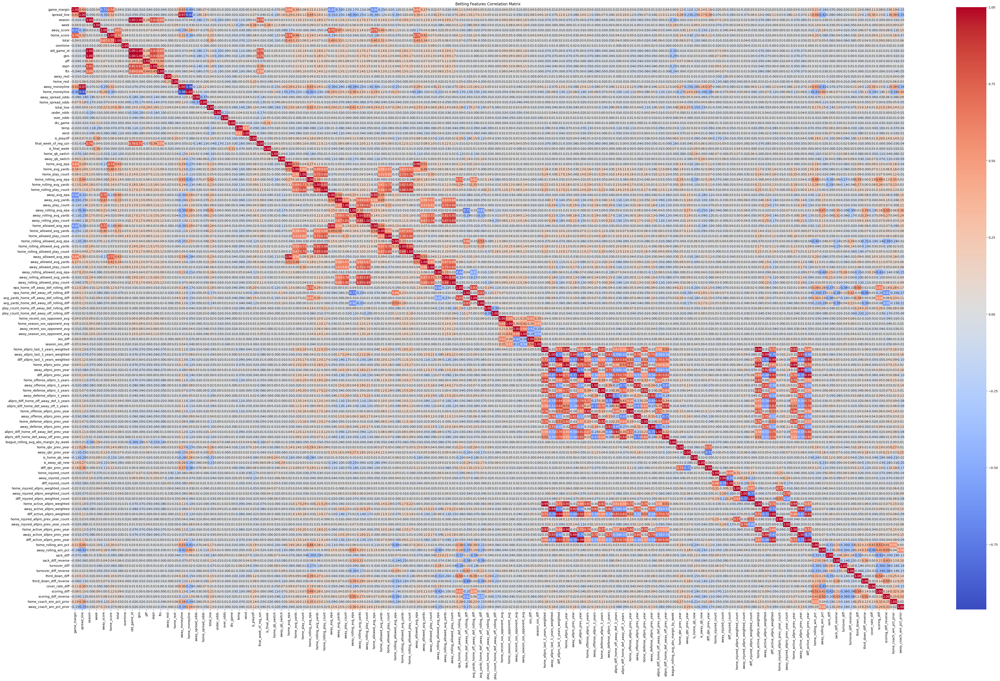

In [70]:
#correlation matrix -> core question: do any of the features in this dataset lead to high margin of victory for home team? or for away team? This is a pointless question as who wins the game would be due to many other factors.
#so would not take much away from this...nonetheless this is good to show for seeing what features might have collinearity.
#This also shows how regression may not be the best suited modeling technique for our project.

#although the recent team performance metrics are going to be correlated with winning or losing so that makes sense

corr_df = match_df.corr(numeric_only=True)
plt.figure(figsize=(60, 35))
sns.heatmap(corr_df, annot=True, fmt='.2f', cmap='coolwarm')
plt.title('Betting Features Correlation Matrix')
plt.show()

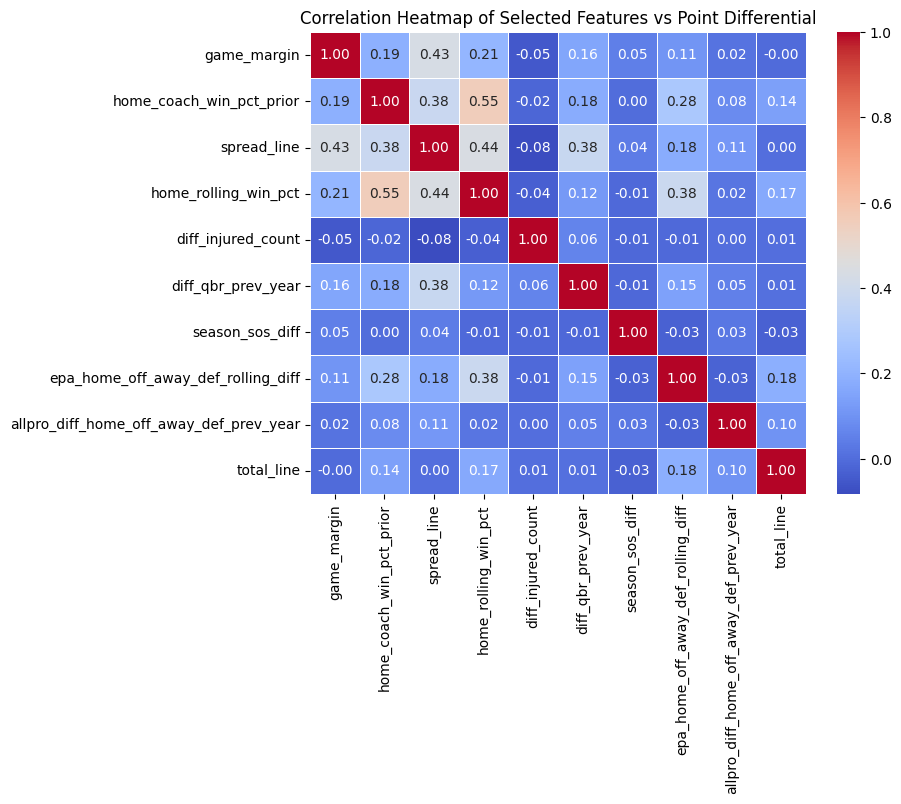

In [71]:
selected_features = ['game_margin', 'home_coach_win_pct_prior', 'spread_line', 'home_rolling_win_pct', 'diff_injured_count', 'diff_qbr_prev_year',
                    'season_sos_diff', 'epa_home_off_away_def_rolling_diff', 'allpro_diff_home_off_away_def_prev_year', 'total_line']

# Subset the DataFrame
subset_df = match_df[selected_features]

# Compute correlation matrix
correlation_matrix = subset_df.corr()

# Plot heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Heatmap of Selected Features vs Point Differential')
plt.show()


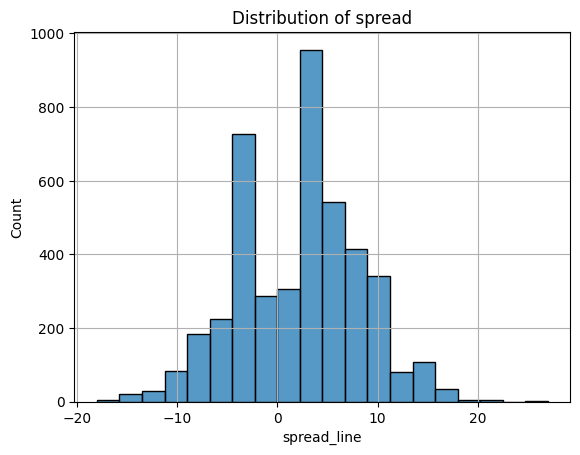

<Figure size 1500x1000 with 0 Axes>

In [72]:
#distribution of target variable. most spreads tend to be within 10 points of zero
sns.histplot(match_df['spread_line'], bins=20)
plt.grid(True)
plt.title('Distribution of spread')
plt.figure(figsize=(15, 10))
plt.show()

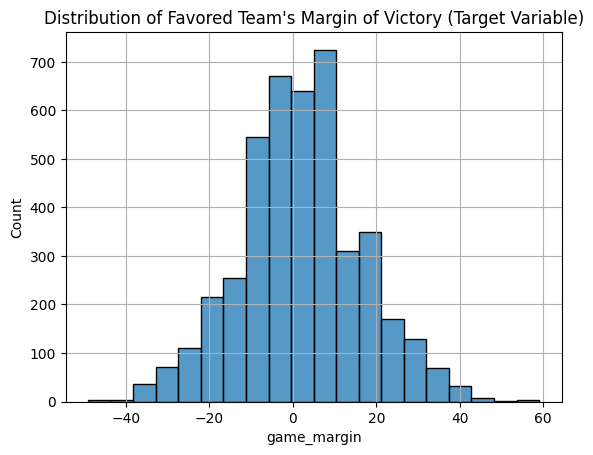

<Figure size 1500x1000 with 0 Axes>

In [73]:
#distribution of game_margin. most margins of victory are between 20 points of zero. As you can see margin of victory has a larger range compared to spread line
sns.histplot(match_df['game_margin'], bins=20)
plt.grid(True)
plt.title("Distribution of Favored Team's Margin of Victory (Target Variable)")
plt.figure(figsize=(15, 10))
plt.show()

In [74]:
# needs to match for features_df
match_df = match_df.rename(columns={'final_week_of_reg_szn': 'final_week'})
match_df.head()

,game_id,game_margin,spread_line,season,game_type,week,gameday,weekday,gametime,away_team,away_score,home_team,home_score,location,total,overtime,old_game_id,gsis,nfl_detail_id,pfr,pff,espn,ftn,away_rest,home_rest,away_moneyline,home_moneyline,away_spread_odds,home_spread_odds,total_line,under_odds,over_odds,div_game,roof,surface,temp,wind,away_qb_id,home_qb_id,away_qb_name,home_qb_name,away_coach,home_coach,referee,stadium_id,stadium,is_playoff,final_week,is_final_week,home_qb_switch,away_qb_switch,home_avg_epa,home_avg_yards,home_play_count,home_rolling_avg_epa,home_rolling_avg_yards,home_rolling_play_count,away_avg_epa,away_avg_yards,away_play_count,away_rolling_avg_epa,away_rolling_avg_yards,away_rolling_play_count,home_allowed_avg_epa,home_allowed_avg_yards,home_allowed_play_count,home_rolling_allowed_avg_epa,home_rolling_allowed_avg_yards,home_rolling_allowed_play_count,away_allowed_avg_epa,away_allowed_avg_yards,away_allowed_play_count,away_rolling_allowed_avg_epa,away_rolling_allowed_avg_yards,away_rolling_allowed_play_count,epa_home_off_away_def_rolling_diff,epa_home_def_away_off_rolling_diff,avg_yards_home_off_away_def_rolling_diff,avg_yards_home_def_away_off_rolling_diff,play_count_home_off_away_def_rolling_diff,play_count_home_def_away_off_rolling_diff,home_recent_sos_opponent_avg,home_season_sos_opponent_avg,away_recent_sos_opponent_avg,away_season_sos_opponent_avg,sos_diff,season_sos_diff,home_allpro_last_3_years_weighted,away_allpro_last_3_years_weighted,diff_allpro_last_3_years_weighted,home_allpro_prev_year,away_allpro_prev_year,diff_allpro_prev_year,home_offense_allpro_3_years,away_offense_allpro_3_years,home_defense_allpro_3_years,away_defense_allpro_3_years,allpro_diff_home_off_away_def_3_years,allpro_diff_home_def_away_off_3_years,home_offense_allpro_prev_year,away_offense_allpro_prev_year,home_defense_allpro_prev_year,away_defense_allpro_prev_year,allpro_diff_home_off_away_def_prev_year,allpro_diff_home_def_away_off_prev_year,league_rolling_avg_abs_margin_by_week,home_qbr_prev_year,away_qbr_prev_year,is_home_qb_new,is_away_qb_new,diff_qbr_prev_year,home_injured_count,away_injured_count,diff_injured_count,home_injured_allpro_weighted_count,away_injured_allpro_weighted_count,diff_injured_allpro_weighted_count,home_active_allpro_weighted,away_active_allpro_weighted,diff_active_allpro_weighted,home_injured_allpro_prev_year_count,away_injured_allpro_prev_year_count,home_active_allpro_prev_year,away_active_allpro_prev_year,diff_active_allpro_prev_year,home_rolling_win_pct,away_rolling_win_pct,sack_diff,sack_diff_reverse,turnover_diff,turnover_diff_reverse,third_down_diff,third_down_diff_reverse,cover_rate_diff,scoring_diff,scoring_diff_reverse,home_coach_win_pct_prior,away_coach_win_pct_prior
0,2009_01_TEN_PIT,3.0,6.5,2009,REG,1,2009-09-10,Thursday,20:30,TEN,10.0,PIT,13.0,Home,23.0,1.0,2009091000,54467.0,0,200909100pit,1395.0,290910023.0,0.0,7,7,228.0,-260.0,-116.0,107.0,35.5,-106.0,-104.0,0,outdoors,dessograss,67.0,9.0,00-0003292,00-0022924,Kerry Collins,Ben Roethlisberger,Jeff Fisher,Mike Tomlin,Bill Leavy,PIT00,Heinz Field,False,17,False,False,False,-0.126919,5.100000,70.0,0.0,0.0,0.0,-0.016805,5.245902,61.0,0.0,0.0,0.0,-0.016805,5.245902,61.0,0.0,0.0,0.0,-0.126919,5.100000,70.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,14.0,28.0,-14.0,3,6,-3,2.0,16.0,12.0,12.0,-10.0,-4.0,0.0,4.0,3.0,2.0,-2.0,-1.0,NaN,47.1,57.400000,0,0,-10.300000,0,0,0,0.0,0.0,0.0,14.0,28.0,-14.0,0,0,3,6,-3,NaN,NaN,NaN,NaN,NaN,NaN,0.062291,-0.041073,NaN,NaN,NaN,0.694,0.591
1,2009_01_MIA_ATL,12.0,4.0,2009,REG,1,2009-09-13,Sunday,13:00,MIA,7.0,ATL,19.0,Home,26.0,0.0,2009091300,54468.0,0,200909130atl,1396.0,290913001.0,0.0,7,7,190.0,-210.0,-104.0,-104.0,44.0,-103.0,-107.0,0,dome,fieldturf,0.0,0.0,00-0019559,00-0026143,Chad Pennington,Matt Ryan,Tony Sparano,Mike Smith,Walt Coleman,ATL00,Georgia Dome,False,17,False,False,False,-0.043537,4.596774,62.0,0.0,0.0,0.0,-0.354940,4.625000,56.0,0.0,0.0,0.0,-0.354940,4.625000,56.0,0.0,0.

##Modeling

###Setup

To finish setting up our dataset, we only want matches played after weeks 1 and 2 since some of our features use previous recent game data. In addition, I am dropping any feature that is not predictive since it will not be beneficial for our model. Lastly, I am dropping any row that has a nan value in it for simplicity.

In [75]:
#drop columns that we are not using as features in the initial dataset, only take data after week 3 because we don't have rolling data before then that is very accurate

'''features_df = match_df[match_df['week'] >= 3][['game_margin', 'away_rest', 'home_rest', 'total_line', 'div_game', 'roof', 'surface', 'temp', 'wind', 'home_qb_name', 'away_qb_name', 'away_coach', 'home_coach', 'referee', 'stadium_id', 'is_playoff', 'is_final_week',
                                               'home_qb_switch', 'away_qb_switch', 'home_rolling_avg_epa', 'home_rolling_avg_yards', 'home_rolling_play_count', 'away_rolling_avg_epa', 'away_rolling_avg_yards', 'away_rolling_play_count', 'home_rolling_allowed_avg_epa',
                                               'home_rolling_allowed_avg_yards', 'home_rolling_allowed_play_count', 'away_rolling_allowed_avg_epa', 'away_rolling_allowed_avg_yards', 'away_rolling_allowed_play_count', 'home_off_away_def_rolling_epa_diff',
                                               'home_def_away_off_rolling_epa_diff', 'home_off_away_def_rolling_avg_yards_diff', 'home_def_away_off_rolling_avg_yards_diff', 'home_off_away_def_rolling_play_count_diff', 'home_def_away_off_rolling_play_count_diff',
                                               'sos_diff','season_sos_diff', 'home_allpro_last_3_years_weighted', 'away_allpro_last_3_years_weighted', 'diff_allpro_last_3_years_weighted', 'home_allpro_prev_year', 'away_allpro_prev_year', 'diff_allpro_prev_year','diff_offense_allpro_3_years',
                                               'diff_defense_allpro_3_years', 'home_offense_vs_away_defense_3_years', 'home_defense_vs_away_offense_3_years', 'diff_offense_allpro_prev_year', 'diff_defense_allpro_prev_year', 'home_offense_vs_away_defense_prev_year',
                                               'home_defense_vs_away_offense_prev_year' ]]'''

print("Total data before dropping weeks 1-2 in seasons:")
print(match_df.shape)
print('\n\n')

# added this to keep conistent with week 3 start
match_df = match_df[match_df['week'] >= 3]

#print(features_df.shape)

#change to features_df
features_df = match_df.drop(['week', 'season', 'game_type', 'gameday', 'weekday', 'gametime', 'away_team', 'home_team', 'away_score', 'home_score', 'location', 'total', 'overtime', 'old_game_id', 'gsis', 'nfl_detail_id', 'pfr', 'pff', 'espn', 'ftn',
                             'away_moneyline', 'home_moneyline', 'away_spread_odds', 'home_spread_odds', 'under_odds', 'over_odds', 'stadium', 'final_week', 'away_qb_id', 'home_qb_id', 'home_avg_epa', 'home_avg_yards', 'home_play_count', 'away_avg_epa', 'away_avg_yards', 'away_play_count',
                             'home_allowed_avg_epa', 'home_allowed_avg_yards', 'home_allowed_play_count', 'away_allowed_avg_epa', 'away_allowed_avg_yards', 'away_allowed_play_count', 'home_qb_name', 'away_qb_name', 'away_coach', 'home_coach', 'referee', 'stadium_id', 'home_injured_allpro_prev_year_count',
                             'away_injured_allpro_prev_year_count',	'home_active_allpro_prev_year',	'away_active_allpro_prev_year','home_injured_allpro_weighted_count',	'away_injured_allpro_weighted_count',	'diff_injured_allpro_weighted_count',	'home_active_allpro_weighted',	'away_active_allpro_weighted'
                             ], axis=1)

print('total data after dropping weeks 1-2 in seasons and before dropping nan values:')
print(features_df.shape)
print('\n\n')

#drop nan values for any feature
features_df = features_df.dropna()

print('Total data after droppping nan values')
print(features_df.shape)



features_df

Total data before dropping weeks 1-2 in seasons:
(4345, 138)



total data after dropping weeks 1-2 in seasons and before dropping nan values:
(3834, 81)



Total data after droppping nan values
(3184, 81)


,game_id,game_margin,spread_line,away_rest,home_rest,total_line,div_game,roof,surface,temp,wind,is_playoff,is_final_week,home_qb_switch,away_qb_switch,home_rolling_avg_epa,home_rolling_avg_yards,home_rolling_play_count,away_rolling_avg_epa,away_rolling_avg_yards,away_rolling_play_count,home_rolling_allowed_avg_epa,home_rolling_allowed_avg_yards,home_rolling_allowed_play_count,away_rolling_allowed_avg_epa,away_rolling_allowed_avg_yards,away_rolling_allowed_play_count,epa_home_off_away_def_rolling_diff,epa_home_def_away_off_rolling_diff,avg_yards_home_off_away_def_rolling_diff,avg_yards_home_def_away_off_rolling_diff,play_count_home_off_away_def_rolling_diff,play_count_home_def_away_off_rolling_diff,home_recent_sos_opponent_avg,home_season_sos_opponent_avg,away_recent_sos_opponent_avg,away_season_sos_opponent_avg,sos_diff,season_sos_diff,home_allpro_last_3_years_weighted,away_allpro_last_3_years_weighted,diff_allpro_last_3_years_weighted,home_allpro_prev_year,away_allpro_prev_year,diff_allpro_prev_year,home_offense_allpro_3_years,away_offense_allpro_3_years,home_defense_allpro_3_years,away_defense_allpro_3_years,allpro_diff_home_off_away_def_3_years,allpro_diff_home_def_away_off_3_years,home_offense_allpro_prev_year,away_offense_allpro_prev_year,home_defense_allpro_prev_year,away_defense_allpro_prev_year,allpro_diff_home_off_away_def_prev_year,allpro_diff_home_def_away_off_prev_year,league_rolling_avg_abs_margin_by_week,home_qbr_prev_year,away_qbr_prev_year,is_home_qb_new,is_away_qb_new,diff_qbr_prev_year,home_injured_count,away_injured_count,diff_injured_count,diff_active_allpro_weighted,diff_active_allpro_prev_year,home_rolling_win_pct,away_rolling_win_pct,sack_diff,sack_diff_reverse,turnover_diff,turnover_diff_reverse,third_down_diff,third_down_diff_reverse,cover_rate_diff,scoring_diff,scoring_diff_reverse,home_coach_win_pct_prior,away_coach_win_pct_prior
32,2009_03_CLE_BAL,31.0,13.5,7,7,38.5,1,outdoors,sportturf,72.0,6.0,False,False,False,False,0.139008,5.538726,72.5,-0.281558,4.060606,57.5,-0.050452,5.673677,55.5,0.169139,5.597106,67.5,-0.030132,0.231107,-0.058380,1.613071,5.0,-2.0,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,24.0,6.0,18.0,5,1,4,6.0,6.0,18.0,0.0,6.0,12.0,1.0,1.0,4.0,0.0,1.0,3.0,10.000000,47.100000,58.205556,0,1,-11.105556,0,0,0,18.0,4,1.000000,0.000000,-1.000000,-2.000000,1.000000,1.500000,0.017241,-0.115385,1.000000,4.000000,-12.000000,0.714,0.451
33,2009_03_WAS_DET,5.0,-6.5,7,7,39.5,0,dome,fieldturf,0.0,0.0,False,False,False,False,-0.230076,4.042664,61.5,-0.054802,5.451343,58.5,0.106783,6.260186,61.0,-0.059422,5.450000,54.5,-0.170655,0.161585,-1.407336,0.808843,7.0,2.5,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,0.0,6.0,-6.0,0,1,-1,0.0,4.0,0.0,2.0,-2.0,-4.0,0.0,1.0,0.0,0.0,0.0,-1.0,10.000000,58.205556,58.500000,1,0,-0.294444,0,0,0,-6.0,-1,0.000000,0.500000,0.500000,-0.500000,1.500000,0.000000,-0.245370,-0.060201,0.000000,5.000000,-23.000000,0.000,0.500
34,2009_03_JAX_HOU,-7.0,4.0,7,7,47.0,1,closed,grass,0.0,0.0,False,False,False,False,-0.084081,5.103220,57.0,-0.092676,4.811834,61.5,0.116157,7.037441,65.5,0.144393,6.209088,61.5,-0.228473,0.208832,-1.105869,2.225607,-4.5,4.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,10.0,4.0,6.0,2,0,2,4.0,2.0,6.0,2.0,2.0,4.0,1.0,0.0,1.0,0.0,1.0,1.0,10.000000,67.300000,58.700000,0,0,8.600000,1,2,-1,6.0,2,0.500000,0.000000,0.500000,-2.000000,-0.500000,0.000000,-0.156190,-0.148618,0.000000,-2.000000,-13.000000,0.460,0.505
35,2009_03_SF_MIN,3.0,7.0,7,7,39.0,0,dome,fieldturf,0.0,0.0,False,False,False,False,0.089624,5.036366,57.5,-0.015240,4.850000,60.0,-0.217014,4.240909,63.0,-0.188510,4.627743,63.0,0.278134,-0.201774,0.408624,-0.609091,-5.5,3.0,0.000000,0.000000,1.000000,1.000000,-1.000000,-1.000000,28.0,0.0,28.0,5,0,5,12.0,0.0,16.0,0.0,12.0,16.0,2.0,0.0,3.0,0.0,2.0,3.0,10.000000,43.400000,62.100000,0,0,-18.700000,1,0,1,28.0,5,1.000000,1.000000,1.500000,-0.500000,-1.000000,-2.000000,0.089286,0.043636,0.000000,17.500000,5.000000,0.510,0.636
37,2009

In [76]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, r2_score
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, RandomizedSearchCV
from sklearn.metrics import classification_report, make_scorer, mean_absolute_error
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer

###Random Forest Regressor

####Initial Model - 1st Iteration

We decided to use a random forest regressor because it handles nonlinear data well, works well with a broad range of features, is good with overfitting, and allows for feature importance.

The goal of this initial RF Regressor Model is to reduce the features that we are using in future models and further in our project. Right now we are using too many features and need to hone down on more influential features that impact game margin.

In the initial run through, the goal is not to have an incredibly well performing model.

Sources

https://www.geeksforgeeks.org/machine-learning/categorical-data-encoding-techniques-in-machine-learning/

https://scikit-learn.org/stable/modules/generated/sklearn.compose.ColumnTransformer.html

https://scikit-learn.org/stable/modules/generated/sklearn.metrics.mean_absolute_error.html

In [77]:
def random_forest_regressor_v1(features_df, model_depth=None, threshold=.5):

    #features
    game_ids = features_df['game_id'].reset_index(drop=True)
    spread = features_df['spread_line'].reset_index(drop=True)
    X = features_df.drop(columns=['game_margin', 'game_id', 'spread_line'])
    #target variable
    y = features_df['game_margin'].reset_index(drop=True)

    #random forest model only works with numbers so we need to encode categorical features into a number of some sort
    #Using One Hot Encoding because while none of the categorical variables have an order to them we don't want the model to pick up any 'fake ordering'

    #converts each category to binary value
    cat_features = X.select_dtypes(include=['object', 'category']).columns.tolist()
    quan_features = [col for col in X.columns if col not in cat_features]

    #checks categorical columns are all strings
    X[cat_features] = X[cat_features].astype(str)

    print("Number of Features:")
    print(len(quan_features) + len(cat_features))
    print('\n\n')
    print("Name of Features - Categorical and Quantative Respectively:")
    print(cat_features)
    print('\n\n')
    print(quan_features)
    print('\n\n')

    #encode categorical features
    cat_feature_encoding = ColumnTransformer([("cat_features", OneHotEncoder(handle_unknown='ignore', sparse_output=False), cat_features)], remainder='passthrough')

    X_encoded = cat_feature_encoding.fit_transform(X)
    new_cat_feat_names = cat_feature_encoding.named_transformers_['cat_features'].get_feature_names_out(cat_features)
    updated_feats = list(new_cat_feat_names) + list(quan_features)
    X_updated = pd.DataFrame(X_encoded, columns=updated_feats)
    X_updated = X_updated.astype(float)

    print("Features After Encoding:")
    print(X_updated.columns)
    print('\n\n')

    X_train, X_test, y_train, y_test, game_ids_train, game_ids_test, spread_train, spread_test = train_test_split(X_updated, y, game_ids, spread, test_size=0.2, random_state=3)
    #X_train, X_test, y_train, y_test = train_test_split(X_updated, y, test_size=0.2, random_state=3)

    rf_reg = RandomForestRegressor(n_estimators=100, random_state=3, max_depth=model_depth)
    rf_reg.fit(X_train, y_train)

    train_pred = rf_reg.predict(X_train)
    test_pred = rf_reg.predict(X_test)
    test_pred_rounded = np.round(test_pred * 2) / 2

    #spread = X_test['spread_line']

    #evaluate model
    eval_df = pd.DataFrame({
        'game_id': game_ids_test,
        'game_margin': y_test,
        'model_prediction': test_pred_rounded,
        'spread': spread_test
    })

    #remove pushes
    eval_df = eval_df[eval_df['game_margin'] != eval_df['spread']].copy()
    eval_df = eval_df[eval_df['model_prediction'] != eval_df['spread']].copy()

    #diff
    eval_df['model_vs_spread_diff'] = np.abs(eval_df['model_prediction'] - eval_df['spread'])
    true_bets_df = eval_df[eval_df['model_vs_spread_diff'] >= 1].copy()

    eval_df['model_error'] = np.abs(eval_df['game_margin'] - eval_df['model_prediction'])
    eval_df['spread_error'] = np.abs(eval_df['game_margin'] - eval_df['spread'])

    eval_df['model_vs_spread'] = eval_df['model_error'] < eval_df['spread_error']

    winning_percentage = eval_df['model_vs_spread'].mean()

    print(f"Model beat spread in {winning_percentage*100:.2f}% of the time")
    print('\n\n')

    plt.hist(eval_df['model_error'], bins=20, alpha=0.6, label='Model')
    plt.legend()
    plt.title('Model Absolute Error')
    plt.xlabel('Absolute Error')
    plt.ylabel('Frequency')
    plt.show()
    print('\n\n')

    plt.hist(eval_df['spread_error'], bins=20, alpha=0.6, label='Spread')
    plt.legend()
    plt.title('Spread Absolute Error')
    plt.xlabel('Absolute Error')
    plt.ylabel('Frequency')
    plt.show()
    print('\n\n')

    #true betting edge percentage
    print("Substantial Differences: ")
    print(len(true_bets_df))
    print('\n\n')
    true_bets_df['model_error'] = np.abs(true_bets_df['game_margin'] - true_bets_df['model_prediction'])
    true_bets_df['spread_error'] = np.abs(true_bets_df['game_margin'] - true_bets_df['spread'])

    true_bets_df['model_vs_spread'] = true_bets_df['model_error'] < true_bets_df['spread_error']

    winning_percentage = true_bets_df['model_vs_spread'].mean()

    print(f"Most Important Value - True Bets - Model beat spread in {winning_percentage*100:.2f}% of the time")
    print('\n\n')

    plt.hist(true_bets_df['model_error'], bins=30, alpha=0.6, label='Model')
    plt.legend()
    plt.title('True Bets - Model Absolute Error')
    plt.xlabel('Absolute Error')
    plt.ylabel('Frequency')
    plt.show()
    print('\n\n')

    plt.hist(true_bets_df['spread_error'], bins=30, alpha=0.6, label='Spread')
    plt.legend()
    plt.title('True Bets - Spread Absolute Error')
    plt.xlabel('Absolute Error')
    plt.ylabel('Frequency')
    plt.show()

    print('\n\n')
    print("TRAIN MAE:")
    print(mean_absolute_error(y_train, train_pred))
    print('\n\n')

    print("TRAIN R²:")
    print(r2_score(y_train, train_pred))
    print('\n\n')

    print("TEST MAE:")
    print(mean_absolute_error(y_test, test_pred))
    print('\n\n')

    print("TEST R²:")
    print(r2_score(y_test, test_pred))
    print('\n\n')

    #Calculating the feature importance
    feature_importance = rf_reg.feature_importances_
    feature_importance = 100.0*(feature_importance/np.sum(feature_importance))

    #Get top 20 feature since there are so many
    top_x = 20
    top_idx = np.argsort(feature_importance)[-top_x:]
    top_idx = top_idx[np.argsort(feature_importance[top_idx])[::-1]]

    updated_feats_arr = np.array(updated_feats)
    top_features = updated_feats_arr[top_idx]

    print(top_features)
    print('\n\n')
    top_importance = feature_importance[top_idx]
    print(top_importance)
    print('\n\n')

    #plotting the top 20 features for my random forest regressor
    plt.figure(figsize=(10, 10))
    plt.barh(np.arange(top_x), top_importance[::-1], color='crimson', align='center')
    plt.yticks(np.arange(top_x), top_features[::-1])
    plt.xlabel('Relative Importance (%)')
    plt.title('RF Reg - Feature Importance - Top 20 Features')
    plt.tight_layout()
    plt.show()

    #drop low importance features and return updated df
    low_idx = np.where(feature_importance < threshold)[0]
    low_feat_names = np.array(updated_feats)[low_idx].tolist()

    print('\n\n')
    print(f"{len(low_feat_names)} features with importance < {threshold}%")
    print('\n\n')

    #drop low importance features from encoded X
    X_filtered = X_updated.drop(columns=low_feat_names)

    print("len of features above threshold:")
    print(len(X_filtered.columns))
    print('\n\n')

    # Combine with y and return
    updated_df = pd.concat([X_filtered, y.reset_index(drop=True), game_ids.reset_index(drop=True), spread.reset_index(drop=True)], axis=1)
    return rf_reg, updated_df, low_feat_names, true_bets_df


Number of Features:
78



Name of Features - Categorical and Quantative Respectively:
['roof', 'surface']



['away_rest', 'home_rest', 'total_line', 'div_game', 'temp', 'wind', 'is_playoff', 'is_final_week', 'home_qb_switch', 'away_qb_switch', 'home_rolling_avg_epa', 'home_rolling_avg_yards', 'home_rolling_play_count', 'away_rolling_avg_epa', 'away_rolling_avg_yards', 'away_rolling_play_count', 'home_rolling_allowed_avg_epa', 'home_rolling_allowed_avg_yards', 'home_rolling_allowed_play_count', 'away_rolling_allowed_avg_epa', 'away_rolling_allowed_avg_yards', 'away_rolling_allowed_play_count', 'epa_home_off_away_def_rolling_diff', 'epa_home_def_away_off_rolling_diff', 'avg_yards_home_off_away_def_rolling_diff', 'avg_yards_home_def_away_off_rolling_diff', 'play_count_home_off_away_def_rolling_diff', 'play_count_home_def_away_off_rolling_diff', 'home_recent_sos_opponent_avg', 'home_season_sos_opponent_avg', 'away_recent_sos_opponent_avg', 'away_season_sos_opponent_avg', 'sos_diff', 'seas

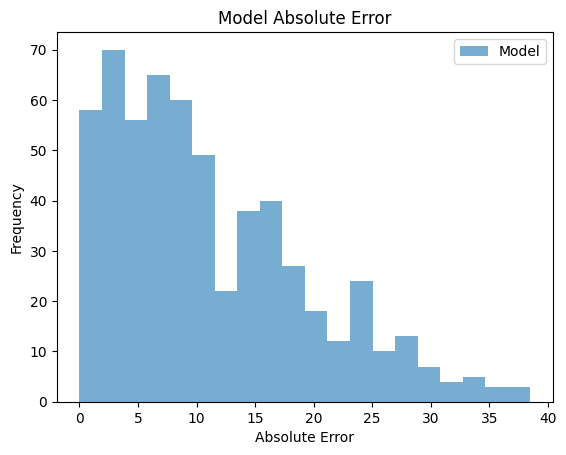

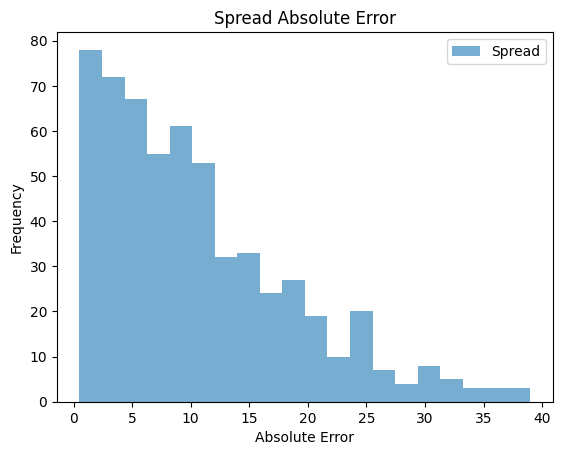




Substantial Differences: 
519



Most Important Value - True Bets - Model beat spread in 42.97% of the time





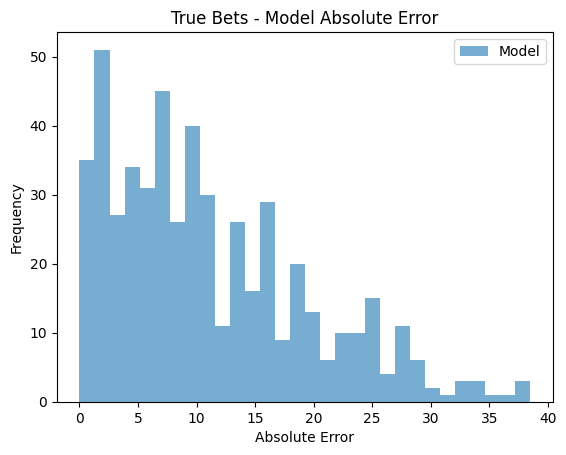

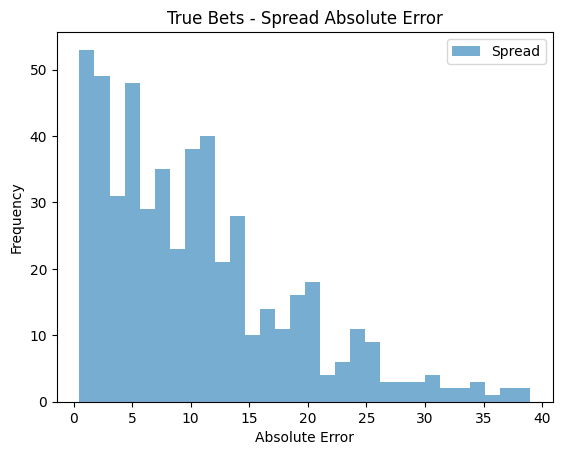




TRAIN MAE:
3.983674911660777



TRAIN R²:
0.8773524574022589



TEST MAE:
10.706530612244897



TEST R²:
0.0920029105772775



['home_rolling_win_pct' 'away_rolling_avg_epa' 'away_coach_win_pct_prior'
 'home_coach_win_pct_prior' 'home_rolling_avg_epa' 'away_rolling_win_pct'
 'away_qbr_prev_year' 'third_down_diff' 'away_rolling_avg_yards'
 'away_rolling_allowed_avg_epa' 'home_rolling_play_count'
 'scoring_diff_reverse' 'home_recent_sos_opponent_avg'
 'third_down_diff_reverse' 'away_recent_sos_opponent_avg'
 'home_rolling_avg_yards' 'diff_qbr_prev_year' 'turnover_diff'
 'home_rolling_allowed_play_count' 'sack_diff_reverse']



[5.88909822 3.56892017 3.4765014  3.07694179 2.91287065 2.42910371
 2.2087037  2.1850096  2.13560219 2.03244259 2.02001026 2.00954082
 1.95275119 1.92730782 1.92528021 1.89267261 1.83184746 1.81269406
 1.78860436 1.78150214]





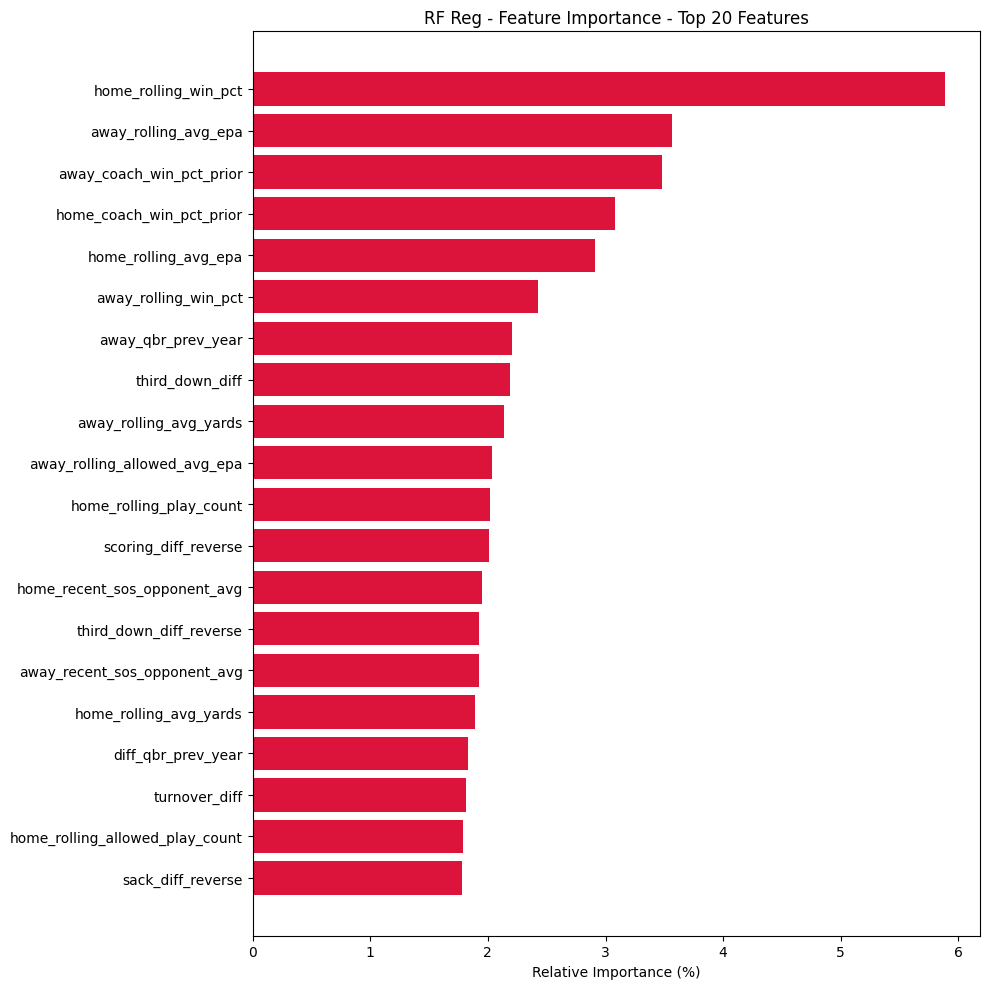




32 features with importance < 0.5%



len of features above threshold:
58





In [78]:
init_model, _, _, eval_df = random_forest_regressor_v1(features_df)

In [79]:
#for matches where my model predicts a spread at least a difference of one point more or less than the spread line
eval_df.head(10)

,game_id,game_margin,model_prediction,spread,model_vs_spread_diff,model_error,spread_error,model_vs_spread
2613,2021_15_HOU_JAX,-14.0,4.0,6.0,2.0,18.0,20.0,True
2590,2021_13_WAS_LV,-2.0,3.0,1.0,2.0,5.0,3.0,False
2722,2022_05_HOU_JAX,-7.0,4.0,7.0,3.0,11.0,14.0,True
347,2010_16_NYJ_CHI,4.0,3.5,1.5,2.0,0.5,2.5,True
2784,2022_09_BUF_NYJ,3.0,-2.0,-11.0,9.0,5.0,14.0,True
2186,2019_17_TEN_HOU,-21.0,3.0,-10.0,13.0,24.0,11.0,False
877,2013_12_JAX_HOU,-7.0,2.5,10.5,8.0,9.5,17.5,True
544,2011_16_PHI_DAL,-13.0,3.0,-1.5,4.5,16.0,11.5,False
1169,2015_04_MIN_DEN,3.0,3.5,7.0,3.5,0.5,4.0,True
719,2012_15_WAS_CLE,-17.0,-2.0,4.0,6.0,15.0,21.0,True


As you can see we are overfitting heavily. This is due to not having any hyperparams to stop depth and feature redundance.

Even still the MAE for our model is 10.99 which means, on average, our model predicted a game margin off by approximately 10.99 points from the real value.

Typically, NFL game margins are single digit. This means we are performing worse than just predicting the mean margin. NFL games are noisy. Game margins can vary heavily by just one play.

An R-squared score of 7.86% means our model explains 7.86% of the variance in game margin. This is low, but not unexpected as the NFL and sports in general are very noisy.

We currently beat the spread 46% of the time and on bets where there is a differential of 1 or more between the model and the spread line we win 43.77% of the time.

The most important features for our model our shown above. EPA seems to be the most important feature(s) by far.

I tried the model with the spread line but it seemed to perform worse. It is a debate on if we should add that or not.

Model minimized error based on the features given. Shows which features are important overall.

Based off our model and feature importance report:

Drop the bottom features (those with near-zero importance). Hopefully this will lessen overfitting and increase generalization.

After encoding we had 75 features. Only 47 of those had a feature importance above .5%.

Multicollinearity is ok, but can still reduce redundancy in feature set.

Focus and refine on top 5 to 10 features. Fully flesh out those features in whatevery ways necessary.

Looking at feature importance from other models can give us a good understanding of commonality in features among them.

####2nd Interation

For instance, one thing adjusted after an initial look at the model is combining rolling epa, rolling avg yards, and rolling play count of away and home teams into a two differential feature for each category. One differential is home offense vs away defense. The other is away offense vs home defense.

We also combined some other away vs home team features into diff features to reduce feature count.

This should clear up clutter and reduce high correlation between features.

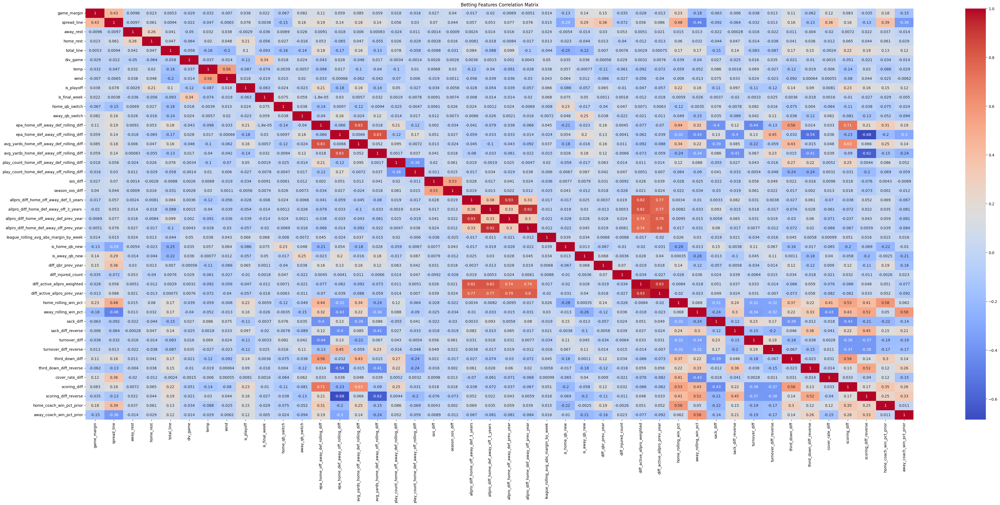

In [80]:
#after RF regressor, updating features to combine epa, avg yards, and play count (home off vs away def and home def vs away off)

#removing redundant features - keeping diffs
reduced_features_df = features_df.drop(['home_rolling_avg_epa', 'home_rolling_avg_yards', 'home_rolling_play_count',
                                        'away_rolling_avg_epa', 'away_rolling_avg_yards', 'away_rolling_play_count',
                                        'home_rolling_allowed_avg_epa', 'home_rolling_allowed_avg_yards', 'home_rolling_allowed_play_count',
                                        'away_rolling_allowed_avg_epa', 'away_rolling_allowed_avg_yards', 'away_rolling_allowed_play_count',
                                        'home_recent_sos_opponent_avg', 'home_season_sos_opponent_avg', 'away_recent_sos_opponent_avg', 'away_season_sos_opponent_avg',
                                        'home_allpro_last_3_years_weighted', 'away_allpro_last_3_years_weighted', 'diff_allpro_last_3_years_weighted', 'home_allpro_prev_year', 'away_allpro_prev_year', 'diff_allpro_prev_year',
                                        'home_offense_allpro_3_years', 'away_offense_allpro_3_years', 'home_defense_allpro_3_years', 'away_defense_allpro_3_years',
                                        'home_offense_allpro_prev_year', 'away_offense_allpro_prev_year', 'home_defense_allpro_prev_year', 'away_defense_allpro_prev_year',
                                        'home_qbr_prev_year', 'away_qbr_prev_year', 'home_injured_count', 'away_injured_count'], axis=1)

#will need to remove features that are highly correlated
corr_df = reduced_features_df.corr(numeric_only=True)
plt.figure(figsize=(50, 20))
sns.heatmap(corr_df, annot=True, cmap='coolwarm')
plt.title('Betting Features Correlation Matrix')
plt.show()

**Multicollinearity hurts linear models, not trees.**

these are some of our main qualitative features in a heatmap for context after reducing feature set

We went from 61 features to 31 features. Of course with encoding we are still at 1110.



Number of Features:
44



Name of Features - Categorical and Quantative Respectively:
['roof', 'surface']



['away_rest', 'home_rest', 'total_line', 'div_game', 'temp', 'wind', 'is_playoff', 'is_final_week', 'home_qb_switch', 'away_qb_switch', 'epa_home_off_away_def_rolling_diff', 'epa_home_def_away_off_rolling_diff', 'avg_yards_home_off_away_def_rolling_diff', 'avg_yards_home_def_away_off_rolling_diff', 'play_count_home_off_away_def_rolling_diff', 'play_count_home_def_away_off_rolling_diff', 'sos_diff', 'season_sos_diff', 'allpro_diff_home_off_away_def_3_years', 'allpro_diff_home_def_away_off_3_years ', 'allpro_diff_home_off_away_def_prev_year', 'allpro_diff_home_def_away_off_prev_year', 'league_rolling_avg_abs_margin_by_week', 'is_home_qb_new', 'is_away_qb_new', 'diff_qbr_prev_year', 'diff_injured_count', 'diff_active_allpro_weighted', 'diff_active_allpro_prev_year', 'home_rolling_win_pct', 'away_rolling_win_pct', 'sack_diff', 'sack_diff_reverse', 'turnover_diff', 'turnover_diff_rev

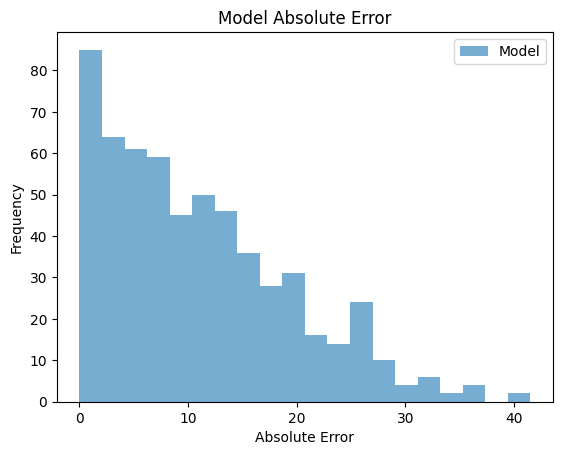

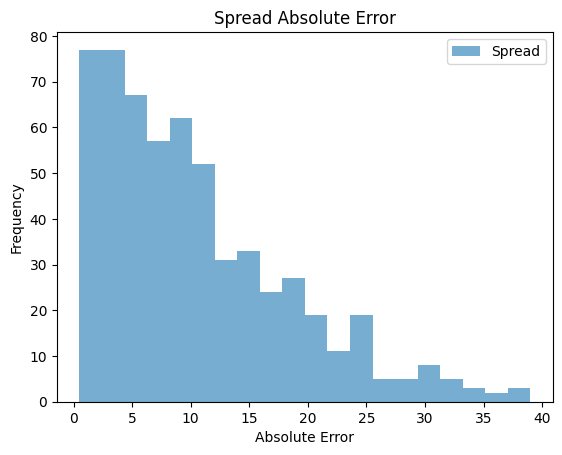




Substantial Differences: 
518



Most Important Value - True Bets - Model beat spread in 41.89% of the time





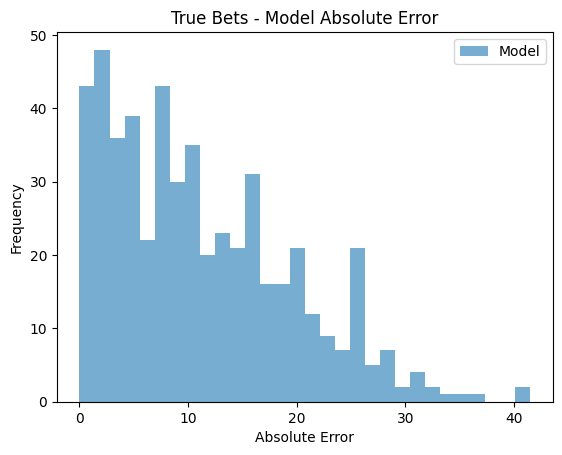

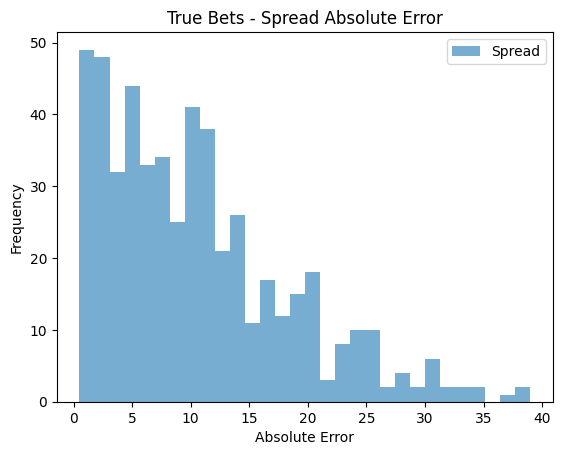




TRAIN MAE:
6.695417616708237



TRAIN R²:
0.6758295953796498



TEST MAE:
10.797780567016813



TEST R²:
0.07535513805477045



['home_rolling_win_pct' 'away_coach_win_pct_prior'
 'home_coach_win_pct_prior' 'away_rolling_win_pct' 'diff_qbr_prev_year'
 'scoring_diff_reverse' 'third_down_diff' 'season_sos_diff'
 'epa_home_off_away_def_rolling_diff' 'third_down_diff_reverse'
 'sack_diff' 'sos_diff' 'league_rolling_avg_abs_margin_by_week'
 'sack_diff_reverse' 'epa_home_def_away_off_rolling_diff'
 'play_count_home_off_away_def_rolling_diff' 'turnover_diff'
 'avg_yards_home_def_away_off_rolling_diff' 'turnover_diff_reverse'
 'avg_yards_home_off_away_def_rolling_diff']



[9.40190842 5.969133   4.77105066 4.523674   3.90139697 3.52365714
 3.50573112 3.32681089 3.24328813 3.17483672 3.03689165 2.98710468
 2.94832379 2.79581378 2.73262194 2.61086292 2.6007131  2.54457996
 2.54413622 2.43173235]





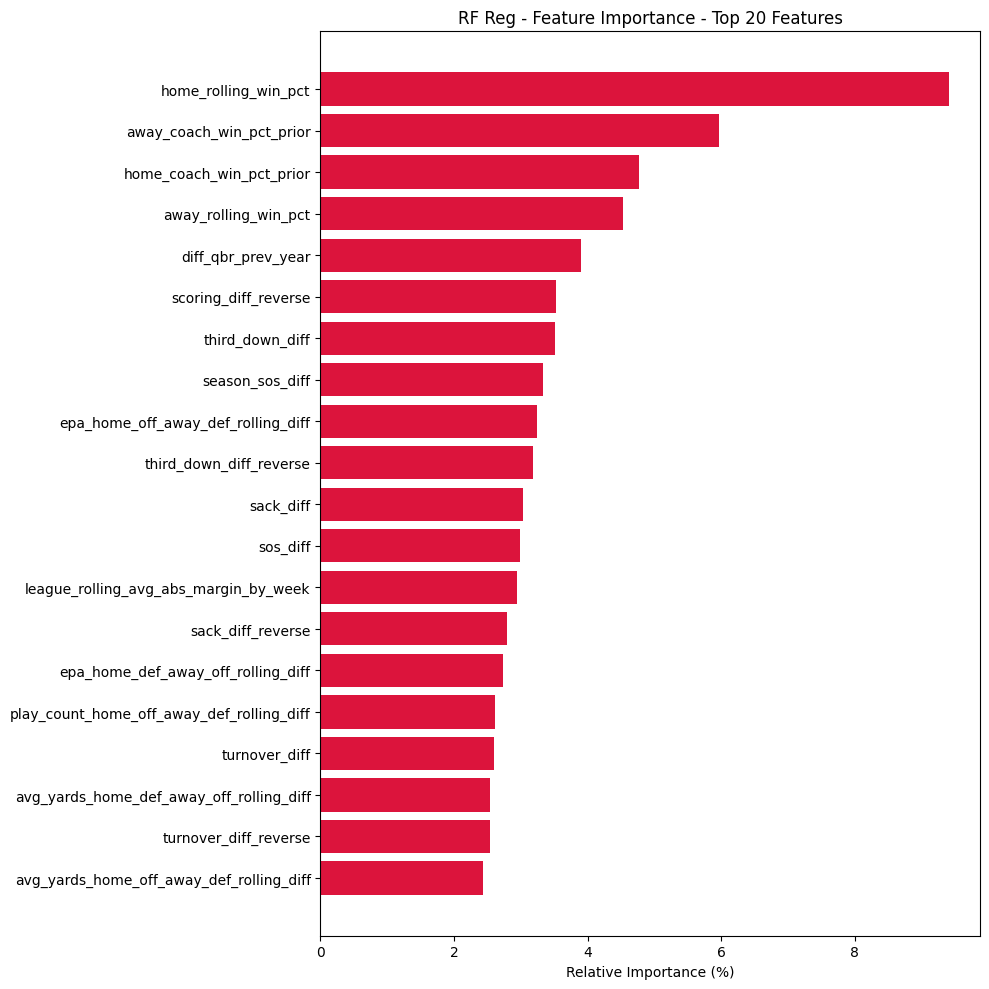




25 features with importance < 1%



len of features above threshold:
31





In [81]:
#all pro prev year mae = 10.63. r2 = .0903, all pro last 3 years weighted mae = 10.66, r2 = .0803 -> keep all pro prev year
#no_corr_features = reduced_features_df.drop(['diff_home_def_away_off_prev_year', 'diff_home_off_away_def_prev_year'], axis=1)

rf_reg, updated_df, dropped_features, true_bets_df = random_forest_regressor_v1(reduced_features_df, model_depth=10, threshold=1)

In [82]:
true_bets_df.head()

,game_id,game_margin,model_prediction,spread,model_vs_spread_diff,model_error,spread_error,model_vs_spread
2613,2021_15_HOU_JAX,-14.0,1.5,6.0,4.5,15.5,20.0,True
2722,2022_05_HOU_JAX,-7.0,3.0,7.0,4.0,10.0,14.0,True
347,2010_16_NYJ_CHI,4.0,0.0,1.5,1.5,4.0,2.5,False
2784,2022_09_BUF_NYJ,3.0,-6.0,-11.0,5.0,9.0,14.0,True
2186,2019_17_TEN_HOU,-21.0,5.0,-10.0,15.0,26.0,11.0,False


Now we have 41 features after encoding.

We added depth to our model making our test evaluation much closer to our train evaluation. This is a good sign in reduction of overfitting. It is still performing lower than I had hoped though.

The MAE for our model is 11.27 which means, on average, our model predicted a game margin off by approximately 11.27 points from the real value.

Better than our previous model.

An R-squared score of 4.53% means our model explains 4.53% of the variance in game margin. This is a slight decrease from the previous model.

Our winning percentage drops slightly too.

Hard to take much away as collinearity can actually help random forest models by removing noise.

By looking at our feature importance, it looks a lot more diverse after combining some of the highly correlated features. This is good for a more genearlized model moving further into our project.

22 features had a feature importance above 1%.

Next, we can improve the feature set even further if we remove the bottom features.

####3rd iteration

source - https://scikit-learn.org/stable/modules/grid_search.html

Using grid search to help find good hyperparams - takes a long time so i did one hyperparam at a time.

In [83]:
def random_forest_regressor_v2(features_df):

    #features
    game_ids = features_df['game_id'].reset_index(drop=True)
    spread = features_df['spread_line'].reset_index(drop=True)
    X = features_df.drop(columns=['game_margin', 'game_id', 'spread_line'])
    X_updated = X.astype(float)
    #target variable
    y = features_df['game_margin'].reset_index(drop=True)

    print("Number of features:")
    print(len(X_updated.columns))
    print('\n\n')
    print("Name of features:")
    print(X_updated.columns)
    print('\n\n')

    X_train, X_test, y_train, y_test, game_ids_train, game_ids_test, spread_train, spread_test = train_test_split(X_updated, y, game_ids, spread, test_size=0.2, random_state=3)
    #X_train, X_test, y_train, y_test = train_test_split(X_updated, y, test_size=0.2, random_state=3)
    rf_reg = RandomForestRegressor(random_state=3)

    #grid search
    grid = {
        'n_estimators': [500],
        'max_depth': [10],
        'min_samples_split': [175], #175
        'min_samples_leaf': [40], #40
        'max_features': [None],
        'criterion': ['absolute_error']
    }

    gs = GridSearchCV(estimator=rf_reg, param_grid=grid, cv=3, scoring='neg_mean_absolute_error', n_jobs=-1, verbose=2)
    gs.fit(X_train, y_train)

    grid_model = gs.best_estimator_
    print("\nBest hyperparameters:")
    print(gs.best_params_)

    print(f"\n\nBest CV MAE: {-gs.best_score_:.4f}")
    print('\n\n')

    #rf_reg = RandomForestRegressor(n_estimators=100, random_state=3, max_depth=model_depth)
    #rf_reg.fit(X_train, y_train)

    test_pred = grid_model.predict(X_test)
    train_pred = grid_model.predict(X_train)
    test_pred_rounded = np.round(test_pred * 2) / 2

    #spread = X_test['spread_line']

    #evaluate model
    eval_df = pd.DataFrame({
        'game_id': game_ids_test,
        'game_margin': y_test,
        'model_prediction': test_pred_rounded,
        'spread': spread_test
    })


    #remove pushes
    eval_df = eval_df[eval_df['game_margin'] != eval_df['spread']].copy()
    eval_df = eval_df[eval_df['model_prediction'] != eval_df['spread']].copy()

    #diff
    eval_df['model_vs_spread_diff'] = np.abs(eval_df['model_prediction'] - eval_df['spread'])
    true_bets_df = eval_df[eval_df['model_vs_spread_diff'] >= 1].copy()

    eval_df['model_error'] = np.abs(eval_df['game_margin'] - eval_df['model_prediction'])
    eval_df['spread_error'] = np.abs(eval_df['game_margin'] - eval_df['spread'])

    eval_df['model_vs_spread'] = eval_df['model_error'] < eval_df['spread_error']

    winning_percentage = eval_df['model_vs_spread'].mean()

    print(f"Model beat spread in {winning_percentage*100:.2f}% of the time")
    print('\n\n')

    plt.hist(eval_df['model_error'], bins=20, alpha=0.6, label='Model')
    plt.legend()
    plt.title('Model Absolute Error')
    plt.xlabel('Absolute Error')
    plt.ylabel('Frequency')
    plt.show()
    print('\n\n')

    plt.hist(eval_df['spread_error'], bins=20, alpha=0.6, label='Spread')
    plt.legend()
    plt.title('Spread Absolute Error')
    plt.xlabel('Absolute Error')
    plt.ylabel('Frequency')
    plt.show()
    print('\n\n')

    #true betting edge percentage
    print("Substantial Differences: ")
    print(len(true_bets_df))
    print('\n\n')
    true_bets_df['model_error'] = np.abs(true_bets_df['game_margin'] - true_bets_df['model_prediction'])
    true_bets_df['spread_error'] = np.abs(true_bets_df['game_margin'] - true_bets_df['spread'])

    true_bets_df['model_vs_spread'] = true_bets_df['model_error'] < true_bets_df['spread_error']

    winning_percentage = true_bets_df['model_vs_spread'].mean()

    print(f"Most Important Value - True Bets - Model beat spread in {winning_percentage*100:.2f}% of the time")
    print('\n\n')

    plt.hist(true_bets_df['model_error'], bins=30, alpha=0.6, label='Model')
    plt.legend()
    plt.title('True Bets - Model Absolute Error')
    plt.xlabel('Absolute Error')
    plt.ylabel('Frequency')
    plt.show()
    print('\n\n')

    plt.hist(true_bets_df['spread_error'], bins=30, alpha=0.6, label='Spread')
    plt.legend()
    plt.title('True Bets - Spread Absolute Error')
    plt.xlabel('Absolute Error')
    plt.ylabel('Frequency')
    plt.show()

    print('\n\n')
    print("TRAIN MAE:")
    print(mean_absolute_error(y_train, train_pred))
    print('\n\n')

    print("TRAIN R²:")
    print(r2_score(y_train, train_pred))
    print('\n\n')

    print("TEST MAE:")
    print(mean_absolute_error(y_test, test_pred))
    print('\n\n')

    print("TEST R²:")
    print(r2_score(y_test, test_pred))
    print('\n\n')

    #cross validation - takes really long and not neccesary for now
    '''cv_mae_pred = cross_val_score(rf_reg, X_updated, y, cv=5, scoring='neg_mean_absolute_error')
    cv_mae_pred = -cv_mae_pred
    print(f"Cross-validated MAE scores: {cv_mae_pred}")
    print(f"Mean CV MAE: {cv_mae_pred.mean():.3f}")

    cv_r2_pred = cross_val_score(rf_reg, X_updated, y, cv=5, scoring='r2')
    print(f"Cross-validated R² scores: {cv_r2_pred}")
    print(f"Mean CV R²: {cv_r2_pred.mean():.3f}")'''

    #Calculating the feature importance
    feature_importance = grid_model.feature_importances_
    feature_importance = 100.0*(feature_importance/np.sum(feature_importance))

    #Get top 20 feature since there are so many
    '''top_x = 20
    top_idx = np.argsort(feature_importance)[-top_x:]
    top_idx = top_idx[np.argsort(feature_importance[top_idx])[::-1]]

    updated_feats_arr = np.array(X_updated.columns)
    top_features = updated_feats_arr[top_idx]

    print(top_features)
    print('\n\n')
    top_importance = feature_importance[top_idx]
    print(top_importance)
    print('\n\n')

    #plotting the top 20 features for my random forest regressor
    plt.figure(figsize=(10, 10))
    plt.barh(np.arange(top_x), top_importance[::-1], color='crimson', align='center')
    plt.yticks(np.arange(top_x), top_features[::-1])
    plt.xlabel('Relative Importance (%)')
    plt.title('RF Reg - Feature Importance - Top 20 Features')
    plt.tight_layout()
    plt.show()'''

    # Sort features by importance
    sorted_idx = np.argsort(feature_importance)[::-1]
    features = np.array(X_updated.columns)[sorted_idx]
    imp = feature_importance[sorted_idx]

    '''print("Top Features by Importance:")
    for name, score in zip(features, imp):
        print(f"{name}: {score:.2f}%")'''

    print('\n\n')

    # Plot all feature importances
    plt.figure(figsize=(12, max(6, 0.25 * len(features))))  # dynamic height
    plt.barh(np.arange(len(features)), imp[::-1], color='crimson', align='center')
    plt.yticks(np.arange(len(features)), features[::-1])
    plt.xlabel('Relative Importance (%)')
    plt.title('RF Regressor - Feature Importance')
    plt.tight_layout()
    plt.show()

    return grid_model, true_bets_df

    #drop low importance features and return updated df
    '''low_idx = np.where(feature_importance < threshold)[0]
    low_feat_names = np.array(X_updated.columns)[low_idx].tolist()

    print('\n\n')
    print(f"{len(low_feat_names)} features with importance < {threshold}%")
    print('\n\n')

    #drop low importance features from encoded X
    X_filtered = X_updated.drop(columns=low_feat_names)
    print("len of features above threshold:")
    print(len(X_filtered.columns))
    print('\n\n')

    # Combine with y and return
    updated_df = pd.concat([X_filtered, y.reset_index(drop=True)], axis=1)
    return rf_reg, updated_df, low_feat_names'''

I want to add some hyperparameters to improve performance.

Number of features:
31



Name of features:
Index(['total_line', 'temp', 'wind', 'epa_home_off_away_def_rolling_diff',
       'epa_home_def_away_off_rolling_diff',
       'avg_yards_home_off_away_def_rolling_diff',
       'avg_yards_home_def_away_off_rolling_diff',
       'play_count_home_off_away_def_rolling_diff',
       'play_count_home_def_away_off_rolling_diff', 'sos_diff',
       'season_sos_diff', 'allpro_diff_home_off_away_def_3_years',
       'allpro_diff_home_def_away_off_3_years ',
       'league_rolling_avg_abs_margin_by_week', 'is_away_qb_new',
       'diff_qbr_prev_year', 'diff_injured_count',
       'diff_active_allpro_weighted', 'home_rolling_win_pct',
       'away_rolling_win_pct', 'sack_diff', 'sack_diff_reverse',
       'turnover_diff', 'turnover_diff_reverse', 'third_down_diff',
       'third_down_diff_reverse', 'cover_rate_diff', 'scoring_diff',
       'scoring_diff_reverse', 'home_coach_win_pct_prior',
       'away_coach_win_pct_prior'],
      dtype='object')



F

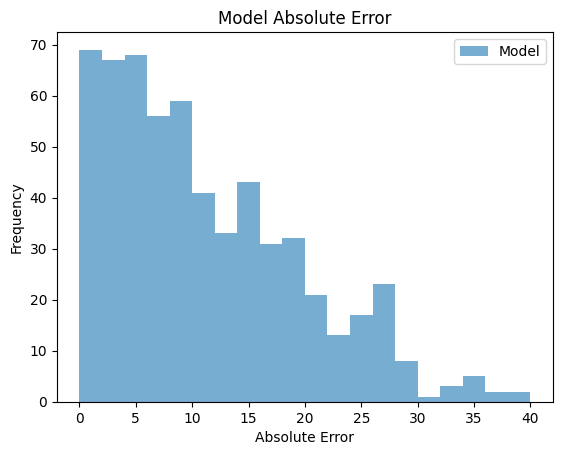

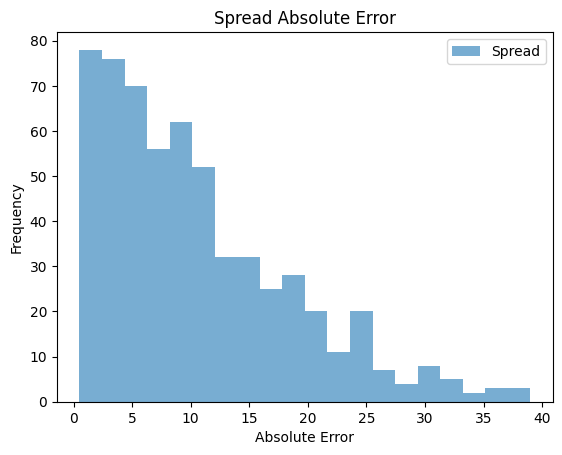




Substantial Differences: 
539



Most Important Value - True Bets - Model beat spread in 43.23% of the time





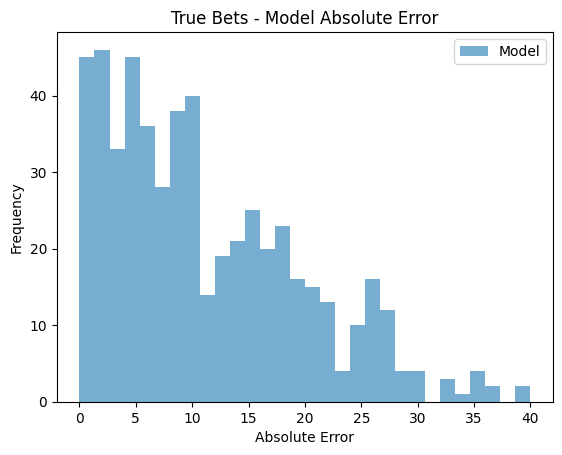

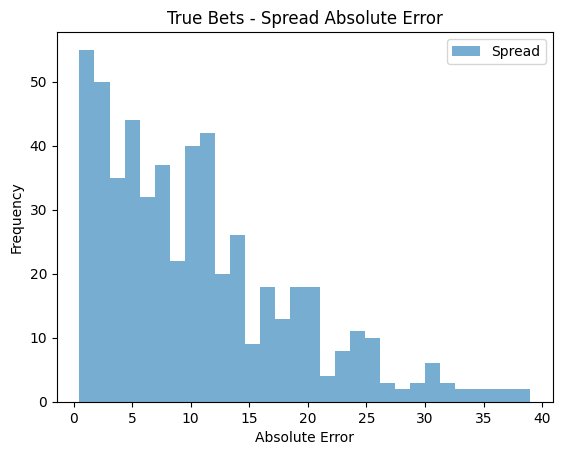




TRAIN MAE:
10.269515115822538



TRAIN R²:
0.15906991684090177



TEST MAE:
10.649558869701726



TEST R²:
0.09264310946742782








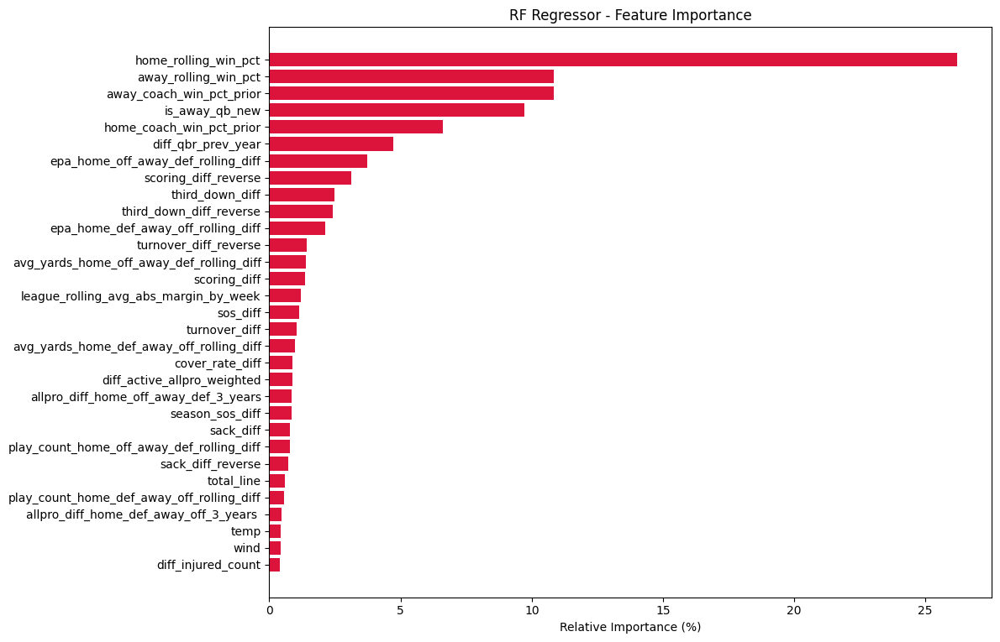

In [84]:
#after RF regressor, updating features to combine epa, avg yards, and play count (home off vs away def and home def vs away off)
#NEEDED TO CREATE NEW FUNCTION THAT DOES NOT HAVE ENCODING CODE SINCE I ALREADY HAVE THOSE FEATURES IN MY DF FROM LAST ITERATIONe
third_model, eval_df = random_forest_regressor_v2(updated_df)

In [85]:
eval_df

,game_id,game_margin,model_prediction,spread,model_vs_spread_diff,model_error,spread_error,model_vs_spread
2613,2021_15_HOU_JAX,-14.0,3.0,6.0,3.0,17.0,20.0,True
2590,2021_13_WAS_LV,-2.0,5.0,1.0,4.0,7.0,3.0,False
2722,2022_05_HOU_JAX,-7.0,3.0,7.0,4.0,10.0,14.0,True
347,2010_16_NYJ_CHI,4.0,2.5,1.5,1.0,1.5,2.5,True
2784,2022_09_BUF_NYJ,3.0,-2.0,-11.0,9.0,5.0,14.0,True
...,...,...,...,...,...,...,...,...
1300,2015_15_DEN_PIT,7.0,6.0,7.5,1.5,1.0,0.5,False
2645,2021_17_LV_IND,-3.0,5.5,8.5,3.0,8.5,11.5,True
2405,2020_16_TEN_GB,26.0,1.0,3.0,2.0,25.0,23.0,False
2842,2022_13_SEA_LA,-4.0,0.5,-7.0,7.5,4.5,3.0,False


When we filter for only features that were above 1 feature importance for our model in the previous feature set we got 22 features that were used here.

The MAE for our model is 11.17 which means, on average, our model predicted a game margin off by approximately 11.17 points from the real value.

An R-squared score of 5% means our model explains 5% of the variance in game margin. This is a significant decrease from the previous model.

Our winning percentage actually goes up in terms of betting compared to our previous iteration. This is most likely due to the hyperparameter tuning. The increase is marginal.

Our feature reduction and hyperparamter tuning is in good shape.

it seems our feature set may be the limiting factor. I have tested extensively with various hyperparameter and feature combinations. We have greatly improved the overfitting issue at least. The model is still struggling to improve at all though.

The feature importance is interesting though, diving deeper into a away qb vs home qb comparison may be a good idea.



####4th Iteration

In [86]:
def random_forest_regressor_v3(features_df):

    #features
    game_ids = features_df['game_id'].reset_index(drop=True)
    spread = features_df['spread_line'].reset_index(drop=True)
    X = features_df.drop(columns=['game_margin', 'game_id', 'spread_line'])
    #target variable
    y = features_df['game_margin'].reset_index(drop=True)

    #converts each category to binary value
    cat_features = X.select_dtypes(include=['object', 'category']).columns.tolist()
    quan_features = [col for col in X.columns if col not in cat_features]

    #checks categorical columns are all strings
    X[cat_features] = X[cat_features].astype(str)

    print("Number of Features:")
    print(len(quan_features) + len(cat_features))
    print('\n\n')
    print("Name of Features - Categorical and Quantative Respectively:")
    print(cat_features)
    print('\n\n')
    print(quan_features)
    print('\n\n')

    #encode categorical features
    cat_feature_encoding = ColumnTransformer([("cat_features", OneHotEncoder(handle_unknown='ignore', sparse_output=False), cat_features)], remainder='passthrough')

    X_encoded = cat_feature_encoding.fit_transform(X)
    new_cat_feat_names = cat_feature_encoding.named_transformers_['cat_features'].get_feature_names_out(cat_features)
    updated_feats = list(new_cat_feat_names) + list(quan_features)
    X_updated = pd.DataFrame(X_encoded, columns=updated_feats)
    X_updated = X_updated.astype(float)

    print("Features After Encoding:")
    print(X_updated.columns)
    print('\n\n')

    X_train, X_test, y_train, y_test, game_ids_train, game_ids_test, spread_train, spread_test = train_test_split(X_updated, y, game_ids, spread, test_size=0.3, random_state=3)
    #X_train, X_test, y_train, y_test = train_test_split(X_updated, y, test_size=0.2, random_state=3)
    rf_reg = RandomForestRegressor(random_state=3)

    #grid search
    grid = {
        'n_estimators': [500],
        'max_depth': [15],
        'min_samples_split': [10],
        'min_samples_leaf': [5],
        'max_features': [20],
        'criterion': ['absolute_error']
    }

    gs = GridSearchCV(estimator=rf_reg, param_grid=grid, cv=2, scoring='neg_mean_absolute_error', n_jobs=-1, verbose=2)
    gs.fit(X_train, y_train)

    grid_model = gs.best_estimator_
    print("\nBest hyperparameters:")
    print(gs.best_params_)

    print(f"\n\nBest CV MAE: {-gs.best_score_:.4f}")
    print('\n\n')

    #rf_reg = RandomForestRegressor(n_estimators=100, random_state=3, max_depth=model_depth)
    #rf_reg.fit(X_train, y_train)

    test_pred = grid_model.predict(X_test)
    train_pred = grid_model.predict(X_train)
    test_pred_rounded = np.round(test_pred * 2) / 2

    #spread = X_test['spread_line']

    #evaluate model
    eval_df = pd.DataFrame({
        'game_id': game_ids_test,
        'game_margin': y_test,
        'model_prediction': test_pred_rounded,
        'spread': spread_test
    })


    #remove pushes
    eval_df = eval_df[eval_df['game_margin'] != eval_df['spread']].copy()
    eval_df = eval_df[eval_df['model_prediction'] != eval_df['spread']].copy()

    #diff
    eval_df['model_vs_spread_diff'] = np.abs(eval_df['model_prediction'] - eval_df['spread'])
    true_bets_df = eval_df[eval_df['model_vs_spread_diff'] >= 1].copy()

    eval_df['model_error'] = np.abs(eval_df['game_margin'] - eval_df['model_prediction'])
    eval_df['spread_error'] = np.abs(eval_df['game_margin'] - eval_df['spread'])

    eval_df['model_vs_spread'] = eval_df['model_error'] < eval_df['spread_error']

    winning_percentage = eval_df['model_vs_spread'].mean()

    print(f"Model beat spread in {winning_percentage*100:.2f}% of the time")
    print('\n\n')

    plt.hist(eval_df['model_error'], bins=20, alpha=0.6, label='Model')
    plt.legend()
    plt.title('Model Absolute Error')
    plt.xlabel('Absolute Error')
    plt.ylabel('Frequency')
    plt.show()
    print('\n\n')

    plt.hist(eval_df['spread_error'], bins=20, alpha=0.6, label='Spread')
    plt.legend()
    plt.title('Spread Absolute Error')
    plt.xlabel('Absolute Error')
    plt.ylabel('Frequency')
    plt.show()
    print('\n\n')

    #true betting edge percentage
    print("Substantial Differences: ")
    print(len(true_bets_df))
    print('\n\n')
    true_bets_df['model_error'] = np.abs(true_bets_df['game_margin'] - true_bets_df['model_prediction'])
    true_bets_df['spread_error'] = np.abs(true_bets_df['game_margin'] - true_bets_df['spread'])

    true_bets_df['model_vs_spread'] = true_bets_df['model_error'] < true_bets_df['spread_error']

    winning_percentage = true_bets_df['model_vs_spread'].mean()

    print(f"Most Important Value - True Bets - Model beat spread in {winning_percentage*100:.2f}% of the time")
    print('\n\n')

    plt.hist(true_bets_df['model_error'], bins=30, alpha=0.6, label='Model')
    plt.legend()
    plt.title('True Bets - Model Absolute Error')
    plt.xlabel('Absolute Error')
    plt.ylabel('Frequency')
    plt.show()
    print('\n\n')

    plt.hist(true_bets_df['spread_error'], bins=30, alpha=0.6, label='Spread')
    plt.legend()
    plt.title('True Bets - Spread Absolute Error')
    plt.xlabel('Absolute Error')
    plt.ylabel('Frequency')
    plt.show()

    print('\n\n')
    print("TRAIN MAE:")
    print(mean_absolute_error(y_train, train_pred))
    print('\n\n')

    print("TRAIN R²:")
    print(r2_score(y_train, train_pred))
    print('\n\n')

    print("TEST MAE:")
    print(mean_absolute_error(y_test, test_pred))
    print('\n\n')

    print("TEST R²:")
    print(r2_score(y_test, test_pred))
    print('\n\n')

    #Calculating the feature importance
    feature_importance = grid_model.feature_importances_
    feature_importance = 100.0*(feature_importance/np.sum(feature_importance))

    # Sort features by importance
    sorted_idx = np.argsort(feature_importance)[::-1]
    features = np.array(X_updated.columns)[sorted_idx]
    imp = feature_importance[sorted_idx]

    print('\n\n')

    # Plot all feature importances
    plt.figure(figsize=(12, max(6, 0.25 * len(features))))  # dynamic height
    plt.barh(np.arange(len(features)), imp[::-1], color='crimson', align='center')
    plt.yticks(np.arange(len(features)), features[::-1])
    plt.xlabel('Relative Importance (%)')
    plt.title('RF Regressor - Feature Importance')
    plt.tight_layout()
    plt.show()

    return grid_model, true_bets_df

Number of Features:
78



Name of Features - Categorical and Quantative Respectively:
['roof', 'surface']



['away_rest', 'home_rest', 'total_line', 'div_game', 'temp', 'wind', 'is_playoff', 'is_final_week', 'home_qb_switch', 'away_qb_switch', 'home_rolling_avg_epa', 'home_rolling_avg_yards', 'home_rolling_play_count', 'away_rolling_avg_epa', 'away_rolling_avg_yards', 'away_rolling_play_count', 'home_rolling_allowed_avg_epa', 'home_rolling_allowed_avg_yards', 'home_rolling_allowed_play_count', 'away_rolling_allowed_avg_epa', 'away_rolling_allowed_avg_yards', 'away_rolling_allowed_play_count', 'epa_home_off_away_def_rolling_diff', 'epa_home_def_away_off_rolling_diff', 'avg_yards_home_off_away_def_rolling_diff', 'avg_yards_home_def_away_off_rolling_diff', 'play_count_home_off_away_def_rolling_diff', 'play_count_home_def_away_off_rolling_diff', 'home_recent_sos_opponent_avg', 'home_season_sos_opponent_avg', 'away_recent_sos_opponent_avg', 'away_season_sos_opponent_avg', 'sos_diff', 'seas

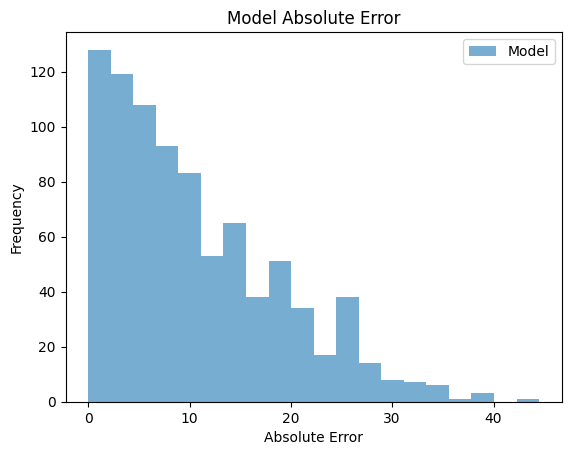

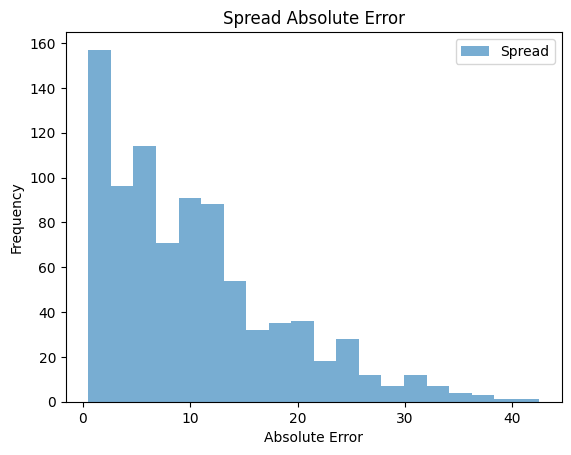




Substantial Differences: 
767



Most Important Value - True Bets - Model beat spread in 45.63% of the time





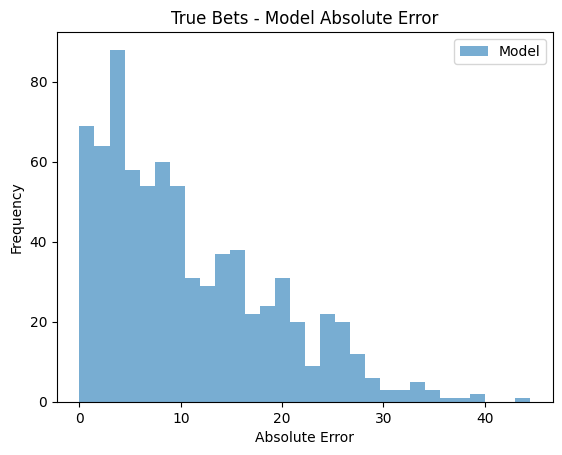

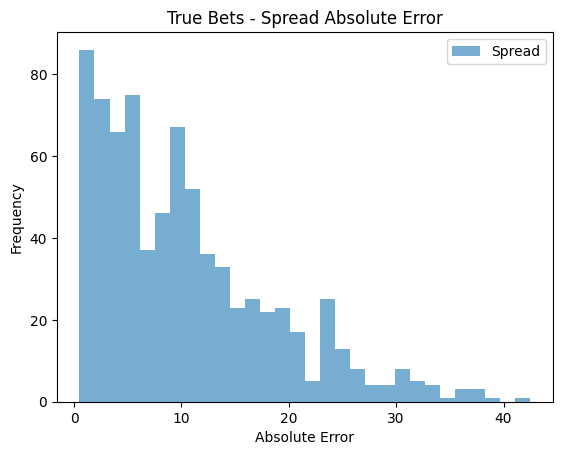




TRAIN MAE:
7.514063734290845



TRAIN R²:
0.5165107925205226



TEST MAE:
10.341365062761508



TEST R²:
0.12946084291429438








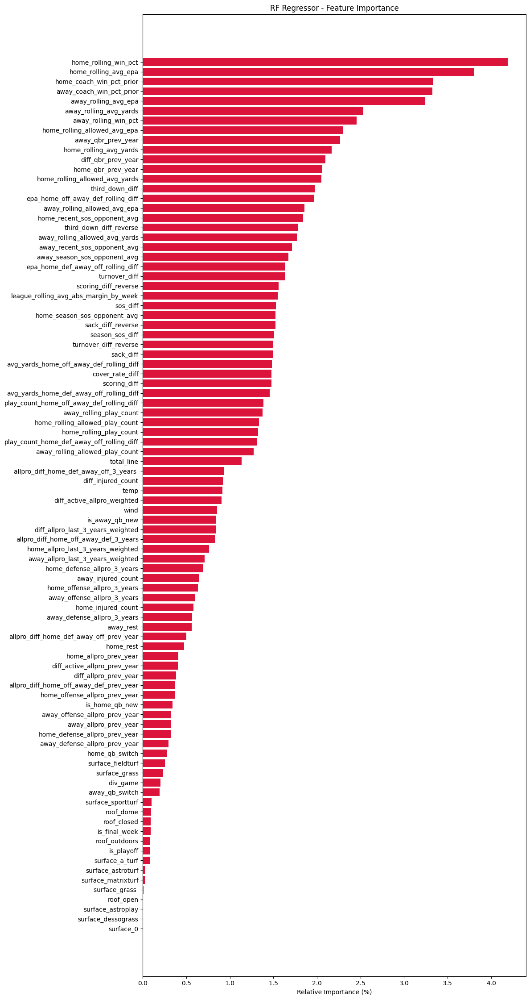

(RandomForestRegressor(criterion='absolute_error', max_depth=15, max_features=20,
                       min_samples_leaf=5, min_samples_split=10,
                       n_estimators=500, random_state=3),
               game_id  game_margin  model_prediction  spread  \
 2613  2021_15_HOU_JAX        -14.0               3.0     6.0   
 2722  2022_05_HOU_JAX         -7.0               5.5     7.0   
 347   2010_16_NYJ_CHI          4.0               2.5     1.5   
 2784  2022_09_BUF_NYJ          3.0              -2.5   -11.0   
 2186  2019_17_TEN_HOU        -21.0               1.0   -10.0   
 ...               ...          ...               ...     ...   
 1732   2017_16_LA_TEN         -4.0              -1.5    -5.5   
 2239  2020_05_PHI_PIT          9.0               5.5     7.5   
 1414   2016_08_GB_ATL          1.0               4.0     3.0   
 845    2013_09_PIT_NE         24.0               3.5     5.5   
 1535  2016_18_MIA_PIT         18.0               6.5    11.0   
 
       model_

In [87]:
#going to look at the first iteration but with hyperparameter tuning
random_forest_regressor_v3(features_df)

In [88]:
true_bets_df

,game_id,game_margin,model_prediction,spread,model_vs_spread_diff,model_error,spread_error,model_vs_spread
2613,2021_15_HOU_JAX,-14.0,1.5,6.0,4.5,15.5,20.0,True
2722,2022_05_HOU_JAX,-7.0,3.0,7.0,4.0,10.0,14.0,True
347,2010_16_NYJ_CHI,4.0,0.0,1.5,1.5,4.0,2.5,False
2784,2022_09_BUF_NYJ,3.0,-6.0,-11.0,5.0,9.0,14.0,True
2186,2019_17_TEN_HOU,-21.0,5.0,-10.0,15.0,26.0,11.0,False
...,...,...,...,...,...,...,...,...
1300,2015_15_DEN_PIT,7.0,6.5,7.5,1.0,0.5,0.5,False
2405,2020_16_TEN_GB,26.0,0.5,3.0,2.5,25.5,23.0,False
2977,2023_05_DAL_SF,32.0,2.5,3.5,1.0,29.5,28.5,False
2842,2022_13_SEA_LA,-4.0,-1.5,-7.0,5.5,2.5,3.0,True


####5th Iteration

same as 4th iteration but with spread line feature included.

In [89]:
def random_forest_regressor_v3_with_spread(features_df):

    #features
    game_ids = features_df['game_id'].reset_index(drop=True)
    spread = features_df['spread_line'].reset_index(drop=True)
    X = features_df.drop(columns=['game_margin', 'game_id'])
    #target variable
    y = features_df['game_margin'].reset_index(drop=True)

    #converts each category to binary value
    cat_features = X.select_dtypes(include=['object', 'category']).columns.tolist()
    quan_features = [col for col in X.columns if col not in cat_features]

    #checks categorical columns are all strings
    X[cat_features] = X[cat_features].astype(str)

    print("Number of Features:")
    print(len(quan_features) + len(cat_features))
    print('\n\n')
    print("Name of Features - Categorical and Quantative Respectively:")
    print(cat_features)
    print('\n\n')
    print(quan_features)
    print('\n\n')

    #encode categorical features
    cat_feature_encoding = ColumnTransformer([("cat_features", OneHotEncoder(handle_unknown='ignore', sparse_output=False), cat_features)], remainder='passthrough')

    X_encoded = cat_feature_encoding.fit_transform(X)
    new_cat_feat_names = cat_feature_encoding.named_transformers_['cat_features'].get_feature_names_out(cat_features)
    updated_feats = list(new_cat_feat_names) + list(quan_features)
    X_updated = pd.DataFrame(X_encoded, columns=updated_feats)
    X_updated = X_updated.astype(float)

    print("Features After Encoding:")
    print(X_updated.columns)
    print('\n\n')

    X_train, X_test, y_train, y_test, game_ids_train, game_ids_test, spread_train, spread_test = train_test_split(X_updated, y, game_ids, spread, test_size=0.3, random_state=3)
    #X_train, X_test, y_train, y_test = train_test_split(X_updated, y, test_size=0.2, random_state=3)
    rf_reg = RandomForestRegressor(random_state=3)

    #grid search
    grid = {
        'n_estimators': [500],
        'max_depth': [15],
        'min_samples_split': [10],
        'min_samples_leaf': [5],
        'max_features': [20],
        'criterion': ['absolute_error']
    }

    gs = GridSearchCV(estimator=rf_reg, param_grid=grid, cv=2, scoring='neg_mean_absolute_error', n_jobs=-1, verbose=2)
    gs.fit(X_train, y_train)

    grid_model = gs.best_estimator_
    print("\nBest hyperparameters:")
    print(gs.best_params_)

    print(f"\n\nBest CV MAE: {-gs.best_score_:.4f}")
    print('\n\n')

    #rf_reg = RandomForestRegressor(n_estimators=100, random_state=3, max_depth=model_depth)
    #rf_reg.fit(X_train, y_train)

    test_pred = grid_model.predict(X_test)
    train_pred = grid_model.predict(X_train)
    test_pred_rounded = np.round(test_pred * 2) / 2

    #spread = X_test['spread_line']

    #evaluate model
    eval_df = pd.DataFrame({
        'game_id': game_ids_test,
        'game_margin': y_test,
        'model_prediction': test_pred_rounded,
        'spread': spread_test
    })


    #remove pushes
    eval_df = eval_df[eval_df['game_margin'] != eval_df['spread']].copy()
    eval_df = eval_df[eval_df['model_prediction'] != eval_df['spread']].copy()

    #diff
    eval_df['model_vs_spread_diff'] = np.abs(eval_df['model_prediction'] - eval_df['spread'])
    true_bets_df = eval_df[eval_df['model_vs_spread_diff'] >= 1].copy()

    eval_df['model_error'] = np.abs(eval_df['game_margin'] - eval_df['model_prediction'])
    eval_df['spread_error'] = np.abs(eval_df['game_margin'] - eval_df['spread'])

    eval_df['model_vs_spread'] = eval_df['model_error'] < eval_df['spread_error']

    winning_percentage = eval_df['model_vs_spread'].mean()

    print(f"Model beat spread in {winning_percentage*100:.2f}% of the time")
    print('\n\n')

    plt.hist(eval_df['model_error'], bins=20, alpha=0.6, label='Model')
    plt.legend()
    plt.title('Model Absolute Error')
    plt.xlabel('Absolute Error')
    plt.ylabel('Frequency')
    plt.show()
    print('\n\n')

    plt.hist(eval_df['spread_error'], bins=20, alpha=0.6, label='Spread')
    plt.legend()
    plt.title('Spread Absolute Error')
    plt.xlabel('Absolute Error')
    plt.ylabel('Frequency')
    plt.show()
    print('\n\n')

    #true betting edge percentage
    print("Substantial Differences: ")
    print(len(true_bets_df))
    print('\n\n')
    true_bets_df['model_error'] = np.abs(true_bets_df['game_margin'] - true_bets_df['model_prediction'])
    true_bets_df['spread_error'] = np.abs(true_bets_df['game_margin'] - true_bets_df['spread'])

    true_bets_df['model_vs_spread'] = true_bets_df['model_error'] < true_bets_df['spread_error']

    winning_percentage = true_bets_df['model_vs_spread'].mean()

    print(f"Most Important Value - True Bets - Model beat spread in {winning_percentage*100:.2f}% of the time")
    print('\n\n')

    plt.hist(true_bets_df['model_error'], bins=30, alpha=0.6, label='Model')
    plt.legend()
    plt.title('True Bets - Model Absolute Error')
    plt.xlabel('Absolute Error')
    plt.ylabel('Frequency')
    plt.show()
    print('\n\n')

    plt.hist(true_bets_df['spread_error'], bins=30, alpha=0.6, label='Spread')
    plt.legend()
    plt.title('True Bets - Spread Absolute Error')
    plt.xlabel('Absolute Error')
    plt.ylabel('Frequency')
    plt.show()

    print('\n\n')
    print("TRAIN MAE:")
    print(mean_absolute_error(y_train, train_pred))
    print('\n\n')

    print("TRAIN R²:")
    print(r2_score(y_train, train_pred))
    print('\n\n')

    print("TEST MAE:")
    print(mean_absolute_error(y_test, test_pred))
    print('\n\n')

    print("TEST R²:")
    print(r2_score(y_test, test_pred))
    print('\n\n')

    #Calculating the feature importance
    feature_importance = grid_model.feature_importances_
    feature_importance = 100.0*(feature_importance/np.sum(feature_importance))

    # Sort features by importance
    sorted_idx = np.argsort(feature_importance)[::-1]
    features = np.array(X_updated.columns)[sorted_idx]
    imp = feature_importance[sorted_idx]

    print('\n\n')

    # Plot all feature importances
    plt.figure(figsize=(12, max(6, 0.25 * len(features))))  # dynamic height
    plt.barh(np.arange(len(features)), imp[::-1], color='crimson', align='center')
    plt.yticks(np.arange(len(features)), features[::-1])
    plt.xlabel('Relative Importance (%)')
    plt.title('RF Regressor - Feature Importance')
    plt.tight_layout()
    plt.show()

    return grid_model, true_bets_df

Number of Features:
79



Name of Features - Categorical and Quantative Respectively:
['roof', 'surface']



['spread_line', 'away_rest', 'home_rest', 'total_line', 'div_game', 'temp', 'wind', 'is_playoff', 'is_final_week', 'home_qb_switch', 'away_qb_switch', 'home_rolling_avg_epa', 'home_rolling_avg_yards', 'home_rolling_play_count', 'away_rolling_avg_epa', 'away_rolling_avg_yards', 'away_rolling_play_count', 'home_rolling_allowed_avg_epa', 'home_rolling_allowed_avg_yards', 'home_rolling_allowed_play_count', 'away_rolling_allowed_avg_epa', 'away_rolling_allowed_avg_yards', 'away_rolling_allowed_play_count', 'epa_home_off_away_def_rolling_diff', 'epa_home_def_away_off_rolling_diff', 'avg_yards_home_off_away_def_rolling_diff', 'avg_yards_home_def_away_off_rolling_diff', 'play_count_home_off_away_def_rolling_diff', 'play_count_home_def_away_off_rolling_diff', 'home_recent_sos_opponent_avg', 'home_season_sos_opponent_avg', 'away_recent_sos_opponent_avg', 'away_season_sos_opponent_avg', 's

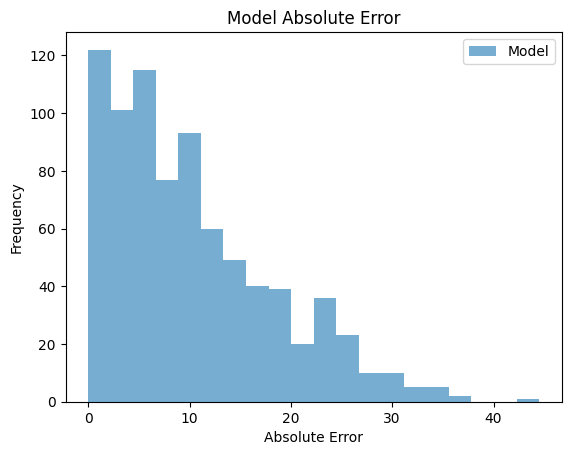

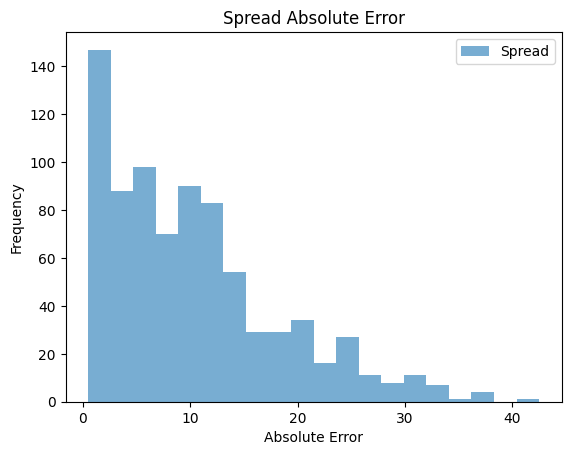




Substantial Differences: 
616



Most Important Value - True Bets - Model beat spread in 47.56% of the time





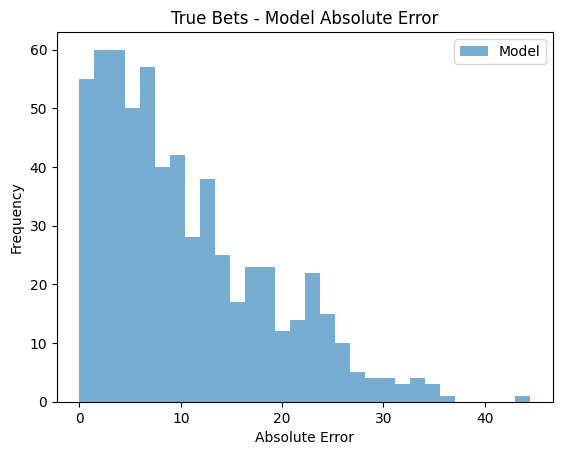

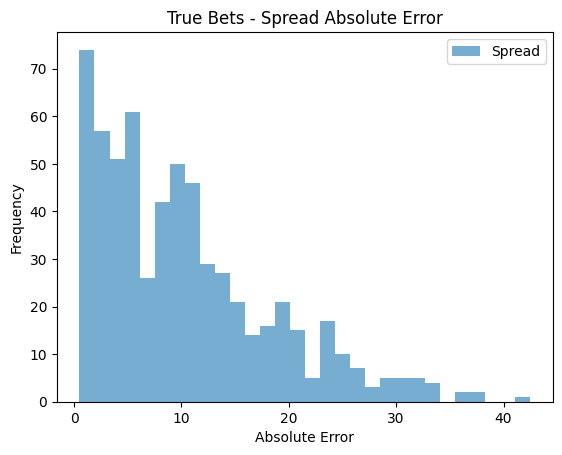




TRAIN MAE:
7.312161131059247



TRAIN R²:
0.5389869505570657



TEST MAE:
10.091851464435146



TEST R²:
0.1679755498231752








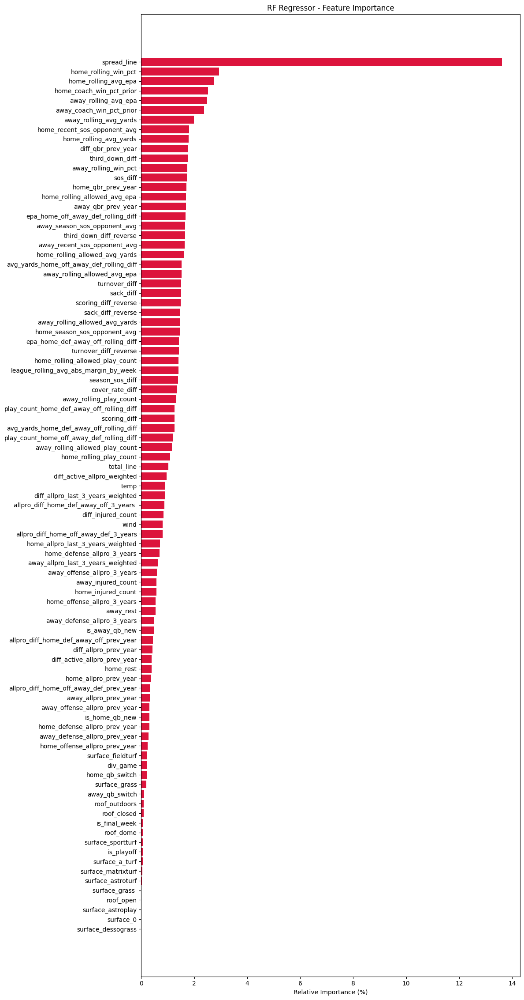

In [90]:
#same model as 4th iteration but with spread_line included as a feature
fith_model, fifth_eval = random_forest_regressor_v3_with_spread(features_df)

In [91]:
fifth_eval.head()

,game_id,game_margin,model_prediction,spread,model_vs_spread_diff,model_error,spread_error,model_vs_spread
2613,2021_15_HOU_JAX,-14.0,4.0,6.0,2.0,18.0,20.0,True
2590,2021_13_WAS_LV,-2.0,-1.0,1.0,2.0,1.0,3.0,True
347,2010_16_NYJ_CHI,4.0,-0.5,1.5,2.0,4.5,2.5,False
2784,2022_09_BUF_NYJ,3.0,-7.0,-11.0,4.0,10.0,14.0,True
2186,2019_17_TEN_HOU,-21.0,-3.5,-10.0,6.5,17.5,11.0,False


###XGBoost Model

In [92]:
# Columns as list
columns_list = features_df.columns.tolist()
print(columns_list)


['game_id', 'game_margin', 'spread_line', 'away_rest', 'home_rest', 'total_line', 'div_game', 'roof', 'surface', 'temp', 'wind', 'is_playoff', 'is_final_week', 'home_qb_switch', 'away_qb_switch', 'home_rolling_avg_epa', 'home_rolling_avg_yards', 'home_rolling_play_count', 'away_rolling_avg_epa', 'away_rolling_avg_yards', 'away_rolling_play_count', 'home_rolling_allowed_avg_epa', 'home_rolling_allowed_avg_yards', 'home_rolling_allowed_play_count', 'away_rolling_allowed_avg_epa', 'away_rolling_allowed_avg_yards', 'away_rolling_allowed_play_count', 'epa_home_off_away_def_rolling_diff', 'epa_home_def_away_off_rolling_diff', 'avg_yards_home_off_away_def_rolling_diff', 'avg_yards_home_def_away_off_rolling_diff', 'play_count_home_off_away_def_rolling_diff', 'play_count_home_def_away_off_rolling_diff', 'home_recent_sos_opponent_avg', 'home_season_sos_opponent_avg', 'away_recent_sos_opponent_avg', 'away_season_sos_opponent_avg', 'sos_diff', 'season_sos_diff', 'home_allpro_last_3_years_weighted'

####1st Iteration

In [93]:
# Preparation: config + builders
from __future__ import annotations
import numpy as np
import pandas as pd

from dataclasses import dataclass, field
from typing import Dict, Any, List, Tuple, Optional

from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OrdinalEncoder
from sklearn.pipeline import Pipeline
from xgboost import XGBRegressor


@dataclass(frozen=True)
class Iter1Config:
    test_size: float = 0.2
    random_state: int = 42

    # columns that should never be features
    drop_non_features: Tuple[str, ...] = (
        'game_id', 'home_team', 'away_team', 'season', 'week'
    )

    # potential column groups (we'll only use the ones present)
    categorical_cols: Tuple[str, ...] = ('roof', 'surface')
    boolean_cols: Tuple[str, ...] = (
        'is_playoff', 'is_final_week',
        'home_qb_switch', 'away_qb_switch',
        'is_home_qb_new', 'is_away_qb_new'
    )

    # XGBoost params (safe defaults; tweak per run as needed)
    xgb_params: Dict[str, Any] = field(default_factory=lambda: dict(
        n_estimators=500,
        max_depth=10,
        learning_rate=0.03,
        min_child_weight=1,
        subsample=0.8,
        colsample_bytree=0.8,
        objective='reg:squarederror',
        random_state=42,
        verbosity=1,
        tree_method='hist',
        n_jobs=-1,
    ))


def _prepare_Xy(features_df: pd.DataFrame, cfg: Iter1Config):
    """Return fresh X, y without mutating the incoming DataFrame."""
    if 'game_margin' not in features_df.columns:
        raise ValueError("features_df must contain a 'game_margin' column as target.")

    # y is a view; X is a deep copy of usable features
    y = features_df['game_margin'].astype(float)
    X = features_df.drop(columns=['game_margin'], errors='ignore')
    X = X.drop(columns=list(cfg.drop_non_features), errors='ignore').copy(deep=True)

    # Identify column groups that actually exist
    cats = [c for c in cfg.categorical_cols if c in X.columns]
    bools = [c for c in cfg.boolean_cols if c in X.columns]
    nums  = [c for c in X.columns if c not in set(cats) | set(bools)]

    # Cast categoricals to string on the COPY (doesn't affect features_df)
    for c in cats:
        X[c] = X[c].astype(str)

    return X, y, cats, bools, nums


def _make_preprocessor(cats: List[str], bools: List[str], nums: List[str]) -> ColumnTransformer:
    """Ordinal-encode categoricals; pass numeric & boolean through."""
    pre = ColumnTransformer(
        transformers=[
            ('cat', OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1), cats),
            ('num', 'passthrough', nums + bools),
        ],
        remainder='drop',
        verbose_feature_names_out=False,
    )
    return pre


def _make_pipeline(pre: ColumnTransformer, cfg: Iter1Config) -> Pipeline:
    model = XGBRegressor(**cfg.xgb_params)
    pipe = Pipeline(steps=[
        ('preprocessor', pre),
        ('regressor', model),
    ])
    return pipe


In [94]:
# Iteration 1
from typing import Optional
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, r2_score

def run_iteration1(features_df: pd.DataFrame, cfg: Optional[Iter1Config] = None):
    """
    Train/evaluate Iteration
    Returns a results dict containing metrics and the fitted pipeline.
    """
    cfg = cfg or Iter1Config()

    # Fresh features/target
    X, y, cats, bools, nums = _prepare_Xy(features_df, cfg)

    # Fresh split (no leakage across runs)
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=cfg.test_size, random_state=cfg.random_state, shuffle=True
    )

    # Build fresh preprocessor and pipeline
    pre = _make_preprocessor(cats, bools, nums)
    pipe = _make_pipeline(pre, cfg)

    # Fit
    pipe.fit(X_train, y_train)

    # Predict
    y_pred = pipe.predict(X_test)

    # Eval
    mae = mean_absolute_error(y_test, y_pred)
    r2  = r2_score(y_test, y_pred)

    # Return a self-contained results package
    return {
        "mae": float(mae),
        "r2": float(r2),
        "y_test": y_test.reset_index(drop=True),
        "y_pred": pd.Series(y_pred),
        "pipeline": pipe,                  # fitted pipeline for this run only
        "used_columns": {
            "categorical": cats,
            "boolean": bools,
            "numeric": nums,
        },
        "config": cfg,
    }

results = run_iteration1(features_df)
print(f"MAE: {results['mae']:.2f}  |  R²: {results['r2']:.2f}")


MAE: 10.71  |  R²: 0.14


####Grid Search (do not run again)

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OrdinalEncoder
from xgboost import XGBRegressor
from sklearn.metrics import make_scorer, r2_score
import numpy as np

# --- Use X_lean and y from your lean model setup ---

# Dynamically determine valid feature groups
categorical_cols = [col for col in ['roof', 'surface'] if col in X_lean.columns]
boolean_cols = [col for col in [
    'is_playoff', 'is_final_week', 'home_qb_switch', 'away_qb_switch',
    'is_home_qb_new', 'is_away_qb_new'
] if col in X_lean.columns]
numerical_cols = [col for col in X_lean.columns if col not in categorical_cols + boolean_cols]

# Preprocessing pipeline
preprocessor = ColumnTransformer(
    transformers=[
        ('cat', OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1), categorical_cols),
        ('num', 'passthrough', numerical_cols + boolean_cols)
    ]
)

# Base pipeline
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('regressor', XGBRegressor(
        objective='reg:squarederror',
        random_state=42,
        verbosity=0
    ))
])

# --- Grid Search Params ---
param_grid = {
    'regressor__n_estimators': [100, 300, 500],
    'regressor__max_depth': [3, 4, 6],
    'regressor__learning_rate': [0.01, 0.05, 0.1],
    'regressor__min_child_weight': [1, 3, 5],
    'regressor__subsample': [0.6, 0.8],
    'regressor__colsample_bytree': [0.6, 0.8],
    'regressor__reg_alpha': [0, 1],
    'regressor__reg_lambda': [1, 3],
}

# GridSearchCV setup
grid_search = GridSearchCV(
    estimator=pipeline,
    param_grid=param_grid,
    cv=3,  # use 3 to reduce runtime, or 5 for thorough search
    scoring=make_scorer(r2_score),
    n_jobs=-1,
    verbose=2
)

# --- Fit grid search ---
grid_search.fit(X_lean, y)

# --- Best model and score ---
print(f"\n Best R²: {grid_search.best_score_:.3f}")
print("Best parameters:")
for param, val in grid_search.best_params_.items():
    print(f"{param}: {val}")


In [ ]:
best_model = grid_search.best_estimator_
best_model.fit(X_lean, y)


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, r2_score

# 1. Split data for final evaluation
X_train, X_test, y_train, y_test = train_test_split(X_lean, y, test_size=0.2, random_state=42)

# 2. Use best parameters from GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OrdinalEncoder
from xgboost import XGBRegressor

# Dynamically build column groups
categorical_cols = [col for col in ['roof', 'surface'] if col in X_lean.columns]
boolean_cols = [col for col in [
    'is_playoff', 'is_final_week', 'home_qb_switch', 'away_qb_switch',
    'is_home_qb_new', 'is_away_qb_new'
] if col in X_lean.columns]
numerical_cols = [col for col in X_lean.columns if col not in categorical_cols + boolean_cols]

# Preprocessor
preprocessor = ColumnTransformer(
    transformers=[
        ('cat', OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1), categorical_cols),
        ('num', 'passthrough', numerical_cols + boolean_cols)
    ]
)

# Final model with best hyperparameters
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('regressor', XGBRegressor(
        n_estimators=500,
        max_depth=3,
        learning_rate=0.01,
        min_child_weight=3,
        subsample=0.6,
        colsample_bytree=0.6,
        reg_alpha=1,
        reg_lambda=3,
        objective='reg:squarederror',
        random_state=42
    ))
])

# 3. Train on train set
pipeline.fit(X_train, y_train)

# 4. Predict and evaluate
train_preds = pipeline.predict(X_train)
test_preds = pipeline.predict(X_test)

train_r2 = r2_score(y_train, train_preds)
test_r2 = r2_score(y_test, test_preds)
mae = mean_absolute_error(y_test, test_preds)

print(f"Final Model Performance:")
print(f"Train R²: {train_r2:.3f}")
print(f"Test R²: {test_r2:.3f}")
print(f"Test MAE: {mae:.2f}")


####XGB Iteration 2

In [95]:
# Iteration 2 — Preparation
from __future__ import annotations
import pandas as pd
from dataclasses import dataclass, field
from typing import Dict, Any, List, Tuple, Optional

from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OrdinalEncoder
from sklearn.pipeline import Pipeline
from xgboost import XGBRegressor

@dataclass(frozen=True)
class Iter2Config:
    test_size: float = 0.2
    random_state: int = 42

    drop_non_features: Tuple[str, ...] = ('game_id','home_team','away_team','season','week')
    categorical_cols: Tuple[str, ...] = ('roof','surface')
    boolean_cols: Tuple[str, ...] = (
        'is_playoff','is_final_week','home_qb_switch','away_qb_switch','is_home_qb_new','is_away_qb_new'
    )

    # Your “GridSearch best params”
    xgb_params: Dict[str, Any] = field(default_factory=lambda: dict(
        n_estimators=500,
        max_depth=3,
        learning_rate=0.01,
        min_child_weight=3,
        subsample=0.6,
        colsample_bytree=0.6,
        reg_alpha=1.0,
        reg_lambda=3.0,
        objective='reg:squarederror',
        random_state=42,
        verbosity=1,
        tree_method='hist',
        n_jobs=-1,
    ))

def _prepare_Xy_iter2(features_df: pd.DataFrame, cfg: Iter2Config):
    if 'game_margin' not in features_df.columns:
        raise ValueError("features_df must contain 'game_margin'.")

    y = features_df['game_margin'].astype(float)
    X = features_df.drop(columns=['game_margin'], errors='ignore')
    X = X.drop(columns=list(cfg.drop_non_features), errors='ignore').copy(deep=True)

    cats = [c for c in cfg.categorical_cols if c in X.columns]
    bools = [c for c in cfg.boolean_cols if c in X.columns]
    nums  = [c for c in X.columns if c not in set(cats) | set(bools)]

    # Cast categoricals on the COPY only
    for c in cats:
        X[c] = X[c].astype(str)

    return X, y, cats, bools, nums

def _make_preprocessor_iter2(cats: List[str], bools: List[str], nums: List[str]) -> ColumnTransformer:
    return ColumnTransformer(
        transformers=[
            ('cat', OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1), cats),
            ('num', 'passthrough', nums + bools),
        ],
        remainder='drop',
        verbose_feature_names_out=False,
    )

def _make_pipeline_iter2(pre: ColumnTransformer, cfg: Iter2Config) -> Pipeline:
    return Pipeline(steps=[
        ('preprocessor', pre),
        ('regressor', XGBRegressor(**cfg.xgb_params)),
    ])


In [96]:
# Iteration 2 — Isolated Run
from typing import Optional
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, r2_score
import pandas as pd

def run_iteration2(features_df: pd.DataFrame, cfg: Optional[Iter2Config] = None):
    cfg = cfg or Iter2Config()

    # Fresh data each run
    X, y, cats, bools, nums = _prepare_Xy_iter2(features_df, cfg)

    # Fresh split
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=cfg.test_size, random_state=cfg.random_state, shuffle=True
    )

    # Fresh pipeline
    pre = _make_preprocessor_iter2(cats, bools, nums)
    pipe = _make_pipeline_iter2(pre, cfg)

    # Fit & predict
    pipe.fit(X_train, y_train)
    y_pred = pipe.predict(X_test)

    # Metrics
    mae = mean_absolute_error(y_test, y_pred)
    r2  = r2_score(y_test, y_pred)

    print(f"Iteration 2 - MAE: {mae:.2f}")
    print(f"Iteration 2 - R²: {r2:.2f}")

    return {
        "mae": float(mae),
        "r2": float(r2),
        "y_test": y_test.reset_index(drop=True),
        "y_pred": pd.Series(y_pred),
        "pipeline": pipe,
        "used_columns": {"categorical": cats, "boolean": bools, "numeric": nums},
        "config": cfg,
    }

res2 = run_iteration2(features_df)


Iteration 2 - MAE: 10.43
Iteration 2 - R²: 0.18


Feature Importance

In [97]:
# Plot helpers for Iteration Models
import numpy as np
import matplotlib.pyplot as plt
import textwrap
try:
    import seaborn as sns
except Exception:
    sns = None


def _safe_feature_names_from_preprocessor(preprocessor, used_columns):
    """
    Try to pull transformed feature names from the ColumnTransformer.
    Fall back to the known column order we fed it:
      - ['cat' block] followed by ['num' block], where 'num' included numerics + booleans.
    """
    # Preferred: ask the preprocessor (works on sklearn >= 1.0)
    try:
        names = preprocessor.get_feature_names_out()
        # ColumnTransformer may prefix steps; we set verbose_feature_names_out=False so names should be original columns.
        return list(names)
    except Exception:
        pass

    # Fallback: reconstruct in our known order
    cats = used_columns.get("categorical", [])
    bools = used_columns.get("boolean", [])
    nums  = used_columns.get("numeric", [])
    # Our ColumnTransformer order: ('cat', cats), then ('num', nums + bools)
    return list(cats) + list(nums) + list(bools)


def plot_feature_importances(results, top_n=25, figsize=(10, 8)):
    """
    Plots top-N feature importances from a results dict produced by run_iteration1/2.
    """
    pipe = results["pipeline"]
    used_columns = results["used_columns"]
    model = pipe.named_steps["regressor"]
    importances = getattr(model, "feature_importances_", None)

    if importances is None:
        raise ValueError("This estimator does not expose feature_importances_.")

    # Determine transformed feature names
    pre = pipe.named_steps["preprocessor"]
    feature_names = _safe_feature_names_from_preprocessor(pre, used_columns)

    if len(feature_names) != len(importances):
        # As a backup, build names from used_columns in the order we created transformers
        feature_names = list(used_columns.get("categorical", [])) + \
                        list(used_columns.get("numeric", [])) + \
                        list(used_columns.get("boolean", []))

    # Sort
    idx = np.argsort(importances)[::-1]
    idx = idx[:top_n]
    sorted_imps = importances[idx]
    sorted_names = [feature_names[i] for i in idx]

    # Plot
    plt.figure(figsize=figsize)
    plt.barh(range(len(sorted_imps)), sorted_imps)
    plt.yticks(range(len(sorted_imps)), [textwrap.fill(n, 25) for n in sorted_names])
    plt.gca().invert_yaxis()
    plt.title(f"Top {top_n} Feature Importances (XGBoost)")
    plt.xlabel("Importance Score")
    plt.tight_layout()
    plt.show()


def plot_residuals(results, figsize=(10, 6)):
    """
    Residuals = Actual - Predicted, versus Predicted.
    """
    y_test = results["y_test"]
    y_pred = results["y_pred"]

    residuals = y_test - y_pred
    plt.figure(figsize=figsize)
    if sns is not None:
        sns.scatterplot(x=y_pred, y=residuals, alpha=0.5)
    else:
        plt.scatter(y_pred, residuals, alpha=0.5)
    plt.axhline(0, color='red', linestyle='--', linewidth=1)
    plt.xlabel('Predicted Game Margin')
    plt.ylabel('Residuals (Actual - Predicted)')
    plt.title('Residual Plot (XGBoost Predictions)')
    plt.tight_layout()
    plt.show()


def plot_pred_vs_actual(results, figsize=(10, 6)):
    """
    Scatter of Predicted vs Actual with a y=x reference line.
    """
    y_test = results["y_test"]
    y_pred = results["y_pred"]

    plt.figure(figsize=figsize)
    if sns is not None:
        sns.scatterplot(x=y_test, y=y_pred, alpha=0.5)
    else:
        plt.scatter(y_test, y_pred, alpha=0.5)
    lo, hi = float(np.min([y_test.min(), y_pred.min()])), float(np.max([y_test.max(), y_pred.max()]))
    plt.plot([lo, hi], [lo, hi], color='red', linestyle='--')
    plt.xlabel('Actual Game Margin')
    plt.ylabel('Predicted Game Margin')
    plt.title('Predicted vs Actual Game Margin (XGBoost)')
    plt.tight_layout()
    plt.show()


Iteration 2 - MAE: 10.43
Iteration 2 - R²: 0.18


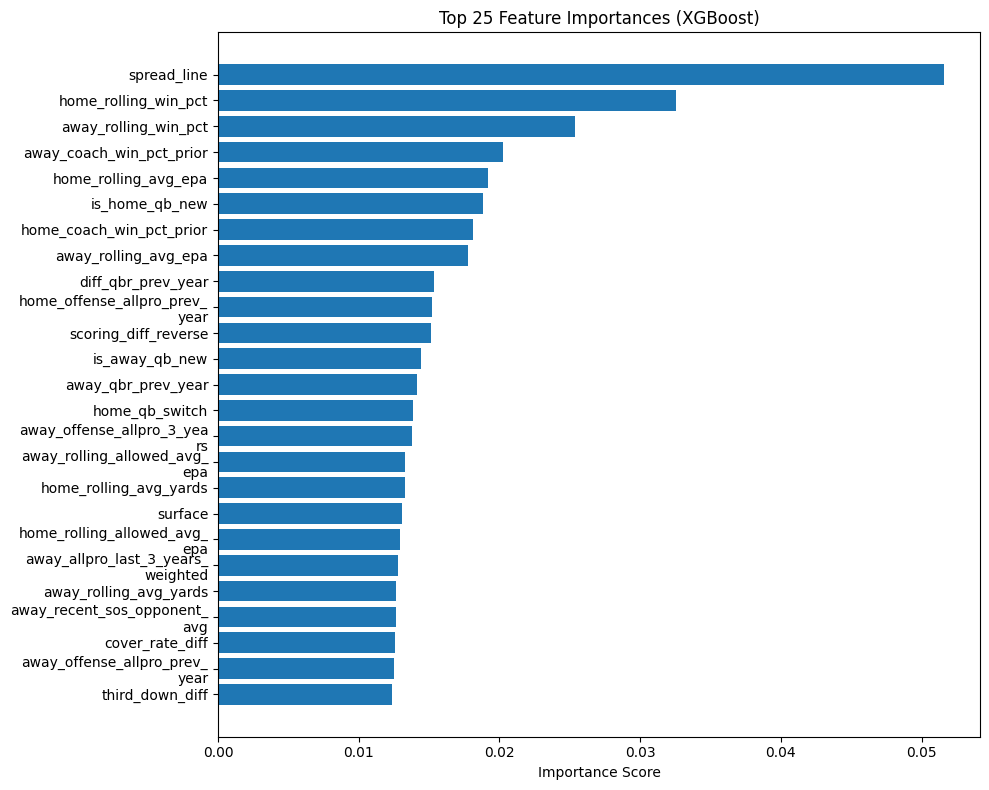

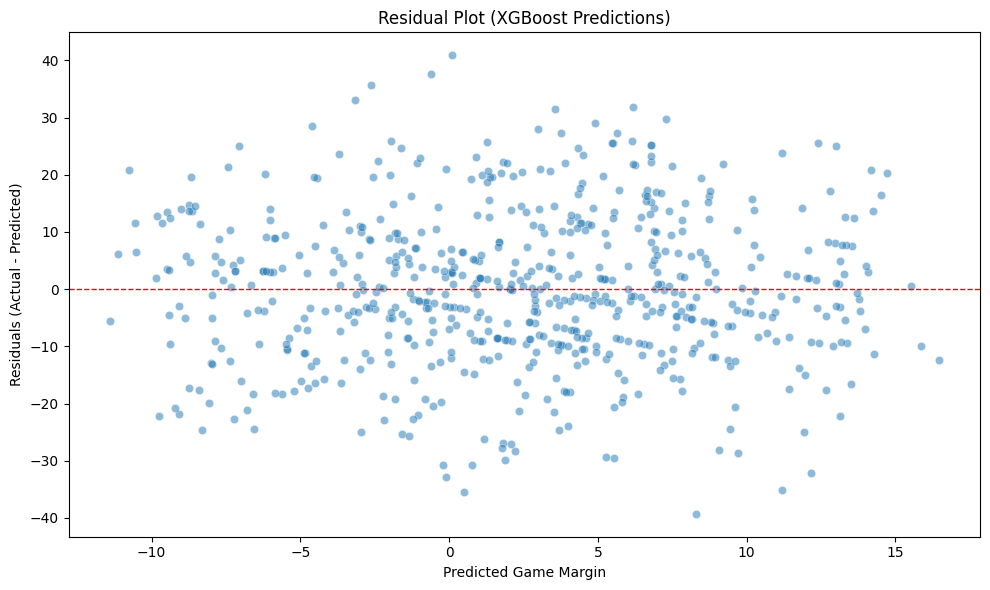

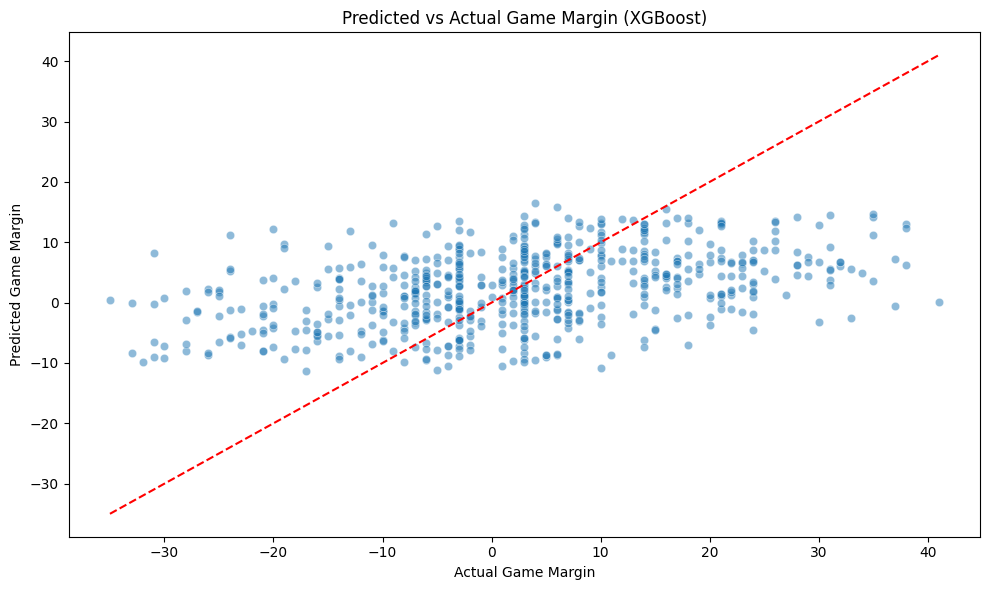

In [98]:
res2 = run_iteration2(features_df)
plot_feature_importances(res2, top_n=25)
plot_residuals(res2)
plot_pred_vs_actual(res2)


In [99]:
# After fitting your full Iteration 2 model
pipe = res2["pipeline"]
model = pipe.named_steps["regressor"]
pre = pipe.named_steps["preprocessor"]

# Get feature names
feature_names = _safe_feature_names_from_preprocessor(pre, res2["used_columns"])
importances = model.feature_importances_

# Sort & take top N
sorted_idx = np.argsort(importances)[::-1]
top_features = [feature_names[i] for i in sorted_idx[:25]]

print(top_features)  # now you can pass this into run_iteration2_reduced()


['spread_line', 'home_rolling_win_pct', 'away_rolling_win_pct', 'away_coach_win_pct_prior', 'home_rolling_avg_epa', 'is_home_qb_new', 'home_coach_win_pct_prior', 'away_rolling_avg_epa', 'diff_qbr_prev_year', 'home_offense_allpro_prev_year', 'scoring_diff_reverse', 'is_away_qb_new', 'away_qbr_prev_year', 'home_qb_switch', 'away_offense_allpro_3_years', 'away_rolling_allowed_avg_epa', 'home_rolling_avg_yards', 'surface', 'home_rolling_allowed_avg_epa', 'away_allpro_last_3_years_weighted', 'away_rolling_avg_yards', 'away_recent_sos_opponent_avg', 'cover_rate_diff', 'away_offense_allpro_prev_year', 'third_down_diff']


####XGB Reduced Model of Iteration 2

In [100]:
# Reduced Iteration 2 — Preparation
from __future__ import annotations
import pandas as pd
from dataclasses import dataclass, field
from typing import Dict, Any, List, Tuple, Optional, Sequence

from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OrdinalEncoder
from sklearn.pipeline import Pipeline
from xgboost import XGBRegressor


@dataclass(frozen=True)
class Iter2ReducedConfig:
    test_size: float = 0.2
    random_state: int = 42

    # categorical / boolean candidates (only those present will be used)
    categorical_cols: Tuple[str, ...] = ('roof','surface')
    boolean_cols: Tuple[str, ...] = (
        'is_playoff','is_final_week',
        'home_qb_switch','away_qb_switch',
        'is_home_qb_new','is_away_qb_new'
    )

    # XGBoost params (your tuned set)
    xgb_params: Dict[str, Any] = field(default_factory=lambda: dict(
        n_estimators=500,
        max_depth=3,
        learning_rate=0.01,
        min_child_weight=3,
        subsample=0.6,
        colsample_bytree=0.6,
        reg_alpha=1.0,
        reg_lambda=3.0,
        objective='reg:squarederror',
        random_state=42,
        verbosity=1,
        tree_method='hist',
        n_jobs=-1,
    ))


def _prepare_reduced_Xy(
    features_df: pd.DataFrame,
    top_features: Sequence[str],
    cfg: Iter2ReducedConfig
):
    """
    Build a reduced X, y using only the provided top_features list (plus safety checks).
    No mutation of features_df.
    """
    if 'game_margin' not in features_df.columns:
        raise ValueError("features_df must contain 'game_margin' as the target.")

    # Ensure unique, drop target if accidentally included
    top_features = [f for f in dict.fromkeys(top_features) if f != 'game_margin']

    # Intersect with available columns
    present = [f for f in top_features if f in features_df.columns]
    if len(present) == 0:
        raise ValueError("None of the provided top_features exist in features_df.")

    # Build reduced frame safely
    reduced_df = features_df[present + ['game_margin']].copy(deep=True)
    y = reduced_df['game_margin'].astype(float)
    X = reduced_df.drop(columns=['game_margin'])

    # Determine groups that actually exist
    cats = [c for c in cfg.categorical_cols if c in X.columns]
    bools = [c for c in cfg.boolean_cols if c in X.columns]
    nums  = [c for c in X.columns if c not in set(cats) | set(bools)]

    # Cast categoricals to string on the COPY only
    for c in cats:
        X[c] = X[c].astype(str)

    return X, y, cats, bools, nums, present


def _make_preprocessor_reduced(cats: List[str], bools: List[str], nums: List[str]) -> ColumnTransformer:
    return ColumnTransformer(
        transformers=[
            ('cat', OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1), cats),
            ('num', 'passthrough', nums + bools),
        ],
        remainder='drop',
        verbose_feature_names_out=False,
    )


def _make_pipeline_reduced(pre: ColumnTransformer, cfg: Iter2ReducedConfig) -> Pipeline:
    return Pipeline(steps=[
        ('preprocessor', pre),
        ('regressor', XGBRegressor(**cfg.xgb_params)),
    ])


In [101]:
# Reduced Iteration 2 — Isolated Run
from typing import Optional, Sequence
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, r2_score
import pandas as pd
import numpy as np

def run_iteration2_reduced(
    features_df: pd.DataFrame,
    top_features: Sequence[str],
    cfg: Optional[Iter2ReducedConfig] = None
):
    """
    Train/evaluate the reduced (Top-N features) model with zero side effects.
    """
    cfg = cfg or Iter2ReducedConfig()

    # Fresh reduced data
    X, y, cats, bools, nums, used_present = _prepare_reduced_Xy(features_df, top_features, cfg)

    # Split
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=cfg.test_size, random_state=cfg.random_state, shuffle=True
    )

    # Fresh pipeline
    pre = _make_preprocessor_reduced(cats, bools, nums)
    pipe = _make_pipeline_reduced(pre, cfg)

    # Fit & predict
    pipe.fit(X_train, y_train)
    y_pred = pipe.predict(X_test)

    # Metrics
    mae = mean_absolute_error(y_test, y_pred)
    r2  = r2_score(y_test, y_pred)

    print(f"Reduced Feature Model - MAE: {mae:.2f}")
    print(f"Reduced Feature Model - R²: {r2:.2f}")

    return {
        "mae": float(mae),
        "r2": float(r2),
        "y_test": y_test.reset_index(drop=True),
        "y_pred": pd.Series(y_pred),
        "pipeline": pipe,
        "used_columns": {"categorical": cats, "boolean": bools, "numeric": nums},
        "features_used_from_top_list": used_present,  # useful to see which of your top list were actually present
        "config": cfg,
    }


res2_reduced = run_iteration2_reduced(features_df, top_features)


Reduced Feature Model - MAE: 10.37
Reduced Feature Model - R²: 0.18


####Overfitting Check

In [102]:
# Overfitting checks
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, r2_score
import pandas as pd

def overfit_report_full(features_df: pd.DataFrame, res_full: dict):
    """
    Recreates the train split using the same cfg seed and computes
    train metrics using the fitted pipeline inside res_full.
    Uses test metrics from res_full directly.
    """
    cfg = res_full["config"]
    # Rebuild X, y exactly like Iteration 2 did
    X, y, cats, bools, nums = _prepare_Xy_iter2(features_df, cfg)

    # Same split as during the run
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=cfg.test_size, random_state=cfg.random_state, shuffle=True
    )

    pipe = res_full["pipeline"]

    # Train metrics
    y_train_pred = pipe.predict(X_train)
    train_mae = mean_absolute_error(y_train, y_train_pred)
    train_r2  = r2_score(y_train, y_train_pred)

    # Test metrics from results dict (no recompute needed)
    test_mae = res_full["mae"]
    test_r2  = res_full["r2"]

    print("Full Feature Model (Iteration 2) — Overfitting Check")
    print(f"Train MAE: {train_mae:.2f} | Test MAE: {test_mae:.2f}")
    print(f"Train R²:  {train_r2:.2f} | Test R²:  {test_r2:.2f}")


def overfit_report_reduced(features_df: pd.DataFrame, res_reduced: dict):
    """
    Recreates the reduced train split (using the same top-features list the run used)
    and computes train metrics using the fitted reduced pipeline.
    """
    cfg = res_reduced["config"]
    # Use the exact features that were actually present/used in the run
    top_feats_used = res_reduced.get("features_used_from_top_list", [])
    X, y, cats, bools, nums, _present = _prepare_reduced_Xy(features_df, top_feats_used, cfg)

    # Same split as during the run
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=cfg.test_size, random_state=cfg.random_state, shuffle=True
    )

    pipe = res_reduced["pipeline"]

    # Train metrics
    y_train_pred = pipe.predict(X_train)
    train_mae = mean_absolute_error(y_train, y_train_pred)
    train_r2  = r2_score(y_train, y_train_pred)

    # Test metrics from results dict
    test_mae = res_reduced["mae"]
    test_r2  = res_reduced["r2"]

    print("\nReduced Feature Model — Overfitting Check")
    print(f"Train MAE: {train_mae:.2f} | Test MAE: {test_mae:.2f}")
    print(f"Train R²:  {train_r2:.2f} | Test R²:  {test_r2:.2f}")

# Usage:
overfit_report_full(features_df, res2)
overfit_report_reduced(features_df, res2_reduced)


Full Feature Model (Iteration 2) — Overfitting Check
Train MAE: 9.35 | Test MAE: 10.43
Train R²:  0.31 | Test R²:  0.18

Reduced Feature Model — Overfitting Check
Train MAE: 9.51 | Test MAE: 10.37
Train R²:  0.29 | Test R²:  0.18


####Spread/Margin for trimmed model

Season Spread Summary with Home/Away Spread Averages and Largest Spread Game:


,season,avg_abs_spread,avg_negative_spread,avg_positive_spread,min_spread,max_spread,week,home_team,away_team,spread_line,game_margin
0,2009,6.674468,-5.859756,7.111111,-15.5,17.0,10,MIN,DET,17.0,17.0
1,2010,5.063830,-4.120000,5.506250,-13.0,14.5,4,GB,DET,14.5,2.0
2,2011,5.691489,-4.604938,6.262987,-13.5,20.5,13,NE,IND,20.5,7.0
3,2012,5.078723,-3.807229,5.773026,-14.0,17.0,17,DEN,KC,17.0,35.0
4,2013,5.342553,-3.964286,6.150000,-16.0,27.0,6,DEN,JAX,27.0,16.0
5,2014,5.429787,-4.590909,5.838608,-13.0,16.5,17,DEN,OAK,16.5,33.0
6,2015,4.985106,-4.089744,5.429936,-13.0,16.5,3,SEA,CHI,16.5,26.0
7,2016,4.708511,-3.897260,5.105590,-11.5,17.0,16,NE,NYJ,17.0,38.0
8,2017,5.351695,-4.193548,6.235714,-11.0,17.0,12,NE,MIA,17.0,18.0
9,2018,5.491489,-4.593750,5.954839,-14.5,17.0,14,LAC,CIN,17.0,5.0


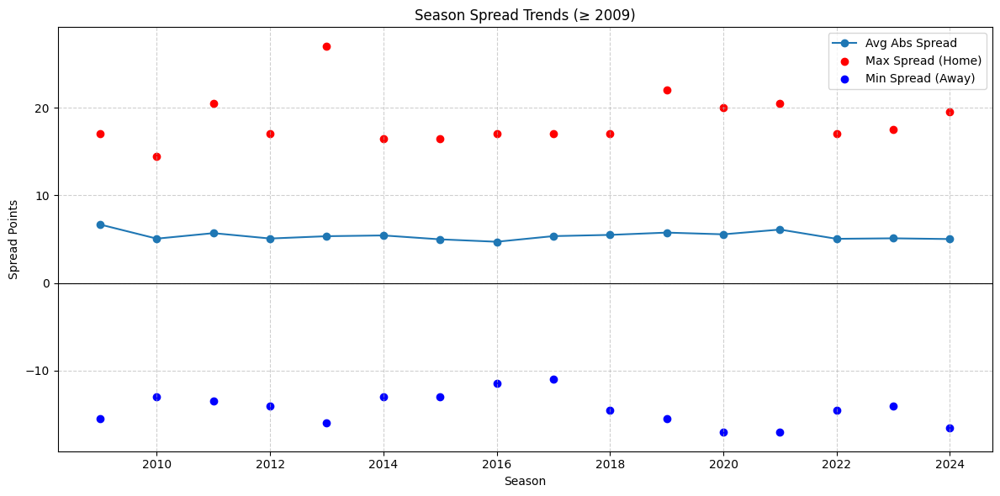

In [103]:
import pandas as pd
import matplotlib.pyplot as plt

# Spread Evaluation
def spread_line_summary_chart(match_df: pd.DataFrame, start_season: int = 2009):
    """
    Creates a season-wise table of spread stats + largest spread game,
    and plots average absolute spread by season.
    """
    # Filter to target seasons
    df_filtered = match_df[match_df['season'] >= start_season].copy()

    # Compute absolute spread
    df_filtered['abs_spread'] = df_filtered['spread_line'].abs()

    # Get largest spread game per season
    largest_spreads_by_season = (
        df_filtered.loc[df_filtered.groupby('season')['abs_spread'].idxmax()]
        .sort_values('season')
    )[['season', 'week', 'home_team', 'away_team', 'spread_line', 'game_margin']]

    # Aggregate stats per season
    season_spread_summary = df_filtered.groupby('season').agg(
        avg_abs_spread=('abs_spread', 'mean'),
        avg_negative_spread=('spread_line', lambda x: x[x < 0].mean()),  # Home favorite
        avg_positive_spread=('spread_line', lambda x: x[x > 0].mean()),  # Away favorite
        min_spread=('spread_line', 'min'),
        max_spread=('spread_line', 'max')
    ).reset_index()

    # Merge largest spread game
    season_combined = pd.merge(season_spread_summary, largest_spreads_by_season, on='season')

    # Table Output
    print("Season Spread Summary with Home/Away Spread Averages and Largest Spread Game:")
    display(season_combined)  # Works in Jupyter/Colab; replace with print() if needed

    # Chart
    plt.figure(figsize=(12, 6))
    plt.plot(season_combined['season'], season_combined['avg_abs_spread'], marker='o', label='Avg Abs Spread')
    plt.scatter(season_combined['season'], season_combined['max_spread'], color='red', label='Max Spread (Home)')
    plt.scatter(season_combined['season'], season_combined['min_spread'], color='blue', label='Min Spread (Away)')
    plt.axhline(0, color='black', linewidth=0.8)
    plt.title(f"Season Spread Trends (≥ {start_season})")
    plt.xlabel("Season")
    plt.ylabel("Spread Points")
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.show()

    return season_combined


season_spread_table = spread_line_summary_chart(match_df, start_season=2009)


In [104]:
import pandas as pd

# Ensure match_df is already loaded and filtered as needed
df_filtered = match_df[match_df['season'] >= 2009].copy()

# Define Spread Bins based on number of scores (8 points per score assumption)
bins = [-28, -16, -8,0, 8, 16, 28]
labels = ['3 Scores (Away)', '2 Scores (Away)', '1 Score (Away)',
          '1 Score (Home)', '2 Scores (Home)', '3 Scores (Home)']


# Bin the spread lines
df_filtered['score_bin'] = pd.cut(df_filtered['spread_line'], bins=bins, labels=labels, right=False)

# Count of games per spread bin
bin_counts = df_filtered['score_bin'].value_counts().reset_index()
bin_counts.columns = ['score_bin', 'count']

# Display result
print("Spread Bins Count (by Scores):")
print(bin_counts)


Spread Bins Count (by Scores):
         score_bin  count
0   1 Score (Home)   1850
1   1 Score (Away)   1231
2  2 Scores (Home)    560
3  2 Scores (Away)    148
4  3 Scores (Home)     42
5  3 Scores (Away)      3


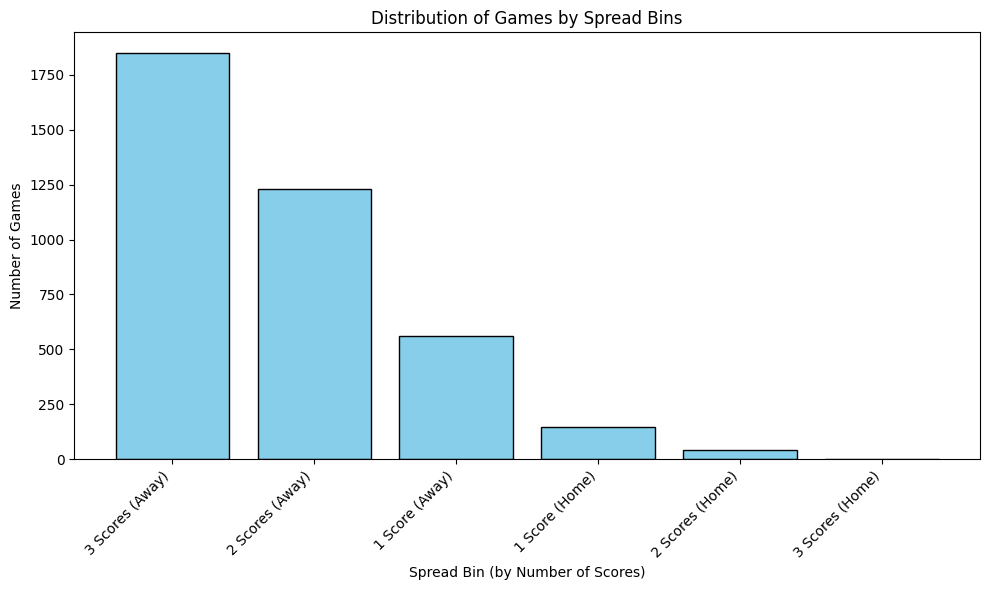

In [105]:
import matplotlib.pyplot as plt

# Updated Spread Bins Data
score_bins = ['3 Scores (Away)', '2 Scores (Away)', '1 Score (Away)',
          '1 Score (Home)', '2 Scores (Home)', '3 Scores (Home)']

counts = [1850, 1231, 560, 148, 42, 3]

# Plot Histogram
plt.figure(figsize=(10,6))
plt.bar(score_bins, counts, color='skyblue', edgecolor='black')
plt.title('Distribution of Games by Spread Bins')
plt.xlabel('Spread Bin (by Number of Scores)')
plt.ylabel('Number of Games')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


In [106]:
import pandas as pd

# Ensure match_df is already loaded and filtered as needed
df_filtered = match_df[match_df['season'] >= 2009].copy()

# Define Game Margin Bins based on number of scores (8 points per score assumption)
bins = [-100, -16, -8,0, 8, 16, 100]
labels = ['3 Scores (Away)', '2 Scores (Away)', '1 Score (Away)',
          '1 Score (Home)', '2 Scores (Home)', '3 Scores (Home)']

# Bin the actual game margins
df_filtered['margin_bin'] = pd.cut(df_filtered['game_margin'], bins=bins, labels=labels, right=False)

# Count of games per margin bin
margin_bin_counts = df_filtered['margin_bin'].value_counts().reset_index()
margin_bin_counts.columns = ['margin_bin', 'count']

# Display result
print("Game Margin Bins Count (by Scores):")
print(margin_bin_counts)


Game Margin Bins Count (by Scores):
        margin_bin  count
0   1 Score (Home)    931
1   1 Score (Away)    930
2  3 Scores (Home)    683
3  2 Scores (Home)    532
4  3 Scores (Away)    394
5  2 Scores (Away)    364


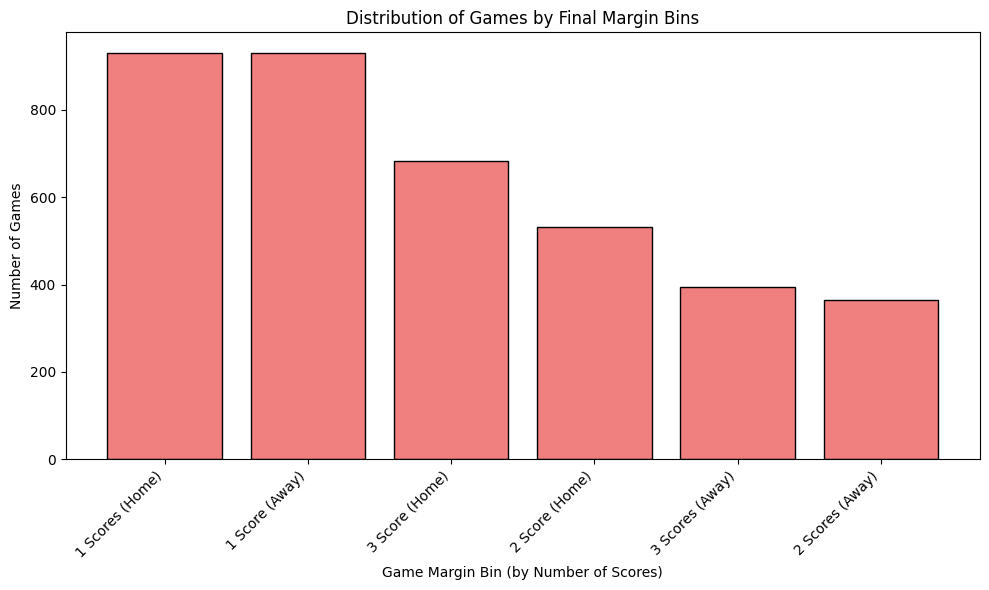

In [107]:
import matplotlib.pyplot as plt

# Data from your counts
margin_bins = ['1 Scores (Home)', '1 Score (Away)', '3 Score (Home)',
          '2 Score (Home)', '3 Scores (Away)', '2 Scores (Away)']

counts = [931, 930, 683, 532, 394, 364]

# Plot Histogram
plt.figure(figsize=(10,6))
plt.bar(margin_bins, counts, color='lightcoral', edgecolor='black')
plt.title('Distribution of Games by Final Margin Bins')
plt.xlabel('Game Margin Bin (by Number of Scores)')
plt.ylabel('Number of Games')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


#### XGB Trimmed Models

In [108]:
# Trimmed-evaluation helpers for Iteration 2 (full + reduced)
import numpy as np
from sklearn.metrics import mean_absolute_error, r2_score

def evaluate_trimmed_results(results: dict, lower_cap: float = -17, upper_cap: float = 27, label: str = "Trimmed"):
    """
    Evaluates MAE/R² after clipping predictions to [lower_cap, upper_cap].
    Does NOT refit the model; uses y_test/y_pred from the results dict.
    """
    y_test = results["y_test"]
    y_pred = results["y_pred"]

    y_pred_trimmed = np.clip(y_pred, lower_cap, upper_cap)

    mae = mean_absolute_error(y_test, y_pred_trimmed)
    r2  = r2_score(y_test, y_pred_trimmed)

    print(f"{label} Model MAE: {mae:.2f}")
    print(f"{label} Model R²: {r2:.2f}")

    # return a lightweight package (doesn't modify the original results)
    return {
        "mae_trimmed": float(mae),
        "r2_trimmed": float(r2),
        "y_pred_trimmed": y_pred_trimmed,
        "caps": (lower_cap, upper_cap),
    }


# Full Iteration 2 (res2)
trimmed_full = evaluate_trimmed_results(res2, lower_cap=-17, upper_cap=27, label="Iteration 2 (Full) Trimmed")

# Reduced Iteration 2 (res2_reduced)
trimmed_reduced = evaluate_trimmed_results(res2_reduced, lower_cap=-17, upper_cap=27, label="Iteration 2 (Reduced) Trimmed")


Iteration 2 (Full) Trimmed Model MAE: 10.43
Iteration 2 (Full) Trimmed Model R²: 0.18
Iteration 2 (Reduced) Trimmed Model MAE: 10.37
Iteration 2 (Reduced) Trimmed Model R²: 0.18


#### Do not run again GridSearchCV 2 with new features

In [ ]:
from xgboost import XGBRegressor
from sklearn.model_selection import RandomizedSearchCV
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OrdinalEncoder
from sklearn.metrics import mean_absolute_error, r2_score
import numpy as np

# --- Define Parameter Distributions (Wide Net) ---
param_distributions = {
    'regressor__n_estimators': [300, 500],
    'regressor__max_depth': [3, 5, 7],
    'regressor__learning_rate': [0.01, 0.03],
    'regressor__min_child_weight': [1, 3, 5],
    'regressor__subsample': [0.6, 0.8, 1.0],
    'regressor__colsample_bytree': [0.6, 0.8, 1.0],
    'regressor__reg_alpha': [0, 1, 5],
    'regressor__reg_lambda': [1, 3, 5],
    'regressor__gamma': [0, 1]
}

# --- Pipeline Definition (Use your preprocessor & data splits) ---
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor_iter2),
    ('regressor', XGBRegressor(
        objective='reg:squarederror',
        random_state=42,
        verbosity=1
    ))
])

# --- RandomizedSearchCV ---
random_search = RandomizedSearchCV(
    estimator=pipeline,
    param_distributions=param_distributions,
    n_iter=150,  # Adjust based on how much time you have
    scoring='neg_mean_absolute_error',
    cv=3,
    verbose=2,
    n_jobs=-1,
    random_state=42
)

# --- Run Randomized Search ---
random_search.fit(X_train_iter2, y_train_iter2)

# --- Best Params & Evaluation ---
print("Best Parameters Found:")
print(random_search.best_params_)
print(f"Best CV MAE: {-random_search.best_score_:.4f}")

# --- Evaluate on Test Data ---
best_model = random_search.best_estimator_
y_pred_test = best_model.predict(X_test_iter2)
mae_test = mean_absolute_error(y_test_iter2, y_pred_test)
r2_test = r2_score(y_test_iter2, y_pred_test)

print(f"Test MAE: {mae_test:.2f}")
print(f"Test R²: {r2_test:.2f}")


Fitting 3 folds for each of 150 candidates, totalling 450 fits
Best Parameters Found:
{'regressor__subsample': 0.6, 'regressor__reg_lambda': 5, 'regressor__reg_alpha': 1, 'regressor__n_estimators': 300, 'regressor__min_child_weight': 5, 'regressor__max_depth': 3, 'regressor__learning_rate': 0.01, 'regressor__gamma': 0, 'regressor__colsample_bytree': 1.0}
Best CV MAE: 10.3513
Test MAE: 10.17
Test R²: 0.20


In [ ]:
from xgboost import XGBRegressor
from sklearn.model_selection import RandomizedSearchCV
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OrdinalEncoder
from sklearn.metrics import mean_absolute_error, r2_score
import numpy as np

# --- Define Parameter Distributions (Wide Net) ---
param_distributions = {
    'regressor__n_estimators': [300, 500],
    'regressor__max_depth': [3, 5, 7],
    'regressor__learning_rate': [0.01, 0.03],
    'regressor__min_child_weight': [1, 3, 5],
    'regressor__subsample': [0.6, 0.8, 1.0],
    'regressor__colsample_bytree': [0.6, 0.8, 1.0],
    'regressor__reg_alpha': [0, 1, 5],
    'regressor__reg_lambda': [1, 3, 5],
    'regressor__gamma': [0, 1]
}

# --- Pipeline Definition (Use your preprocessor & data splits) ---
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor_top25),
    ('regressor', XGBRegressor(
        objective='reg:squarederror',
        random_state=42,
        verbosity=1
    ))
])

# --- RandomizedSearchCV ---
random_search = RandomizedSearchCV(
    estimator=pipeline,
    param_distributions=param_distributions,
    n_iter=150,  # Adjust based on how much time you have
    scoring='neg_mean_absolute_error',
    cv=3,
    verbose=2,
    n_jobs=-1,
    random_state=42
)

# --- Run Randomized Search ---
random_search.fit(X_train_top25, y_train_top25)

# --- Best Params & Evaluation ---
print("Best Parameters Found:")
print(random_search.best_params_)
print(f"Best CV MAE: {-random_search.best_score_:.4f}")

# --- Evaluate on Test Data ---
best_model = random_search.best_estimator_
y_pred_test = best_model.predict(X_test_top25)
mae_test = mean_absolute_error(y_test_top25, y_pred_test)
r2_test = r2_score(y_test_top25, y_pred_test)

print(f"Test MAE: {mae_test:.2f}")
print(f"Test R²: {r2_test:.2f}")


Fitting 3 folds for each of 150 candidates, totalling 450 fits
Best Parameters Found:
{'regressor__subsample': 0.6, 'regressor__reg_lambda': 1, 'regressor__reg_alpha': 5, 'regressor__n_estimators': 300, 'regressor__min_child_weight': 3, 'regressor__max_depth': 3, 'regressor__learning_rate': 0.01, 'regressor__gamma': 1, 'regressor__colsample_bytree': 0.8}
Best CV MAE: 10.3383
Test MAE: 10.19
Test R²: 0.20


In [ ]:
param_grid_focused = {
    'regressor__n_estimators': [300, 400],
    'regressor__max_depth': [3, 4],  # Only around 3 (best)
    'regressor__learning_rate': [0.01],  # Fixed at best
    'regressor__min_child_weight': [5, 6],  # Slightly around best
    'regressor__subsample': [0.6, 0.7],  # Expand a bit around 0.6
    'regressor__colsample_bytree': [0.9, 1.0],  # Narrow around 1.0
    'regressor__reg_alpha': [1],  # Fixed if not sensitive
    'regressor__reg_lambda': [4, 5, 6],  # Slightly around 5
    'regressor__gamma': [0]  # Fixed at best if not sensitive
}


In [ ]:
def run_gridsearch_pipeline(X_train, y_train, param_grid_focused, preprocessor):
    pipeline = Pipeline(steps=[
        ('preprocessor', preprocessor),
        ('regressor', XGBRegressor(objective='reg:squarederror', random_state=42))
    ])

    grid_search = GridSearchCV(
        pipeline,
        param_grid_focused,
        cv=3,
        scoring='neg_mean_absolute_error',
        n_jobs=-1,
        verbose=2
    )

    grid_search.fit(X_train, y_train)
    print("Best Params:", grid_search.best_params_)
    print(f"Best CV MAE: {-grid_search.best_score_:.4f}")

    return grid_search.best_estimator_, grid_search.best_score_


In [ ]:
#grid search
best_model_iter2, cv_mae_iter2 = run_gridsearch_pipeline(X_train_iter2, y_train_iter2, param_grid_focused, preprocessor_iter2)


Fitting 3 folds for each of 96 candidates, totalling 288 fits
Best Params: {'regressor__colsample_bytree': 1.0, 'regressor__gamma': 0, 'regressor__learning_rate': 0.01, 'regressor__max_depth': 3, 'regressor__min_child_weight': 5, 'regressor__n_estimators': 300, 'regressor__reg_alpha': 1, 'regressor__reg_lambda': 5, 'regressor__subsample': 0.6}
Best CV MAE: 10.3513


In [ ]:
# Predictions on Train
y_pred_train_iter2 = best_model_iter2.predict(X_train_iter2)

# Predictions on Test
y_pred_test_iter2 = best_model_iter2.predict(X_test_iter2)

# Evaluate
train_mae_iter2 = mean_absolute_error(y_train_iter2, y_pred_train_iter2)
test_mae_iter2 = mean_absolute_error(y_test_iter2, y_pred_test_iter2)
train_r2_iter2 = r2_score(y_train_iter2, y_pred_train_iter2)
test_r2_iter2 = r2_score(y_test_iter2, y_pred_test_iter2)

# Report
print(f"Train MAE: {train_mae_iter2:.2f} | Test MAE: {test_mae_iter2:.2f} | CV MAE: {cv_mae_iter2:.2f}")
print(f"Train R²: {train_r2_iter2:.2f} | Test R²: {test_r2_iter2:.2f}")


Train MAE: 9.86 | Test MAE: 10.17 | CV MAE: -10.35
Train R²: 0.25 | Test R²: 0.20


In [ ]:
param_grid_top25_focused = {
    'regressor__n_estimators': [300, 400],
    'regressor__max_depth': [3, 4],
    'regressor__learning_rate': [0.01],
    'regressor__min_child_weight': [3, 4],
    'regressor__subsample': [0.6, 0.7],
    'regressor__colsample_bytree': [0.8, 0.9],
    'regressor__reg_alpha': [4, 5, 6],
    'regressor__reg_lambda': [0.8, 1, 1.2],
    'regressor__gamma': [0.8, 1, 1.2]
}


In [ ]:
# Reuse the same function structure, just pass in top25 components
best_model_top25, cv_mae_top25 = run_gridsearch_pipeline(X_train_top25, y_train_top25, param_grid_top25_focused, preprocessor_top25)


Fitting 3 folds for each of 864 candidates, totalling 2592 fits
Best Params: {'regressor__colsample_bytree': 0.8, 'regressor__gamma': 0.8, 'regressor__learning_rate': 0.01, 'regressor__max_depth': 3, 'regressor__min_child_weight': 3, 'regressor__n_estimators': 300, 'regressor__reg_alpha': 6, 'regressor__reg_lambda': 0.8, 'regressor__subsample': 0.6}
Best CV MAE: 10.3374


In [ ]:
# Predictions
y_pred_train_top25 = best_model_top25.predict(X_train_top25)
y_pred_test_top25 = best_model_top25.predict(X_test_top25)

# MAE & R²
train_mae_top25 = mean_absolute_error(y_train_top25, y_pred_train_top25)
test_mae_top25 = mean_absolute_error(y_test_top25, y_pred_test_top25)
train_r2_top25 = r2_score(y_train_top25, y_pred_train_top25)
test_r2_top25 = r2_score(y_test_top25, y_pred_test_top25)

# Report
print(f"Top 25 Model - Train MAE: {train_mae_top25:.2f} | Test MAE: {test_mae_top25:.2f} | CV MAE: {cv_mae_top25:.2f}")
print(f"Top 25 Model - Train R²: {train_r2_top25:.2f} | Test R²: {test_r2_top25:.2f}")


Top 25 Model - Train MAE: 9.91 | Test MAE: 10.19 | CV MAE: -10.34
Top 25 Model - Train R²: 0.24 | Test R²: 0.20


####XGB Betting Evaluation

In [109]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split

def evaluate_xgb_vs_spread(results: dict, features_df: pd.DataFrame, game_id_col="game_id", spread_col="spread_line"):
    """
    Evaluates a fitted model's predictions vs the spread using the same test split from run_iteration2 / reduced.
    Builds xgb_eval_df automatically.
    """
    cfg = results["config"]

    # Recreate same split mask for alignment
    idx = np.arange(len(features_df))
    _, test_idx = train_test_split(idx, test_size=cfg.test_size, random_state=cfg.random_state, shuffle=True)
    test_df = features_df.iloc[test_idx].reset_index(drop=True)

    # Build eval df
    xgb_eval_df = pd.DataFrame({
        game_id_col: test_df[game_id_col].values if game_id_col in test_df.columns else np.arange(len(test_df)),
        "game_margin": results["y_test"].values,
        spread_col: test_df[spread_col].values,
        "model_prediction": results["y_pred"].values
    })

    # Differences & errors
    xgb_eval_df["model_vs_spread_diff"] = (xgb_eval_df["model_prediction"] - xgb_eval_df[spread_col]).abs()
    xgb_eval_df["model_error"] = (xgb_eval_df["game_margin"] - xgb_eval_df["model_prediction"]).abs()
    xgb_eval_df["spread_error"] = (xgb_eval_df["game_margin"] - xgb_eval_df[spread_col]).abs()
    xgb_eval_df["model_vs_spread"] = xgb_eval_df["model_error"] < xgb_eval_df["spread_error"]

    # Overall hit rate
    winning_percentage = xgb_eval_df["model_vs_spread"].mean()
    print(f"Model beat spread in {winning_percentage*100:.2f}% of all games")

    # True bets ≥ 1 point edge
    true_bets_df = xgb_eval_df[xgb_eval_df["model_vs_spread_diff"] >= 1].copy()
    true_bet_win_percentage = true_bets_df["model_vs_spread"].mean()
    print(f"True Bets (>=1pt diff): {true_bet_win_percentage*100:.2f}% | Bets Placed: {len(true_bets_df)}")

    # Threshold sweep
    thresholds = [1, 2, 3, 4, 5]
    rows = []
    for t in thresholds:
        bets = xgb_eval_df[xgb_eval_df["model_vs_spread_diff"] >= t]
        hit_rate = bets["model_vs_spread"].mean() if not bets.empty else np.nan
        rows.append({
            "Threshold": t,
            "Hit Rate": hit_rate,
            "Bets Placed": len(bets)
        })
        print(f"Threshold: {t} pts | Hit Rate: {0.0 if np.isnan(hit_rate) else hit_rate*100:.2f}% | Bets Placed: {len(bets)}")

    xgb_eval_summary = pd.DataFrame(rows)
    return xgb_eval_df, xgb_eval_summary


xgb_eval_df_full, xgb_eval_summary_full = evaluate_xgb_vs_spread(res2, features_df)
xgb_eval_df_reduced, xgb_eval_summary_reduced = evaluate_xgb_vs_spread(res2_reduced, features_df)


Model beat spread in 47.72% of all games
True Bets (>=1pt diff): 47.07% | Bets Placed: 376
Threshold: 1 pts | Hit Rate: 47.07% | Bets Placed: 376
Threshold: 2 pts | Hit Rate: 47.34% | Bets Placed: 169
Threshold: 3 pts | Hit Rate: 45.45% | Bets Placed: 66
Threshold: 4 pts | Hit Rate: 51.72% | Bets Placed: 29
Threshold: 5 pts | Hit Rate: 57.14% | Bets Placed: 14
Model beat spread in 48.19% of all games
True Bets (>=1pt diff): 50.55% | Bets Placed: 366
Threshold: 1 pts | Hit Rate: 50.55% | Bets Placed: 366
Threshold: 2 pts | Hit Rate: 47.51% | Bets Placed: 181
Threshold: 3 pts | Hit Rate: 49.18% | Bets Placed: 61
Threshold: 4 pts | Hit Rate: 44.44% | Bets Placed: 27
Threshold: 5 pts | Hit Rate: 66.67% | Bets Placed: 15


####Weighted ATS Focus XGBoost

In [110]:
#  ATS-weighted Iteration 2
from __future__ import annotations
import numpy as np
import pandas as pd
from dataclasses import dataclass, field
from typing import Dict, Any, List, Tuple, Optional

from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OrdinalEncoder
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split, KFold, cross_val_predict
from sklearn.metrics import mean_absolute_error, r2_score
from xgboost import XGBRegressor


@dataclass(frozen=True)
class Iter2WeightedConfig:
    test_size: float = 0.2
    random_state: int = 42
    oof_splits: int = 5
    weight_win: float = 2.0
    weight_loss: float = 1.0

    drop_non_features: Tuple[str, ...] = ('game_id','home_team','away_team','season','week')
    categorical_cols: Tuple[str, ...] = ('roof','surface')
    boolean_cols: Tuple[str, ...] = (
        'is_playoff','is_final_week','home_qb_switch','away_qb_switch','is_home_qb_new','is_away_qb_new'
    )

    xgb_params: Dict[str, Any] = field(default_factory=lambda: dict(
        n_estimators=500,
        max_depth=3,
        learning_rate=0.01,
        min_child_weight=3,
        subsample=0.6,
        colsample_bytree=0.6,
        reg_alpha=1.0,
        reg_lambda=3.0,
        objective='reg:squarederror',
        random_state=42,
        verbosity=1,
        tree_method='hist',
        n_jobs=-1,
    ))


def _prepare_Xy_iter2_weighted(features_df: pd.DataFrame, cfg: Iter2WeightedConfig):
    if 'game_margin' not in features_df.columns:
        raise ValueError("features_df must contain 'game_margin'.")

    y = features_df['game_margin'].astype(float)
    X = features_df.drop(columns=['game_margin'], errors='ignore')
    X = X.drop(columns=list(cfg.drop_non_features), errors='ignore').copy(deep=True)

    cats = [c for c in cfg.categorical_cols if c in X.columns]
    bools = [c for c in cfg.boolean_cols if c in X.columns]
    nums  = [c for c in X.columns if c not in set(cats) | set(bools)]

    for c in cats:
        X[c] = X[c].astype(str)

    return X, y, cats, bools, nums


def _make_preprocessor_iter2_weighted(cats: List[str], bools: List[str], nums: List[str]) -> ColumnTransformer:
    return ColumnTransformer(
        transformers=[
            ('cat', OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1), cats),
            ('num', 'passthrough', nums + bools),
        ],
        remainder='drop',
        verbose_feature_names_out=False,
    )


def _make_pipeline_iter2_weighted(pre: ColumnTransformer, cfg: Iter2WeightedConfig) -> Pipeline:
    return Pipeline(steps=[
        ('preprocessor', pre),
        ('regressor', XGBRegressor(**cfg.xgb_params)),
    ])


In [111]:
# ATS-weighted Iteration 2 — Isolated Run
def run_iteration2_weighted(features_df: pd.DataFrame, cfg: Optional[Iter2WeightedConfig] = None):
    """
    1) Split into train/test (stateless).
    2) On the TRAIN fold: get OOF predictions via KFold (no leakage).
    3) Compute sample weights: win=cfg.weight_win if model closer than spread, else loss weight.
    4) Refit on full TRAIN with weights; evaluate on TEST.
    """
    cfg = cfg or Iter2WeightedConfig()

    # Fresh features/target
    X, y, cats, bools, nums = _prepare_Xy_iter2_weighted(features_df, cfg)

    # Split
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=cfg.test_size, random_state=cfg.random_state, shuffle=True
    )

    # Build base pipeline for OOF predictions (same params)
    pre = _make_preprocessor_iter2_weighted(cats, bools, nums)
    base_pipe = _make_pipeline_iter2_weighted(pre, cfg)

    # OOF predictions on TRAIN only
    kf = KFold(n_splits=cfg.oof_splits, shuffle=True, random_state=cfg.random_state)
    # cross_val_predict clones the estimator internally; no leakage
    y_train_oof = cross_val_predict(base_pipe, X_train, y_train, cv=kf, n_jobs=-1, method='predict')

    # Compute ATS outcome on TRAIN using OOF preds
    # Need the spread_line aligned to the train indices
    if 'spread_line' not in features_df.columns:
        raise ValueError("features_df must include 'spread_line' to compute ATS weights.")

    # Align spread_line for TRAIN
    _, test_idx = train_test_split(np.arange(len(features_df)), test_size=cfg.test_size,
                                   random_state=cfg.random_state, shuffle=True)
    train_idx = np.setdiff1d(np.arange(len(features_df)), test_idx, assume_unique=True)
    spread_train = features_df.iloc[train_idx]['spread_line'].reset_index(drop=True).astype(float)

    actual_edge_train = y_train.reset_index(drop=True) - spread_train
    model_edge_train  = pd.Series(y_train_oof) - spread_train

    model_won_ats_oof = (np.sign(model_edge_train) == np.sign(actual_edge_train)) & (actual_edge_train != 0)
    sample_weights = np.where(model_won_ats_oof, cfg.weight_win, cfg.weight_loss)

    # Now fit a fresh pipeline on the full TRAIN with weights
    final_pipe = _make_pipeline_iter2_weighted(pre, cfg)
    final_pipe.fit(X_train, y_train, regressor__sample_weight=sample_weights)

    # Predict on TEST
    y_pred = final_pipe.predict(X_test)

    # Metrics
    mae = mean_absolute_error(y_test, y_pred)
    r2  = r2_score(y_test, y_pred)

    print(f"Iteration 2 (ATS-weighted) - MAE: {mae:.2f}")
    print(f"Iteration 2 (ATS-weighted) - R²: {r2:.2f}")

    return {
        "mae": float(mae),
        "r2": float(r2),
        "y_test": y_test.reset_index(drop=True),
        "y_pred": pd.Series(y_pred),
        "pipeline": final_pipe,
        "used_columns": {"categorical": cats, "boolean": bools, "numeric": nums},
        "config": cfg,
        "train_sample_weights_summary": {
            "n_train": int(len(y_train)),
            "win_weight": float(cfg.weight_win),
            "loss_weight": float(cfg.weight_loss),
            "pct_weighted_as_win": float(model_won_ats_oof.mean()),
        }
    }


res2_weighted = run_iteration2_weighted(features_df)
xgb_eval_df_full, xgb_eval_summary_full = evaluate_xgb_vs_spread(res2_weighted, features_df)


Iteration 2 (ATS-weighted) - MAE: 10.46
Iteration 2 (ATS-weighted) - R²: 0.18
Model beat spread in 47.25% of all games
True Bets (>=1pt diff): 46.34% | Bets Placed: 423
Threshold: 1 pts | Hit Rate: 46.34% | Bets Placed: 423
Threshold: 2 pts | Hit Rate: 49.38% | Bets Placed: 241
Threshold: 3 pts | Hit Rate: 45.69% | Bets Placed: 116
Threshold: 4 pts | Hit Rate: 58.54% | Bets Placed: 41
Threshold: 5 pts | Hit Rate: 57.14% | Bets Placed: 14


#### Do not run again - Gridsearch for Weighted XGB Model

In [116]:
# ATS-weighted — RandomizedSearch prep
from __future__ import annotations
import numpy as np
import pandas as pd
from dataclasses import dataclass, field
from typing import Dict, Any, List, Tuple, Optional

from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OrdinalEncoder
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split, KFold, cross_val_predict, RandomizedSearchCV
from sklearn.metrics import mean_absolute_error, r2_score
from xgboost import XGBRegressor
from scipy.stats import randint, uniform


@dataclass(frozen=True)
class Iter2WeightedRandCfg:
    # data / CV
    test_size: float = 0.2
    random_state: int = 42
    oof_splits: int = 5
    cv_splits: int = 5
    n_iter_random: int = 40  # how many random candidates to try

    # ATS weighting
    weight_win: float = 2.0
    weight_loss: float = 1.0

    # columns
    drop_non_features: Tuple[str, ...] = ('game_id','home_team','away_team','season','week')
    categorical_cols: Tuple[str, ...] = ('roof','surface')
    boolean_cols: Tuple[str, ...] = (
        'is_playoff','is_final_week','home_qb_switch','away_qb_switch','is_home_qb_new','is_away_qb_new'
    )

    # baseline params (used only to generate OOF weights)
    base_xgb_params: Dict[str, Any] = field(default_factory=lambda: dict(
        n_estimators=500,
        max_depth=3,
        learning_rate=0.01,
        min_child_weight=3,
        subsample=0.6,
        colsample_bytree=0.6,
        reg_alpha=1.0,
        reg_lambda=3.0,
        objective='reg:squarederror',
        random_state=42,
        tree_method='hist',
        n_jobs=1,  # avoid nested parallelism during CV
    ))

    # randomized search space
    rand_param_dist: Dict[str, Any] = field(default_factory=lambda: dict(
        regressor__n_estimators=randint(400, 2000),
        regressor__max_depth=randint(2, 8),
        regressor__learning_rate=uniform(0.005, 0.04),      # 0.005 - 0.045
        regressor__min_child_weight=randint(1, 8),
        regressor__subsample=uniform(0.5, 0.5),             # 0.5 - 1.0
        regressor__colsample_bytree=uniform(0.5, 0.5),      # 0.5 - 1.0
        regressor__reg_alpha=uniform(0.0, 5.0),
        regressor__reg_lambda=uniform(0.5, 6.0),
    ))

def _prepare_Xy_weighted(features_df: pd.DataFrame, cfg: Iter2WeightedRandCfg):
    if 'game_margin' not in features_df.columns:
        raise ValueError("features_df must contain 'game_margin'.")
    y = features_df['game_margin'].astype(float)
    X = features_df.drop(columns=['game_margin'], errors='ignore')
    X = X.drop(columns=list(cfg.drop_non_features), errors='ignore').copy(deep=True)

    cats = [c for c in cfg.categorical_cols if c in X.columns]
    bools = [c for c in cfg.boolean_cols if c in X.columns]
    nums  = [c for c in X.columns if c not in set(cats) | set(bools)]
    for c in cats:
        X[c] = X[c].astype(str)
    return X, y, cats, bools, nums

def _make_preprocessor(cats: List[str], bools: List[str], nums: List[str]) -> ColumnTransformer:
    return ColumnTransformer(
        transformers=[
            ('cat', OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1), cats),
            ('num', 'passthrough', nums + bools),
        ],
        remainder='drop',
        verbose_feature_names_out=False,
    )

def _make_pipe(params: Dict[str, Any], pre: ColumnTransformer) -> Pipeline:
    return Pipeline([
        ('preprocessor', pre),
        ('regressor', XGBRegressor(**params)),
    ])

def _compute_oof_ats_weights(X_train, y_train, spread_train: pd.Series, pre: ColumnTransformer, cfg: Iter2WeightedRandCfg):
    """
    OOF predictions on TRAIN to derive ATS win/loss weights without leakage.
    """
    base_pipe = _make_pipe(cfg.base_xgb_params, pre)
    kf = KFold(n_splits=cfg.oof_splits, shuffle=True, random_state=cfg.random_state)
    # Important: keep regressor single-threaded; parallelize at CV level
    y_oof = cross_val_predict(base_pipe, X_train, y_train, cv=kf, n_jobs=-1, method='predict')

    model_edge = pd.Series(y_oof).reset_index(drop=True) - spread_train.reset_index(drop=True).astype(float)
    actual_edge = y_train.reset_index(drop=True) - spread_train.reset_index(drop=True).astype(float)

    won = (np.sign(model_edge) == np.sign(actual_edge)) & (actual_edge != 0)
    weights = np.where(won, cfg.weight_win, cfg.weight_loss).astype(float)
    return weights, float(won.mean())


In [117]:
# ATS-weighted — RandomizedSearch
def run_iteration2_weighted_random(features_df: pd.DataFrame, cfg: Optional[Iter2WeightedRandCfg] = None, shortlist_k: int = 25):
    cfg = cfg or Iter2WeightedRandCfg()

    # Prep data & split
    X, y, cats, bools, nums = _prepare_Xy_weighted(features_df, cfg)
    X_train, X_test, y_train, y_test, idx_train, idx_test = train_test_split(
        X, y, np.arange(len(X)), test_size=cfg.test_size, random_state=cfg.random_state, shuffle=True
    )
    pre = _make_preprocessor(cats, bools, nums)

    # Align spread_line for TRAIN (needed for ATS weights)
    if 'spread_line' not in features_df.columns:
        raise ValueError("features_df must include 'spread_line'.")
    spread_train = features_df.iloc[idx_train]['spread_line'].reset_index(drop=True)

    # Compute OOF-based ATS weights (no leakage)
    sample_weights, pct_weighted_as_win = _compute_oof_ats_weights(X_train, y_train, spread_train, pre, cfg)

    # Randomized search
    rand_pipe = _make_pipe(cfg.base_xgb_params, pre)
    cv = KFold(n_splits=cfg.cv_splits, shuffle=True, random_state=cfg.random_state)
    rand_search = RandomizedSearchCV(
        estimator=rand_pipe,
        param_distributions=cfg.rand_param_dist,
        n_iter=cfg.n_iter_random,
        scoring='neg_mean_absolute_error',
        cv=cv,
        random_state=cfg.random_state,
        n_jobs=-1,      # parallelize across folds/candidates
        verbose=1,
        refit=True,     # keep best estimator
    )
    rand_search.fit(X_train, y_train, **{'regressor__sample_weight': sample_weights})

    # Evaluate best on held-out TEST
    best_pipe = rand_search.best_estimator_
    y_pred = best_pipe.predict(X_test)
    mae = mean_absolute_error(y_test, y_pred)
    r2  = r2_score(y_test, y_pred)

    # Build a shortlist (top-k by CV MAE) for a later fine GridSearch if you want
    cv_results = pd.DataFrame(rand_search.cv_results_).sort_values('rank_test_score')
    shortlist = cv_results.head(shortlist_k)[['params','mean_test_score','rank_test_score']].copy()
    # Convert neg MAE to MAE
    shortlist['mean_MAE_CV'] = -shortlist['mean_test_score']
    shortlist = shortlist.drop(columns=['mean_test_score'])

    print(f"RandomizedSearch — best CV params:\n{rand_search.best_params_}")
    print(f"Held-out TEST — MAE: {mae:.2f} | R²: {r2:.2f}")

    return {
        "mae": float(mae),
        "r2": float(r2),
        "y_test": y_test.reset_index(drop=True),
        "y_pred": pd.Series(y_pred),
        "pipeline": best_pipe,
        "used_columns": {"categorical": cats, "boolean": bools, "numeric": nums},
        "config": cfg,
        "random_search": {
            "best_params": rand_search.best_params_,
            "shortlist_topk": shortlist.reset_index(drop=True),
            "pct_weighted_as_win_oof": pct_weighted_as_win,
        }
    }

res2_weighted_rand = run_iteration2_weighted_random(features_df, Iter2WeightedRandCfg(n_iter_random=60))
print(res2_weighted_rand["random_search"]["shortlist_topk"].head())
ats_summary, ats_detail = evaluate_against_spread(res2_weighted_rand, features_df)


Fitting 5 folds for each of 60 candidates, totalling 300 fits
RandomizedSearch — best CV params:
{'regressor__colsample_bytree': 0.856135294962221, 'regressor__learning_rate': 0.010923477198135996, 'regressor__max_depth': 2, 'regressor__min_child_weight': 3, 'regressor__n_estimators': 512, 'regressor__reg_alpha': 4.883074779163264, 'regressor__reg_lambda': 2.9662220799093877, 'regressor__subsample': 0.5165253664502742}
Held-out TEST — MAE: 10.40 | R²: 0.18
                                              params  rank_test_score  \
0  {'regressor__colsample_bytree': 0.856135294962...                1   
1  {'regressor__colsample_bytree': 0.582633469531...                2   
2  {'regressor__colsample_bytree': 0.587665134944...                3   
3  {'regressor__colsample_bytree': 0.699930485857...                4   
4  {'regressor__colsample_bytree': 0.590912483603...                5   

   mean_MAE_CV  
0    10.254725  
1    10.260286  
2    10.276573  
3    10.299415  
4    10.330283 

NameError: name 'evaluate_against_spread' is not defined

In [118]:
def evaluate_against_spread(
    results: dict,
    features_df: pd.DataFrame,
    spread_col: str = "spread_line",
    info_cols = ("season","week","home_team","away_team"),
    thresholds = (0.0, 0.5, 1.0, 1.5, 2.0, 3.0)
):
    import numpy as np
    import pandas as pd
    from sklearn.model_selection import train_test_split
    import matplotlib.pyplot as plt

    cfg = results["config"]
    y_test = results["y_test"].reset_index(drop=True)
    y_pred = results["y_pred"].reset_index(drop=True)

    # Rebuild the same test mask
    idx = np.arange(len(features_df))
    _, test_idx = train_test_split(idx, test_size=cfg.test_size, random_state=cfg.random_state, shuffle=True)
    test_meta = features_df.iloc[test_idx].reset_index(drop=True)

    # Add predictions & actuals
    test_meta["actual_margin"] = y_test
    test_meta["model_margin"] = y_pred
    test_meta["model_edge"] = test_meta["model_margin"] - test_meta[spread_col]
    test_meta["actual_edge"] = test_meta["actual_margin"] - test_meta[spread_col]

    # Did model beat spread?
    test_meta["actual_cover"] = np.sign(test_meta["actual_edge"]).astype(int)
    test_meta["model_cover"] = np.sign(test_meta["model_edge"]).astype(int)
    test_meta["push"] = (test_meta["actual_edge"] == 0).astype(int)

    def hit_rate_for_threshold(t):
        subset = test_meta[np.abs(test_meta["model_edge"]) >= t]
        if subset.empty:
            return dict(Threshold=t, Bets=0, HitRate=np.nan, Pushes=0)
        non_push = subset[subset["actual_cover"] != 0]
        hr = np.nan if non_push.empty else (non_push["model_cover"] == non_push["actual_cover"]).mean()
        return dict(Threshold=t, Bets=len(subset), HitRate=hr, Pushes=int(subset["push"].sum()))

    summary_df = pd.DataFrame([hit_rate_for_threshold(t) for t in thresholds])

    # Plot
    plt.figure(figsize=(10, 5))
    plt.plot(summary_df["Threshold"], summary_df["HitRate"], marker="o")
    plt.axhline(0.5238, linestyle="--", color="red", label="Breakeven ~52.38%")
    plt.title("ATS Hit Rate vs Model Edge Threshold")
    plt.xlabel("Model Edge Threshold")
    plt.ylabel("Hit Rate")
    plt.legend()
    plt.tight_layout()
    plt.show()

    return summary_df, test_meta


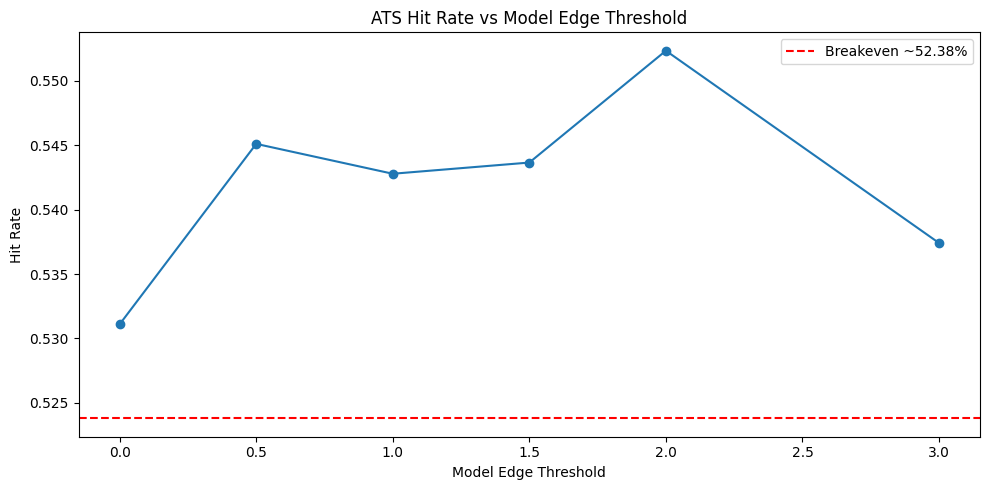

In [119]:
ats_summary, ats_detail = evaluate_against_spread(res2_weighted_rand, features_df)

Fitting 3 folds for each of 243 candidates, totalling 729 fits
FAST Refined GridSearch — best params:
{'regressor__colsample_bytree': 0.906135294962221, 'regressor__learning_rate': 0.009284955618415597, 'regressor__n_estimators': 384, 'regressor__reg_alpha': 5.383074779163264, 'regressor__reg_lambda': 3.4662220799093877}
Held-out TEST — MAE: 10.37 | R²: 0.17


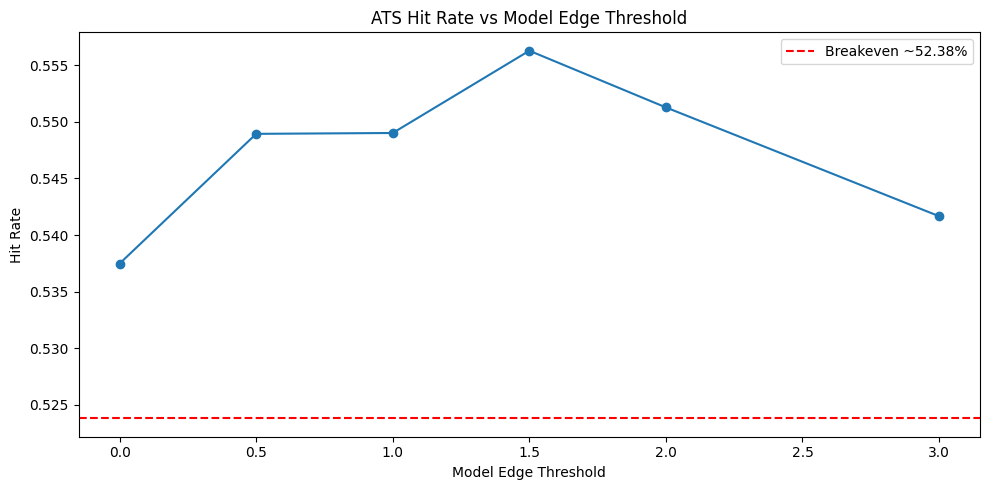

In [123]:
# Refined GridSearch for ATS-weighted model
from __future__ import annotations
import numpy as np
import pandas as pd
from dataclasses import dataclass, field
from typing import Dict, Any, List, Tuple, Optional

from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OrdinalEncoder
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split, KFold, cross_val_predict, GridSearchCV
from sklearn.metrics import mean_absolute_error, r2_score
from xgboost import XGBRegressor

# best params from RandomizedSearch
BEST_RANDOM = {
    'regressor__colsample_bytree': 0.856135294962221,
    'regressor__learning_rate': 0.010923477198135996,
    'regressor__max_depth': 2,
    'regressor__min_child_weight': 3,
    'regressor__n_estimators': 512,
    'regressor__reg_alpha': 4.883074779163264,
    'regressor__reg_lambda': 2.9662220799093877,
    'regressor__subsample': 0.5165253664502742,
}

# Configuration
@dataclass(frozen=True)
class RefineCfg:
    test_size: float = 0.2
    random_state: int = 42
    # Keep CV small to be fast
    oof_splits: int = 5
    cv_splits: int = 3

    # ATS weight scheme (fixed during refine)
    weight_win: float = 2.0
    weight_loss: float = 1.0

    # columns
    drop_non_features: Tuple[str, ...] = ('game_id','home_team','away_team','season','week')
    categorical_cols: Tuple[str, ...] = ('roof','surface')
    boolean_cols: Tuple[str, ...] = (
        'is_playoff','is_final_week','home_qb_switch','away_qb_switch','is_home_qb_new','is_away_qb_new'
    )

    # base params used ONLY for OOF weighting model (single-threaded; CV handles parallelism)
    base_xgb_params: Dict[str, Any] = field(default_factory=lambda: dict(
        n_estimators=500, max_depth=3, learning_rate=0.01, min_child_weight=3,
        subsample=0.6, colsample_bytree=0.6, reg_alpha=1.0, reg_lambda=3.0,
        objective='reg:squarederror', random_state=42, tree_method='hist', n_jobs=1
    ))

# Helpers
def _prepare_Xy(features_df: pd.DataFrame, cfg: RefineCfg):
    if 'game_margin' not in features_df.columns:
        raise ValueError("features_df must contain 'game_margin'.")
    y = features_df['game_margin'].astype(float)
    X = features_df.drop(columns=['game_margin'], errors='ignore')
    X = X.drop(columns=list(cfg.drop_non_features), errors='ignore').copy(deep=True)

    cats = [c for c in cfg.categorical_cols if c in X.columns]
    bools = [c for c in cfg.boolean_cols if c in X.columns]
    nums  = [c for c in X.columns if c not in set(cats) | set(bools)]
    for c in cats:
        X[c] = X[c].astype(str)
    return X, y, cats, bools, nums

def _preprocessor(cats: List[str], bools: List[str], nums: List[str]) -> ColumnTransformer:
    return ColumnTransformer(
        transformers=[
            ('cat', OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1), cats),
            ('num', 'passthrough', nums + bools),
        ],
        remainder='drop',
        verbose_feature_names_out=False,
    )

def _pipe(params: Dict[str, Any], pre: ColumnTransformer) -> Pipeline:
    return Pipeline([
        ('preprocessor', pre),
        ('regressor', XGBRegressor(**params)),
    ])

def _oof_ats_weights(X_tr, y_tr, spread_tr: pd.Series, pre: ColumnTransformer, cfg: RefineCfg):
    base = _pipe(cfg.base_xgb_params, pre)
    kf = KFold(n_splits=cfg.oof_splits, shuffle=True, random_state=cfg.random_state)
    y_oof = cross_val_predict(base, X_tr, y_tr, cv=kf, n_jobs=-1, method='predict')
    model_edge  = pd.Series(y_oof).reset_index(drop=True) - spread_tr.reset_index(drop=True).astype(float)
    actual_edge = y_tr.reset_index(drop=True) - spread_tr.reset_index(drop=True).astype(float)
    won = (np.sign(model_edge) == np.sign(actual_edge)) & (actual_edge != 0)
    return np.where(won, cfg.weight_win, cfg.weight_loss).astype(float)

# tight 3-point ranges helper
def _around(v, delta, lo, hi):
    vals = [v - delta, v, v + delta]
    return [float(min(hi, max(lo, x))) for x in vals]

# gridsearch
def run_refined_grid_fast(features_df: pd.DataFrame, cfg: Optional[RefineCfg] = None):
    cfg = cfg or RefineCfg()

    # Prep
    X, y, cats, bools, nums = _prepare_Xy(features_df, cfg)
    X_tr, X_te, y_tr, y_te, idx_tr, idx_te = train_test_split(
        X, y, np.arange(len(X)), test_size=cfg.test_size, random_state=cfg.random_state, shuffle=True
    )
    pre = _preprocessor(cats, bools, nums)

    # Spread for TRAIN fold to compute ATS weights
    if 'spread_line' not in features_df.columns:
        raise ValueError("features_df must include 'spread_line'.")
    spread_tr = features_df.iloc[idx_tr]['spread_line'].reset_index(drop=True)

    # OOF ATS weights (no leakage)
    sw = _oof_ats_weights(X_tr, y_tr, spread_tr, pre, cfg)

    # Seed estimator with random-search best (unprefixed)
    seed_params = {k.replace('regressor__',''): v for k, v in BEST_RANDOM.items()}
    # Fix some params to reduce combinations/time
    fixed = dict(
        max_depth=int(seed_params['max_depth']),
        min_child_weight=int(seed_params['min_child_weight']),
        subsample=float(seed_params['subsample']),          # keep fixed to cut grid size
        n_jobs=1,                                           # avoid nested parallelism
        objective='reg:squarederror',
        random_state=42,
        tree_method='hist',
    )

    # Build a *small* grid around the winner (5 params total → 3^5=243 combos)
    grid = {
        # n_estimators: ±128 around 512 → [384, 512, 640]
        'regressor__n_estimators': [max(300, seed_params['n_estimators'] - 128),
                                    seed_params['n_estimators'],
                                    seed_params['n_estimators'] + 128],
        # learning_rate: ±15% around best
        'regressor__learning_rate': _around(seed_params['learning_rate'], delta=seed_params['learning_rate']*0.15, lo=0.003, hi=0.05),
        # colsample_bytree: ±0.05
        'regressor__colsample_bytree': _around(seed_params['colsample_bytree'], delta=0.05, lo=0.5, hi=1.0),
        # reg_alpha / reg_lambda: ±0.5
        'regressor__reg_alpha': _around(seed_params['reg_alpha'], 0.5, lo=0.0, hi=20.0),
        'regressor__reg_lambda': _around(seed_params['reg_lambda'], 0.5, lo=0.01, hi=20.0),
        # fixed in estimator: max_depth, min_child_weight, subsample
    }

    # Base estimator (grid overrides only the keys above)
    base_params = dict(seed_params, **fixed)  # fixed keys overwrite seed
    base_est = _pipe(base_params, pre)

    # Small KFold to be fast
    cv = KFold(n_splits=cfg.cv_splits, shuffle=True, random_state=cfg.random_state)
    gs = GridSearchCV(
        estimator=base_est,
        param_grid=grid,
        scoring='neg_mean_absolute_error',
        cv=cv,
        n_jobs=-1,     # parallelize across folds/combos
        verbose=1,
        refit=True,
    )

    gs.fit(X_tr, y_tr, **{'regressor__sample_weight': sw})

    # Final eval
    final_pipe = gs.best_estimator_
    y_pred = final_pipe.predict(X_te)
    mae = mean_absolute_error(y_te, y_pred)
    r2  = r2_score(y_te, y_pred)

    print("FAST Refined GridSearch — best params:")
    print(gs.best_params_)
    print(f"Held-out TEST — MAE: {mae:.2f} | R²: {r2:.2f}")

    return {
        "mae": float(mae),
        "r2": float(r2),
        "y_test": y_te.reset_index(drop=True),
        "y_pred": pd.Series(y_pred),
        "pipeline": final_pipe,
        "grid_search": {
            "best_params": gs.best_params_,
            "best_cv_mae": float(-gs.best_score_),
            "combos": int(np.prod([len(v) for v in grid.values()])),
            "cv_splits": int(cfg.cv_splits),
        },
        "config": cfg,
    }


res_refined_fast = run_refined_grid_fast(features_df)
ats_summary_refined, ats_detail_refined = evaluate_against_spread(res_refined_fast, features_df)


####XGBoost - ATS Weighted - Best Params

Final (rounded) — MAE: 10.38 | R²: 0.18


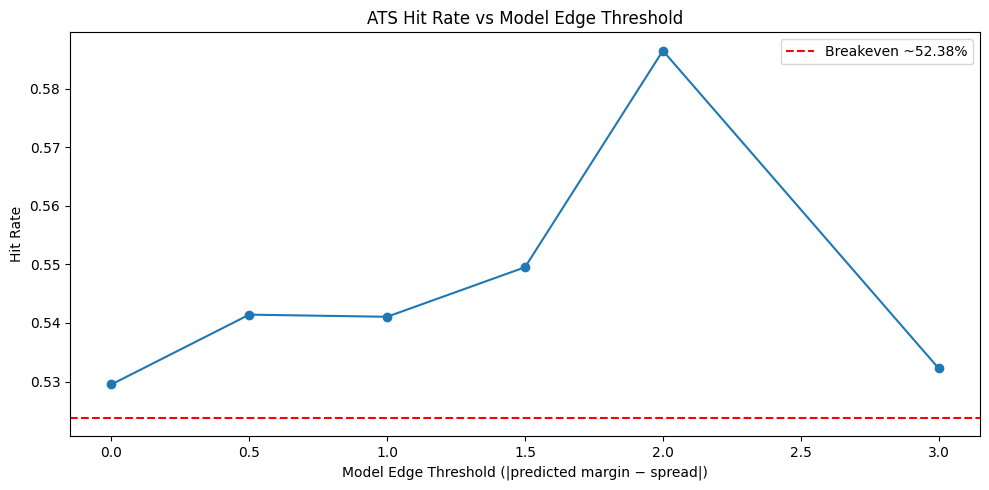

In [112]:
#Final ATS-weighted XGB (rounded params) + Evaluation
import numpy as np
import pandas as pd
from dataclasses import dataclass, field
from typing import List, Tuple, Dict, Any, Optional, Sequence

from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OrdinalEncoder
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split, KFold, cross_val_predict
from sklearn.metrics import mean_absolute_error, r2_score
from xgboost import XGBRegressor
import matplotlib.pyplot as plt

# Configuration
@dataclass(frozen=True)
class FinalCfg:
    test_size: float = 0.2
    random_state: int = 42
    oof_splits: int = 5
    weight_win: float = 2.0
    weight_loss: float = 1.0
    drop_non_features: Tuple[str, ...] = ('game_id','home_team','away_team','season','week')
    categorical_cols: Tuple[str, ...] = ('roof','surface')
    boolean_cols: Tuple[str, ...] = (
        'is_playoff','is_final_week','home_qb_switch','away_qb_switch','is_home_qb_new','is_away_qb_new'
    )
    # For OOF weighting model
    base_xgb_params: Dict[str, Any] = field(default_factory=lambda: dict(
        n_estimators=500, max_depth=3, learning_rate=0.01, min_child_weight=3,
        subsample=0.6, colsample_bytree=0.6, reg_alpha=1.0, reg_lambda=3.0,
        objective='reg:squarederror', random_state=42, tree_method='hist', n_jobs=1
    ))

# Helpers
def _prepare_Xy(features_df: pd.DataFrame, cfg: FinalCfg):
    if 'game_margin' not in features_df.columns:
        raise ValueError("features_df must contain 'game_margin'.")
    y = features_df['game_margin'].astype(float)
    X = features_df.drop(columns=['game_margin'], errors='ignore')
    X = X.drop(columns=list(cfg.drop_non_features), errors='ignore').copy(deep=True)

    cats = [c for c in cfg.categorical_cols if c in X.columns]
    bools = [c for c in cfg.boolean_cols if c in X.columns]
    nums  = [c for c in X.columns if c not in set(cats) | set(bools)]
    for c in cats:
        X[c] = X[c].astype(str)
    return X, y, cats, bools, nums

def _make_preprocessor(cats: List[str], bools: List[str], nums: List[str]) -> ColumnTransformer:
    return ColumnTransformer(
        transformers=[
            ('cat', OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1), cats),
            ('num', 'passthrough', nums + bools),
        ],
        remainder='drop',
        verbose_feature_names_out=False,
    )

def _compute_oof_ats_weights(X_tr, y_tr, spread_tr: pd.Series, pre: ColumnTransformer, cfg: FinalCfg):
    base = Pipeline([
        ('preprocessor', pre),
        ('regressor', XGBRegressor(**cfg.base_xgb_params)),
    ])
    kf = KFold(n_splits=cfg.oof_splits, shuffle=True, random_state=cfg.random_state)
    y_oof = cross_val_predict(base, X_tr, y_tr, cv=kf, n_jobs=-1, method='predict')

    model_edge  = pd.Series(y_oof).reset_index(drop=True) - spread_tr.reset_index(drop=True).astype(float)
    actual_edge = y_tr.reset_index(drop=True) - spread_tr.reset_index(drop=True).astype(float)
    won = (np.sign(model_edge) == np.sign(actual_edge)) & (actual_edge != 0)
    weights = np.where(won, cfg.weight_win, cfg.weight_loss).astype(float)
    return weights

def evaluate_against_spread(results: dict, features_df: pd.DataFrame,
                            spread_col: str="spread_line",
                            thresholds: Sequence[float]=(0.0, 0.5, 1.0, 1.5, 2.0, 3.0)):
    cfg = results["config"]
    y_test = results["y_test"].reset_index(drop=True)
    y_pred = results["y_pred"].reset_index(drop=True)

    idx = np.arange(len(features_df))
    _, test_idx = train_test_split(idx, test_size=cfg.test_size, random_state=cfg.random_state, shuffle=True)
    test_meta = features_df.iloc[test_idx].reset_index(drop=True)

    test_meta["actual_margin"] = y_test
    test_meta["model_margin"]  = y_pred
    test_meta["model_edge"]    = test_meta["model_margin"] - test_meta[spread_col]
    test_meta["actual_edge"]   = test_meta["actual_margin"] - test_meta[spread_col]
    test_meta["actual_cover"]  = np.sign(test_meta["actual_edge"]).astype(int)
    test_meta["model_cover"]   = np.sign(test_meta["model_edge"]).astype(int)
    test_meta["push"]          = (test_meta["actual_edge"] == 0).astype(int)

    def hit_row(t):
        sub = test_meta[np.abs(test_meta["model_edge"]) >= t]
        if sub.empty:
            return dict(Threshold=t, Bets=0, HitRate=np.nan, Pushes=0)
        non_push = sub[sub["actual_cover"] != 0]
        hr = np.nan if non_push.empty else (non_push["model_cover"] == non_push["actual_cover"]).mean()
        return dict(Threshold=t, Bets=int(len(sub)), HitRate=float(hr), Pushes=int(sub["push"].sum()))

    summary = pd.DataFrame([hit_row(t) for t in thresholds])

    # Plot
    plt.figure(figsize=(10, 5))
    plt.plot(summary["Threshold"], summary["HitRate"], marker="o")
    plt.axhline(0.5238, linestyle="--", color="red", label="Breakeven ~52.38%")
    plt.title("ATS Hit Rate vs Model Edge Threshold")
    plt.xlabel("Model Edge Threshold (|predicted margin − spread|)")
    plt.ylabel("Hit Rate")
    plt.legend()
    plt.tight_layout()
    plt.show()

    return summary, test_meta

# final params
final_params_rounded = {
    'n_estimators': 384,
    'max_depth': 2,
    'min_child_weight': 3,
    'learning_rate': 0.01,          # kept practical (rounding to 0.5 would break training)
    'subsample': 0.5,                # rounded from ~0.5165 to nearest 0.5
    'colsample_bytree': 1.0,         # rounded from ~0.906 to nearest 0.5
    'reg_alpha': 5.5,                # rounded from ~5.383 to nearest 0.5
    'reg_lambda': 3.5,               # rounded from ~3.466 to nearest 0.5
    'objective': 'reg:squarederror',
    'random_state': 42,
    'tree_method': 'hist',
    'n_jobs': 1
}

# Train & Evaluate
def run_final_rounded(features_df: pd.DataFrame, cfg: Optional[FinalCfg] = None):
    cfg = cfg or FinalCfg()

    # Prep & split
    X, y, cats, bools, nums = _prepare_Xy(features_df, cfg)
    X_tr, X_te, y_tr, y_te, idx_tr, idx_te = train_test_split(
        X, y, np.arange(len(X)), test_size=cfg.test_size,
        random_state=cfg.random_state, shuffle=True
    )
    pre = _make_preprocessor(cats, bools, nums)

    # OOF ATS weights on training fold (no leakage)
    if 'spread_line' not in features_df.columns:
        raise ValueError("features_df must include 'spread_line'.")
    spread_tr = features_df.iloc[idx_tr]['spread_line'].reset_index(drop=True)
    sw = _compute_oof_ats_weights(X_tr, y_tr, spread_tr, pre, cfg)

    # Fit final model
    pipe = Pipeline([
        ('preprocessor', pre),
        ('regressor', XGBRegressor(**final_params_rounded)),
    ])
    pipe.fit(X_tr, y_tr, regressor__sample_weight=sw)

    # Metrics
    y_pred = pipe.predict(X_te)
    mae = mean_absolute_error(y_te, y_pred)
    r2  = r2_score(y_te, y_pred)
    print(f"Final (rounded) — MAE: {mae:.2f} | R²: {r2:.2f}")

    results = {
        "mae": float(mae),
        "r2": float(r2),
        "y_test": y_te.reset_index(drop=True),
        "y_pred": pd.Series(y_pred),
        "pipeline": pipe,
        "used_columns": {"categorical": cats, "boolean": bools, "numeric": nums},
        "config": cfg,
    }
    return results

res_final = run_final_rounded(features_df)
ats_summary_final, ats_detail_final = evaluate_against_spread(res_final, features_df)


In [113]:
def evaluate_against_spread(results: dict, features_df: pd.DataFrame,
                            spread_col: str="spread_line",
                            thresholds: Sequence[float]=(0.0, 1.0, 2.0, 3.0, 4.0, 5.0),
                            true_bet_threshold: float = 1.0):
    cfg = results["config"]
    y_test = results["y_test"].reset_index(drop=True)
    y_pred = results["y_pred"].reset_index(drop=True)

    idx = np.arange(len(features_df))
    _, test_idx = train_test_split(idx, test_size=cfg.test_size, random_state=cfg.random_state, shuffle=True)
    test_meta = features_df.iloc[test_idx].reset_index(drop=True)

    test_meta["actual_margin"] = y_test
    test_meta["model_margin"]  = y_pred
    test_meta["model_edge"]    = test_meta["model_margin"] - test_meta[spread_col]
    test_meta["actual_edge"]   = test_meta["actual_margin"] - test_meta[spread_col]
    test_meta["actual_cover"]  = np.sign(test_meta["actual_edge"]).astype(int)
    test_meta["model_cover"]   = np.sign(test_meta["model_edge"]).astype(int)
    test_meta["push"]          = (test_meta["actual_edge"] == 0).astype(int)

    # --- Overall and True Bet % ---
    non_push = test_meta[test_meta["actual_cover"] != 0]
    overall_hit_rate = (non_push["model_cover"] == non_push["actual_cover"]).mean()

    true_bets = non_push[np.abs(non_push["model_edge"]) >= true_bet_threshold]
    true_bet_hit_rate = (true_bets["model_cover"] == true_bets["actual_cover"]).mean()

    print(f"Model beat spread in {overall_hit_rate*100:.2f}% of all games")
    print(f"True Bets (≥{true_bet_threshold} pts diff): {true_bet_hit_rate*100:.2f}% | Bets Placed: {len(true_bets)}")

    # Threshold table
    def hit_row(t):
        sub = non_push[np.abs(non_push["model_edge"]) >= t]
        if sub.empty:
            return dict(Threshold=t, Bets=0, HitRate=np.nan, Pushes=0)
        hr = (sub["model_cover"] == sub["actual_cover"]).mean()
        return dict(Threshold=t, Bets=int(len(sub)), HitRate=float(hr), Pushes=int(sub["push"].sum()))

    summary = pd.DataFrame([hit_row(t) for t in thresholds])

    # Plot
    plt.figure(figsize=(10, 5))
    plt.plot(summary["Threshold"], summary["HitRate"], marker="o")
    plt.axhline(0.5238, linestyle="--", color="red", label="Breakeven ~52.38%")
    plt.title("ATS Hit Rate vs Model Edge Threshold")
    plt.xlabel("Model Edge Threshold (|predicted margin − spread|)")
    plt.ylabel("Hit Rate")
    plt.legend()
    plt.tight_layout()
    plt.show()

    return summary, test_meta


Final (rounded) — MAE: 10.38 | R²: 0.18
Model beat spread in 52.95% of all games
True Bets (≥1.0 pts diff): 54.11% | Bets Placed: 414


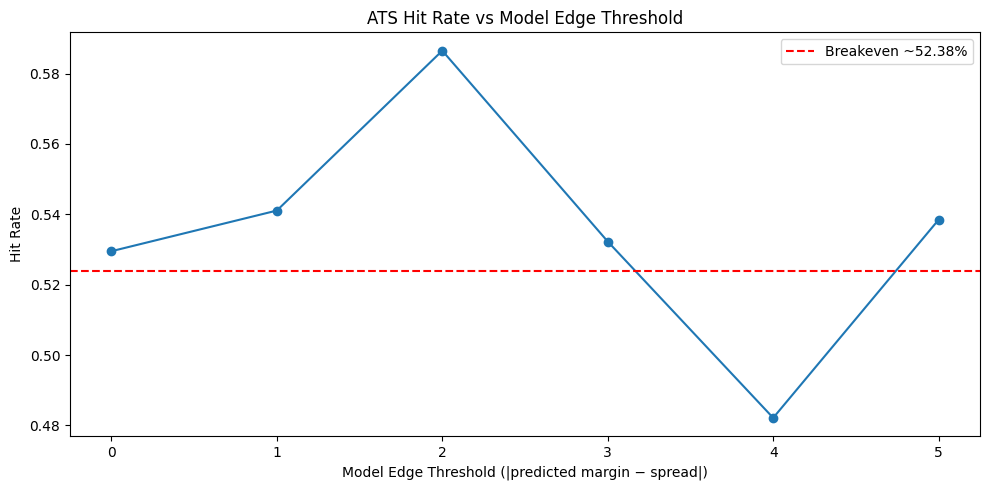

In [114]:
# 1 Train final rounded ATS-weighted model
res_final = run_final_rounded(features_df)

# 2Evaluate ATS performance & print bet percentages
ats_summary_final, ats_detail_final = evaluate_against_spread(res_final, features_df)


Reduced Model Weighted with same paramateres

In [115]:
# Ensure top_features list does not contain duplicates, and add required columns
reduced_cols = list(dict.fromkeys(top_features + ['game_margin', 'spread_line']))  # removes duplicates while keeping order

# Create reduced df
reduced_features_df = features_df[reduced_cols].copy()

Reduced Top-25 (rounded) — MAE: 10.37 | R²: 0.17
Model beat spread in 54.39% of all games
True Bets (≥1.0 pts diff): 53.03% | Bets Placed: 413


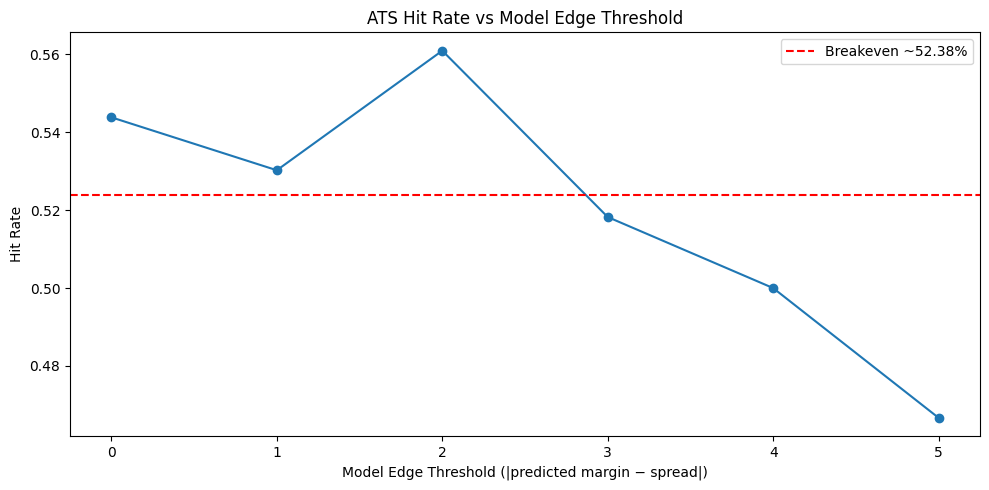

In [116]:
# Run ATS-weighted model on reduced Top-25 features
def run_final_rounded_reduced(reduced_features_df: pd.DataFrame, cfg: Optional[FinalCfg] = None):
    cfg = cfg or FinalCfg()

    # Prep & split
    X, y, cats, bools, nums = _prepare_Xy(reduced_features_df, cfg)
    X_tr, X_te, y_tr, y_te, idx_tr, idx_te = train_test_split(
        X, y, np.arange(len(X)), test_size=cfg.test_size,
        random_state=cfg.random_state, shuffle=True
    )
    pre = _make_preprocessor(cats, bools, nums)

    # OOF ATS weights on training fold (no leakage)
    if 'spread_line' not in reduced_features_df.columns:
        raise ValueError("reduced_features_df must include 'spread_line'.")
    spread_tr = reduced_features_df.iloc[idx_tr]['spread_line'].reset_index(drop=True)
    sw = _compute_oof_ats_weights(X_tr, y_tr, spread_tr, pre, cfg)

    # Fit model using same params as full version
    pipe = Pipeline([
        ('preprocessor', pre),
        ('regressor', XGBRegressor(**final_params_rounded)),
    ])
    pipe.fit(X_tr, y_tr, regressor__sample_weight=sw)

    # Evaluate
    y_pred = pipe.predict(X_te)
    mae = mean_absolute_error(y_te, y_pred)
    r2  = r2_score(y_te, y_pred)
    print(f"Reduced Top-25 (rounded) — MAE: {mae:.2f} | R²: {r2:.2f}")

    results = {
        "mae": float(mae),
        "r2": float(r2),
        "y_test": y_te.reset_index(drop=True),
        "y_pred": pd.Series(y_pred),
        "pipeline": pipe,
        "used_columns": {"categorical": cats, "boolean": bools, "numeric": nums},
        "config": cfg,
    }
    return results

res_final_reduced = run_final_rounded_reduced(reduced_features_df)
ats_summary_reduced, ats_detail_reduced = evaluate_against_spread(res_final_reduced, reduced_features_df)


##Side Project - Comparison

Our models are slightly below the results we are looking for. The time period of 2009-2025 is a long time. The way football is played changes a lot during that amount of time. We are going to only look at the last 5 years to see if this produces a better result. In theory, this might show more relevant trends to predicting games played today.

In [117]:
match_df.head()

,game_id,game_margin,spread_line,season,game_type,week,gameday,weekday,gametime,away_team,away_score,home_team,home_score,location,total,overtime,old_game_id,gsis,nfl_detail_id,pfr,pff,espn,ftn,away_rest,home_rest,away_moneyline,home_moneyline,away_spread_odds,home_spread_odds,total_line,under_odds,over_odds,div_game,roof,surface,temp,wind,away_qb_id,home_qb_id,away_qb_name,home_qb_name,away_coach,home_coach,referee,stadium_id,stadium,is_playoff,final_week,is_final_week,home_qb_switch,away_qb_switch,home_avg_epa,home_avg_yards,home_play_count,home_rolling_avg_epa,home_rolling_avg_yards,home_rolling_play_count,away_avg_epa,away_avg_yards,away_play_count,away_rolling_avg_epa,away_rolling_avg_yards,away_rolling_play_count,home_allowed_avg_epa,home_allowed_avg_yards,home_allowed_play_count,home_rolling_allowed_avg_epa,home_rolling_allowed_avg_yards,home_rolling_allowed_play_count,away_allowed_avg_epa,away_allowed_avg_yards,away_allowed_play_count,away_rolling_allowed_avg_epa,away_rolling_allowed_avg_yards,away_rolling_allowed_play_count,epa_home_off_away_def_rolling_diff,epa_home_def_away_off_rolling_diff,avg_yards_home_off_away_def_rolling_diff,avg_yards_home_def_away_off_rolling_diff,play_count_home_off_away_def_rolling_diff,play_count_home_def_away_off_rolling_diff,home_recent_sos_opponent_avg,home_season_sos_opponent_avg,away_recent_sos_opponent_avg,away_season_sos_opponent_avg,sos_diff,season_sos_diff,home_allpro_last_3_years_weighted,away_allpro_last_3_years_weighted,diff_allpro_last_3_years_weighted,home_allpro_prev_year,away_allpro_prev_year,diff_allpro_prev_year,home_offense_allpro_3_years,away_offense_allpro_3_years,home_defense_allpro_3_years,away_defense_allpro_3_years,allpro_diff_home_off_away_def_3_years,allpro_diff_home_def_away_off_3_years,home_offense_allpro_prev_year,away_offense_allpro_prev_year,home_defense_allpro_prev_year,away_defense_allpro_prev_year,allpro_diff_home_off_away_def_prev_year,allpro_diff_home_def_away_off_prev_year,league_rolling_avg_abs_margin_by_week,home_qbr_prev_year,away_qbr_prev_year,is_home_qb_new,is_away_qb_new,diff_qbr_prev_year,home_injured_count,away_injured_count,diff_injured_count,home_injured_allpro_weighted_count,away_injured_allpro_weighted_count,diff_injured_allpro_weighted_count,home_active_allpro_weighted,away_active_allpro_weighted,diff_active_allpro_weighted,home_injured_allpro_prev_year_count,away_injured_allpro_prev_year_count,home_active_allpro_prev_year,away_active_allpro_prev_year,diff_active_allpro_prev_year,home_rolling_win_pct,away_rolling_win_pct,sack_diff,sack_diff_reverse,turnover_diff,turnover_diff_reverse,third_down_diff,third_down_diff_reverse,cover_rate_diff,scoring_diff,scoring_diff_reverse,home_coach_win_pct_prior,away_coach_win_pct_prior
32,2009_03_CLE_BAL,31.0,13.5,2009,REG,3,2009-09-27,Sunday,13:00,CLE,3.0,BAL,34.0,Home,37.0,0.0,2009092700,54504.0,0,200909270rav,1434.0,290927033.0,0.0,7,7,620.0,-750.0,-110.0,102.0,38.5,-110.0,100.0,1,outdoors,sportturf,72.0,6.0,00-0025409,00-0026158,Brady Quinn,Joe Flacco,Eric Mangini,John Harbaugh,Terry McAulay,BAL00,M&T Bank Stadium,False,17,False,False,False,0.271927,7.257576,66.0,0.139008,5.538726,72.5,-0.367443,3.576923,52.0,-0.281558,4.060606,57.5,-0.367443,3.576923,52.0,-0.050452,5.673677,55.5,0.271927,7.257576,66.0,0.169139,5.597106,67.5,-0.030132,0.231107,-0.058380,1.613071,5.0,-2.0,1.0,1.0,1.0,1.0,0.0,0.0,24.0,6.0,18.0,5,1,4,6.0,6.0,18.0,0.0,6.0,12.0,1.0,1.0,4.0,0.0,1.0,3.0,10.0,47.100000,58.205556,0,1,-11.105556,0,0,0,0.0,0.0,0.0,24.0,6.0,18.0,0,0,5,1,4,1.0,0.0,-1.0,-2.0,1.0,1.5,0.017241,-0.115385,1.0,4.0,-12.0,0.714,0.451
33,2009_03_WAS_DET,5.0,-6.5,2009,REG,3,2009-09-27,Sunday,13:00,WAS,14.0,DET,19.0,Home,33.0,0.0,2009092702,54506.0,0,200909270det,1428.0,290927008.0,0.0,7,7,-260.0,228.0,102.0,-110.0,39.5,-108.0,-102.0,0,dome,fieldturf,0.0,0.0,00-0023460,00-0026498,Jason Campbell,Matthew Stafford,Jim Zorn,Jim Schwartz,Scott Green,DET00,Ford Field,False,17,False,False,False,0.065191,5.219178,73.0,-0.230076,4.0

In [118]:
#only keep last 5 seasons worth of data
recent_seasons = sorted(match_df['season'].unique())[-5:]
recent_df = match_df[match_df['season'].isin(recent_seasons)].copy()

recent_df = recent_df.drop(['week', 'season', 'game_type', 'gameday', 'weekday', 'gametime', 'away_team', 'home_team', 'away_score', 'home_score', 'location', 'total', 'overtime', 'old_game_id', 'gsis', 'nfl_detail_id', 'pfr', 'pff', 'espn', 'ftn',
                             'away_moneyline', 'home_moneyline', 'away_spread_odds', 'home_spread_odds', 'under_odds', 'over_odds', 'stadium', 'final_week', 'away_qb_id', 'home_qb_id', 'home_avg_epa', 'home_avg_yards', 'home_play_count', 'away_avg_epa', 'away_avg_yards', 'away_play_count',
                             'home_allowed_avg_epa', 'home_allowed_avg_yards', 'home_allowed_play_count', 'away_allowed_avg_epa', 'away_allowed_avg_yards', 'away_allowed_play_count', 'home_qb_name', 'away_qb_name', 'away_coach', 'home_coach', 'referee', 'stadium_id', 'home_injured_allpro_prev_year_count',
                             'away_injured_allpro_prev_year_count',	'home_active_allpro_prev_year',	'away_active_allpro_prev_year','home_injured_allpro_weighted_count',	'away_injured_allpro_weighted_count',	'diff_injured_allpro_weighted_count',	'home_active_allpro_weighted',	'away_active_allpro_weighted'
                             ], axis=1)

recent_df = recent_df.dropna()

recent_df.shape

(982, 81)

Number of Features:
79



Name of Features - Categorical and Quantative Respectively:
['roof', 'surface']



['spread_line', 'away_rest', 'home_rest', 'total_line', 'div_game', 'temp', 'wind', 'is_playoff', 'is_final_week', 'home_qb_switch', 'away_qb_switch', 'home_rolling_avg_epa', 'home_rolling_avg_yards', 'home_rolling_play_count', 'away_rolling_avg_epa', 'away_rolling_avg_yards', 'away_rolling_play_count', 'home_rolling_allowed_avg_epa', 'home_rolling_allowed_avg_yards', 'home_rolling_allowed_play_count', 'away_rolling_allowed_avg_epa', 'away_rolling_allowed_avg_yards', 'away_rolling_allowed_play_count', 'epa_home_off_away_def_rolling_diff', 'epa_home_def_away_off_rolling_diff', 'avg_yards_home_off_away_def_rolling_diff', 'avg_yards_home_def_away_off_rolling_diff', 'play_count_home_off_away_def_rolling_diff', 'play_count_home_def_away_off_rolling_diff', 'home_recent_sos_opponent_avg', 'home_season_sos_opponent_avg', 'away_recent_sos_opponent_avg', 'away_season_sos_opponent_avg', 's

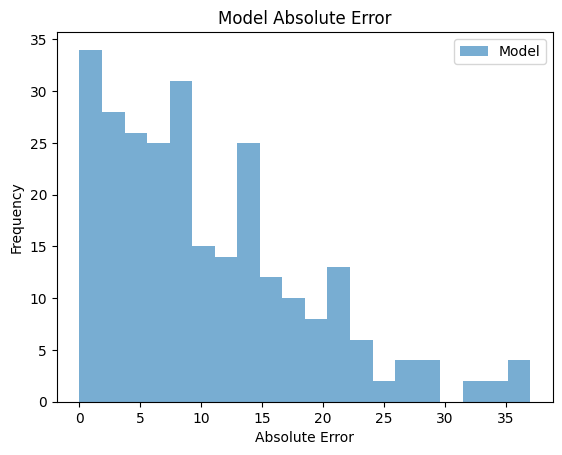

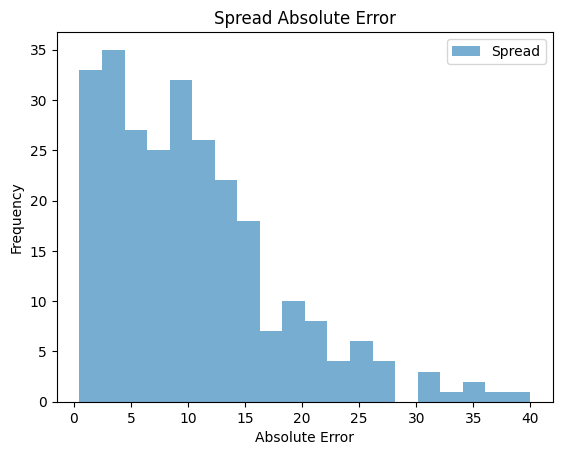




Substantial Differences: 
233



Most Important Value - True Bets - Model beat spread in 47.64% of the time





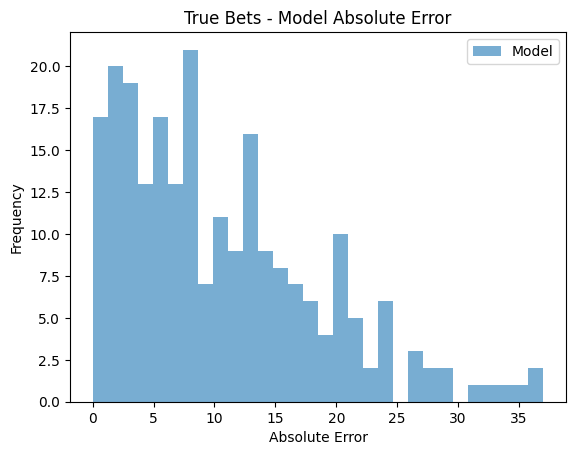

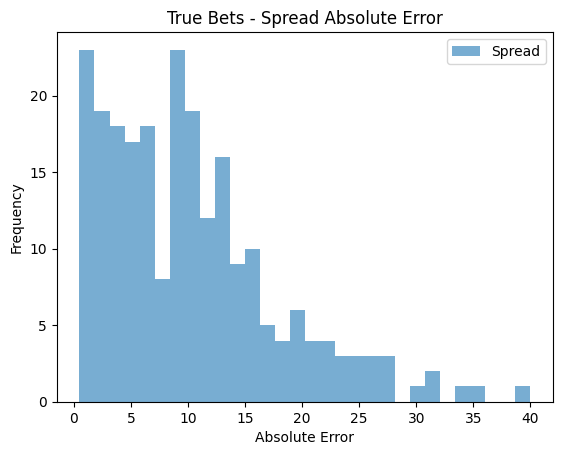




TRAIN MAE:
6.968149927219797



TRAIN R²:
0.5456799334393576



TEST MAE:
10.363610169491524



TEST R²:
0.13882898472420124








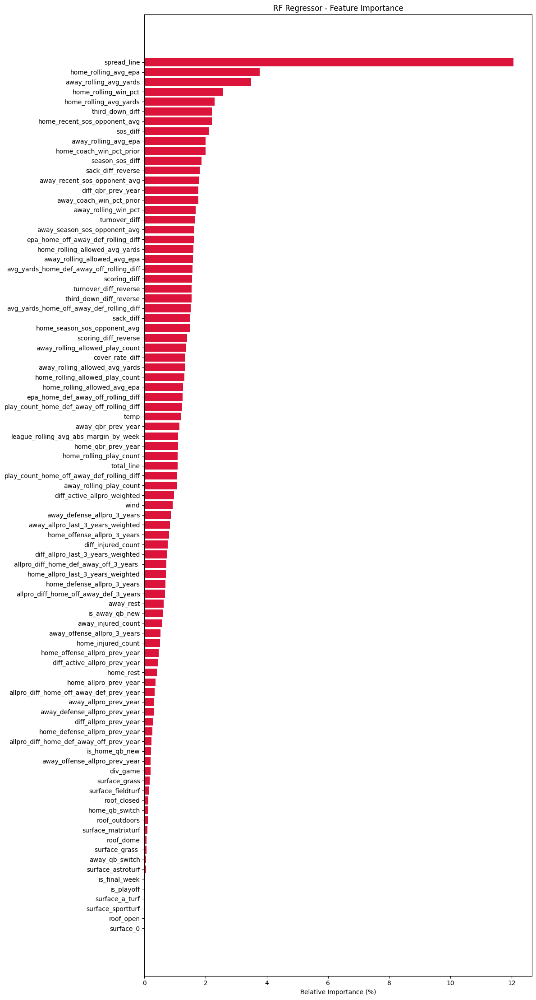

In [119]:
#same model as 5th iteration of RF regressor (best model) w/ only the last 5 seasons worth of data
recent_model, recent_eval = random_forest_regressor_v3_with_spread(recent_df)

In [120]:
recent_eval.head()

,game_id,game_margin,model_prediction,spread,model_vs_spread_diff,model_error,spread_error,model_vs_spread
739,2023_03_LAC_MIN,-4.0,-0.5,1.0,1.5,3.5,5.0,True
58,2020_07_NYG_PHI,1.0,2.5,5.0,2.5,1.5,4.0,True
518,2022_05_PIT_BUF,35.0,11.0,14.0,3.0,24.0,21.0,False
715,2022_18_NYG_PHI,6.0,9.0,16.5,7.5,3.0,10.5,True
195,2020_16_CHI_JAX,-24.0,-7.0,-9.5,2.5,17.0,14.5,False


random forest regressor - There seems to be a slight decrease in performance. That is expected. Less data would make it worse at predicting, but was still interesting to see if that was the case.

The true betting (difference of 1) winning percentage was almost the exact same at 47.64%. I wonder why that is the case. It could be possible it is variation, but it is an interesting note.

Gabe's model -

Iteration 2 - MAE: 10.28
Iteration 2 - R²: 0.07
Model beat spread in 51.28% of all games
True Bets (≥1.0 pts diff): 55.71% | Bets Placed: 140


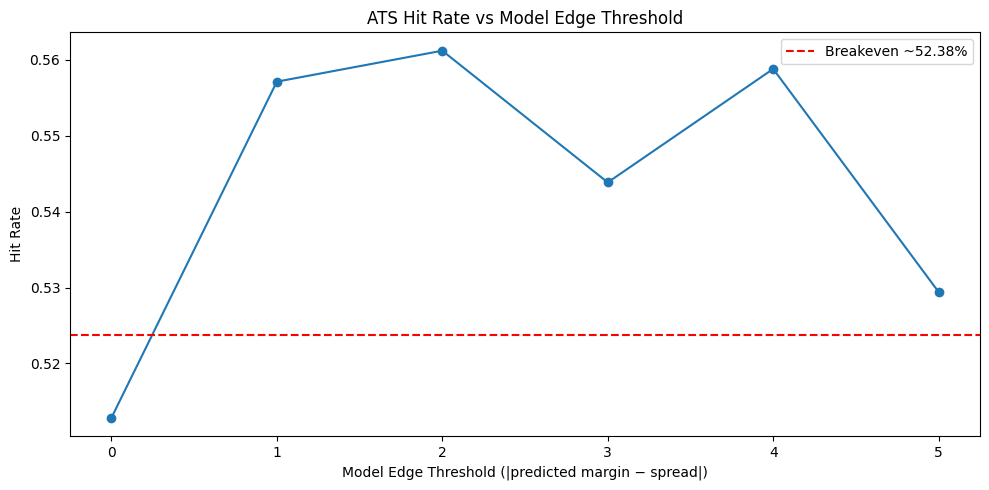

In [121]:
# Run Iteration 2 (full) model on last 5 years
res2_recent = run_iteration2(recent_df)

# Evaluate ATS for the recent period
ats_summary_recent, ats_detail_recent = evaluate_against_spread(res2_recent, recent_df)


Iteration 2 (ATS-weighted) - MAE: 10.34
Iteration 2 (ATS-weighted) - R²: 0.07
Model beat spread in 53.85% of all games
True Bets (≥1.0 pts diff): 54.29% | Bets Placed: 140


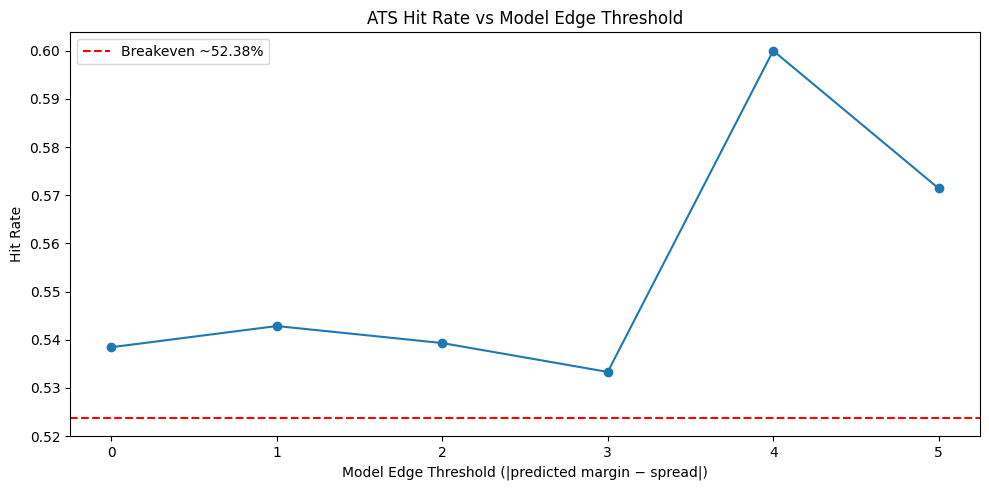

In [122]:


# Run ATS-weighted Iteration 2 model on last 5 years
res2_weighted_recent = run_iteration2_weighted(recent_df)

# Evaluate ATS performance for recent period
ats_summary_weighted_recent, ats_detail_weighted_recent = evaluate_against_spread(
    res2_weighted_recent, recent_df
)


##Evaluation Takeaways

Now we want to compare our model's to the spread line given to us in the dataset. The spread line is a value that shows what a sportsbook predicts the margin of victory will be (or at least what an even value is for the match).

Ex: if the patriots are supposed to win by 3 points over the colts then the spread would be patriots -3 which is equal to colts +3.

Lets say the end of game result is Patriots win 27-21. This means to win the bet we would've had to say (before the game starts) that the Patriots are going win by more than 3 points. That would qualify as a winning bet.

NOTE - it does not matter how much the Patriots win by as long as they win by more than 3 points. If they win by 50 points or 3 points we still win the bet.


***Random Forest Regressor Model Evaluation***

**1st Iteration (all features, no hyperparameter tuning):**

Overall bet winning percentage - 42.96%

Difference of 1 bet winning percentage - 42.75%

Train MAE - 3.97

Train r2 - 87.79%

Test MAE - 10.69

Test r2 - 9.54%

takeaway - clear overfitting

**2nd Iteration (removing redundant features, adding max depth):**

Overall bet winning percentage - 42.54%

Difference of 1 bet winning percentage - 41.59%

Train MAE - 6.70

Train r2 - 67.58%

Test MAE - 10.82

Test r2 - 7.38

takeaway - decreased overfitting, slight loss of test performance

**3rd Iteration (removing features with less than 1% importance from 2nd iteration, using more hyperparameter tuning):**

Overall bet winning percentage - 44.84%

Difference of 1 bet winning percentage - 43.38%

Train MAE - 10.27

Train r2 - 15.87%

Test MAE - 10.65

Test r2 - 9.22%

takeaway - marginal overfitting (potential underfitting), Performance not as good as 1st iteration, but similar (or slightly better) than the model from iteration 2.

**4th Iteration (1st iteration model with hyperparameter tuning):**

Overall bet winning percentage - 47.51%

Difference of 1 bet winning percentage - 47.12%

Train MAE - 7.50

Train r2 - 51.87%

Test MAE - 10.29

Test r2 - 13.45%

takeaway - Hyperparameter tuning was critical to reduce overfitting. Keeping all features gives best results, unsurprisingly. Gain is still marginal, but every percent difference matters.

**5th Iteration (4th iteration model with spread line included):**

Overall bet winning percentage - 49.88% (best value)

Difference of 1 bet winning percentage - 47.74%

Train MAE - 7.32

Train r2 - 53.85%

Test MAE - 10.09

Test r2 - 16.70%

takeaway - Adding the spread line as a feature improves are model slightly.

***XGBoost Model Evaluation***

**2nd Iteration:**

Iteration 2 - MAE: 10.24
Iteration 2 - R²: 0.19

Model beat spread in 46.94% of all games
True Bets (>=1pt diff): Model beat spread 45.77% of the time
Number of True Bets: 426

**Top 25 Features of Iteration 2:**

Reduced Feature Model - MAE: 10.23
Reduced Feature Model - R²: 0.19

Model beat spread in 46.94% of all games
True Bets (>=1pt diff): Model beat spread 45.77% of the time
Number of True Bets: 426

**Trimmed Model:**
Trimmed Model MAE: 10.24
Trimmed Model R²: 0.19

Model beat spread in 46.94% of all games
True Bets (>=1pt diff): Model beat spread 45.77% of the time
Number of True Bets: 426

**Trimmed w/ Reduced Features:**

Top 25 Trimmed Model MAE: 10.23
Top 25 Trimmed Model R²: 0.19

Model beat spread in 47.20% of all games
True Bets (>=1pt diff): Model beat spread 45.79% of the time
Number of True Bets: 463